In [46]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import io
from math import sqrt
from sklearn.metrics import mean_squared_error, mean_absolute_error


file_path = 'multiTimeline-n.csv' 

plt.rcParams.update({'figure.figsize': (12, 6), 'figure.dpi': 120})
df = pd.read_csv(file_path,index_col='Month',parse_dates=True)
df.head()


,SerieA,Bundesliga,MLB,eredivisie
Month,,,,
2004-01-01,4,3,6,<1
2004-02-01,4,5,7,<1
2004-03-01,4,6,11,1
2004-04-01,3,6,19,<1
2004-05-01,3,6,16,<1


### Replacing values

In [47]:
df['eredivisie'] = df['eredivisie'].replace('<1', 0.5).astype(float)
print(df.head())
print(df.shape[0])

            SerieA  Bundesliga  MLB  eredivisie
Month                                          
2004-01-01       4           3    6         0.5
2004-02-01       4           5    7         0.5
2004-03-01       4           6   11         1.0
2004-04-01       3           6   19         0.5
2004-05-01       3           6   16         0.5
244


Here, an insignificant number of searches for Eredivise(<1) is quantified as 0.5 for the more accurate forecasting.

### Outlier Analysis

In [48]:

Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
for column in df.select_dtypes(include=[np.number]).columns:
    df[column] = np.where(df[column] < lower_bound[column], lower_bound[column], df[column])
    df[column] = np.where(df[column] > upper_bound[column], upper_bound[column], df[column])


### Correlation Analysis

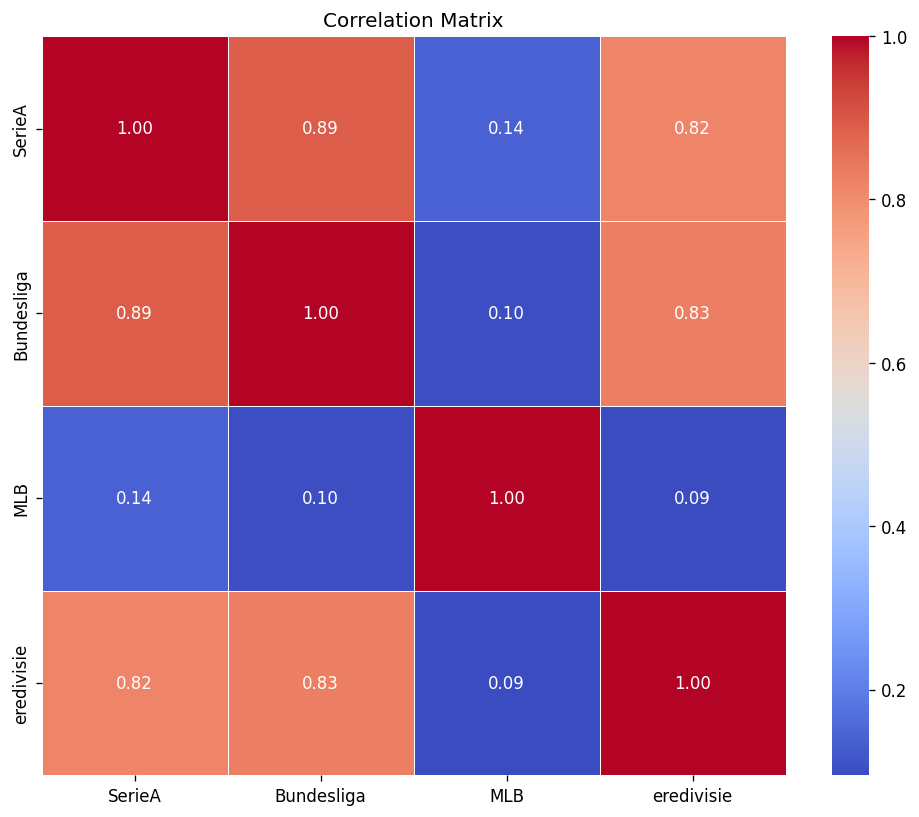

In [49]:
import seaborn as sns
import matplotlib.pyplot as plt


corr_matrix = df.corr()


plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix')
plt.show()


In [50]:
print(df.describe())
df_copy=df

           SerieA  Bundesliga         MLB  eredivisie
count  244.000000  244.000000  244.000000  244.000000
mean    18.447234   12.625000   26.512295    1.635246
std     16.844318    9.110631   18.848646    0.962329
min      2.000000    2.000000    5.000000    0.500000
25%      5.000000    6.000000    9.000000    1.000000
50%     12.000000    9.000000   23.000000    1.000000
75%     25.250000   17.250000   39.250000    2.000000
max     55.625000   34.125000   76.000000    3.500000


In [51]:

from statsmodels.tsa.seasonal import seasonal_decompose 
from statsmodels.tsa.holtwinters import SimpleExpSmoothing   
from statsmodels.tsa.holtwinters import ExponentialSmoothing


## Visualize the data 

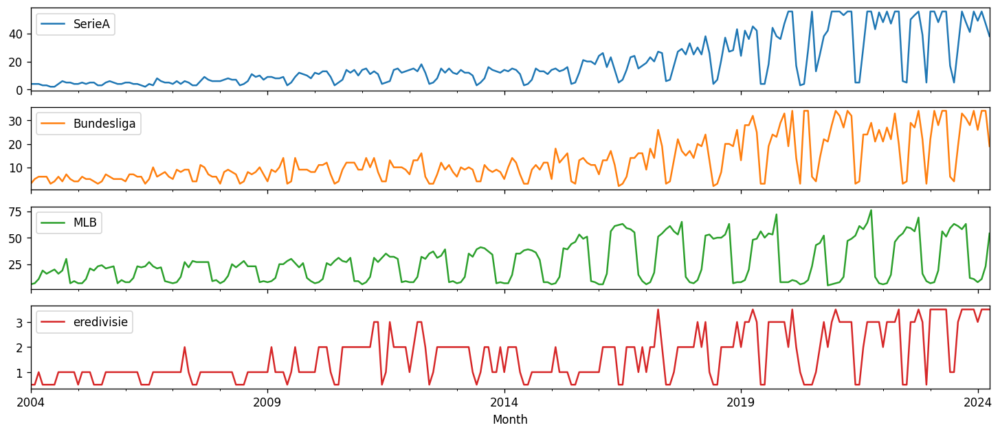

In [52]:

df.plot(subplots=True, figsize=(15,6))
plt.show()

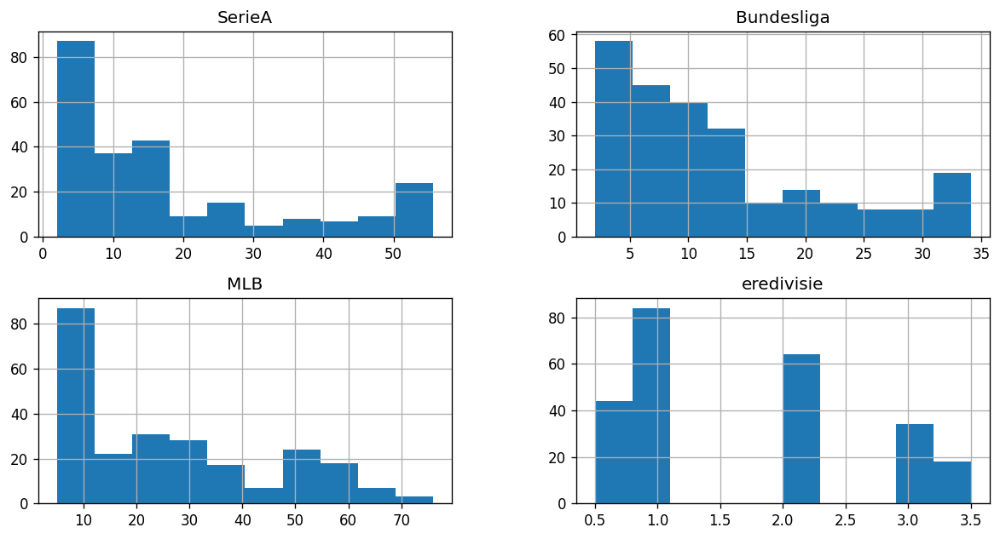

In [53]:

df.hist( )
plt.show()

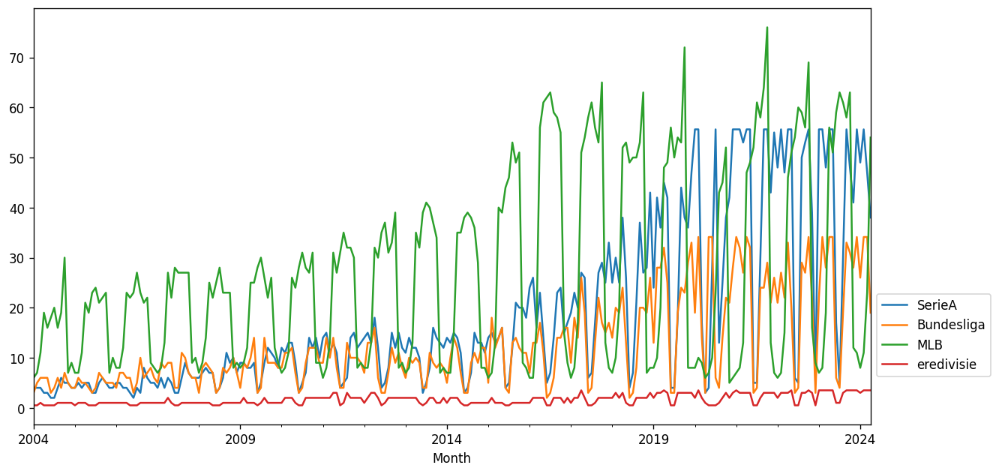

In [54]:
ax=df.plot()
ax.autoscale(axis='x',tight=True)
ax.legend(loc=3,bbox_to_anchor=(1.0,0.1))


ax=df.plot.area()
ax.autoscale(axis='x',tight=True)
ax.legend(loc=3,bbox_to_anchor=(1.0,0.1))

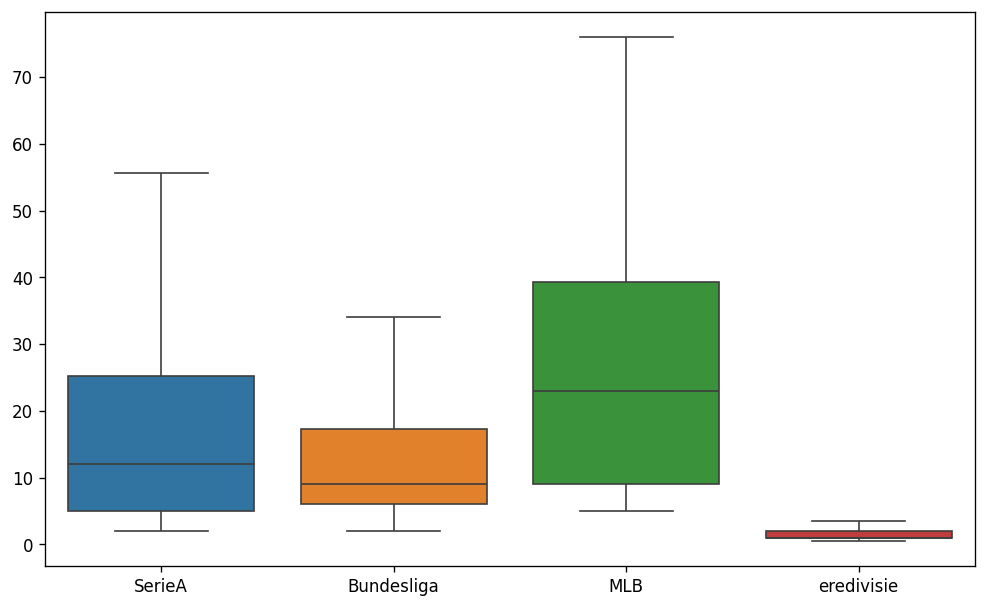

In [55]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df)
plt.show()


# TRAIN and TEST

In [56]:


split_point = int(len(df) * 0.8) 

train, test = df.iloc[:split_point, :].copy(), df.iloc[split_point:, :].copy()

print(train.head())
print(len(train))

            SerieA  Bundesliga   MLB  eredivisie
Month                                           
2004-01-01     4.0         3.0   6.0         0.5
2004-02-01     4.0         5.0   7.0         0.5
2004-03-01     4.0         6.0  11.0         1.0
2004-04-01     3.0         6.0  19.0         0.5
2004-05-01     3.0         6.0  16.0         0.5
195


In [57]:
print(test)
print(len(test))

            SerieA  Bundesliga   MLB  eredivisie
Month                                           
2020-04-01   3.000       3.000   6.0         1.0
2020-05-01   4.000      34.125   7.0         0.5
2020-06-01  28.000      34.125  10.0         0.5
2020-07-01  55.625       6.000  23.0         0.5
2020-08-01  13.000       4.000  43.0         1.0
2020-09-01  25.000      14.000  45.0         2.0
2020-10-01  38.000      22.000  52.0         3.0
2020-11-01  42.000      21.000   5.0         2.0
2020-12-01  55.625      28.000   6.0         3.0
2021-01-01  55.625      34.125   7.0         3.5
2021-02-01  55.625      32.000   8.0         3.0
2021-03-01  53.000      27.000  13.0         3.0
2021-04-01  55.625      34.125  47.0         3.0
2021-05-01  55.625      32.000  49.0         3.0
2021-06-01   5.000       3.000  52.0         0.5
2021-07-01   5.000       4.000  61.0         0.5
2021-08-01  30.000      24.000  58.0         2.0
2021-09-01  55.625      24.000  64.0         3.0
2021-10-01  55.625  

# Serie A

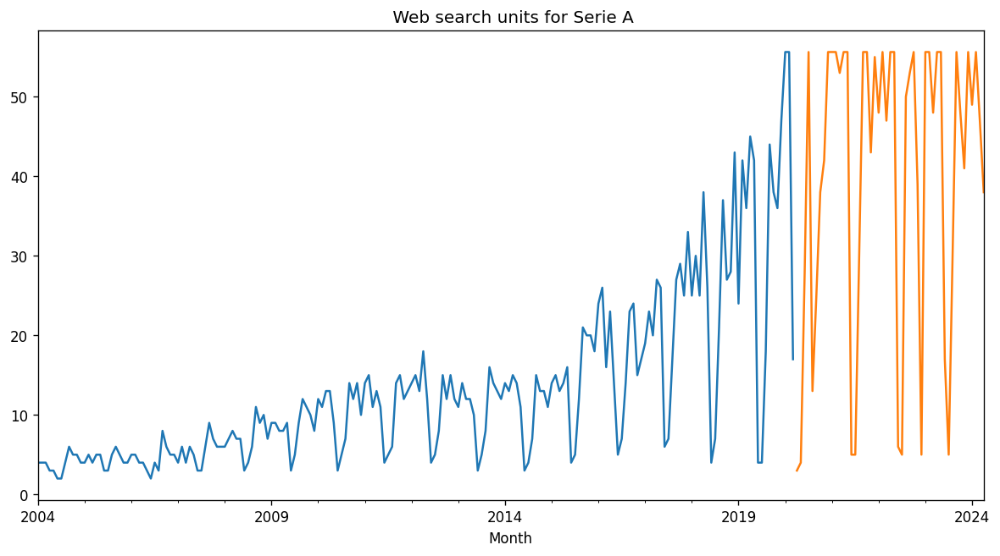

In [58]:
train.SerieA.plot(title=" Web Search units for Serie A")
test.SerieA.plot(title=" Web search units for Serie A")
plt.show()

### Simple Average
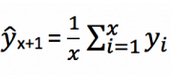

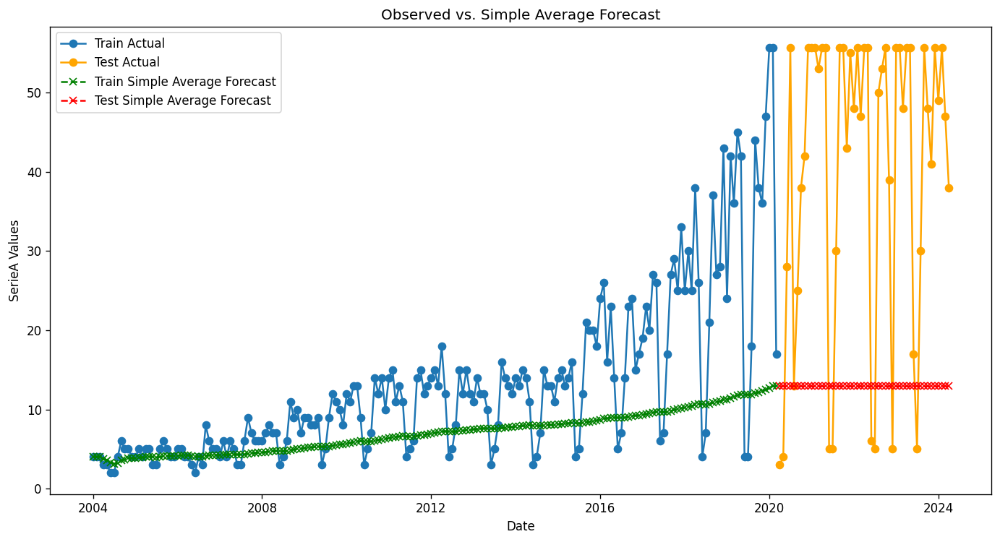

Train RMSE with Simple Average Forecast: 10.635724919878387
Test RMSE with Simple Average Forecast: 33.27338845957996
Train MAE with Simple Average Forecast: 6.913447244031167
Test MAE with Simple Average Forecast: 30.075392464678178
Train MAPE with Simple Average Forecast: 46.2689545172225
Test MAPE with Simple Average Forecast: 87.93172066098643
Train MSE with Simple Average Forecast: 113.11864457132212
Test MSE with Simple Average Forecast: 1107.118379582109


In [59]:
def calculate_mape(actual, forecast):
    actual, forecast = np.array(actual), np.array(forecast)
    actual = np.where(actual == 0, np.finfo(float).eps, actual)  
    return np.mean(np.abs((actual - forecast) / actual)) * 100

simple_average = train['SerieA'].mean()

train['simple_avg_forecast'] = [train['SerieA'][:i].mean() for i in range(1, len(train['SerieA'])+1)]
test['simple_avg_forecast'] = simple_average

train_rmse_simple_avg = np.sqrt(mean_squared_error(train['SerieA'].iloc[1:], train['simple_avg_forecast'].iloc[1:]))
test_rmse_simple_avg = np.sqrt(mean_squared_error(test['SerieA'], test['simple_avg_forecast']))

train_mape_simple_avg = calculate_mape(train['SerieA'].iloc[1:], train['simple_avg_forecast'].iloc[1:])
test_mape_simple_avg = calculate_mape(test['SerieA'], test['simple_avg_forecast'])

train_mae_simple_avg = mean_absolute_error(train['SerieA'].iloc[1:], train['simple_avg_forecast'].iloc[1:])
test_mae_simple_avg = mean_absolute_error(test['SerieA'], test['simple_avg_forecast'])

train_mse_simple_avg = mean_squared_error(train['SerieA'].iloc[1:], train['simple_avg_forecast'].iloc[1:])
test_mse_simple_avg = mean_squared_error(test['SerieA'], test['simple_avg_forecast'])

plt.figure(figsize=(14, 7))
plt.plot(train.index, train['SerieA'], label='Train Actual', marker='o')
plt.plot(test.index, test['SerieA'], label='Test Actual', marker='o', color='orange')
plt.plot(train.index, train['simple_avg_forecast'], label='Train Simple Average Forecast', linestyle='--', marker='x', color='green')
plt.plot(test.index, [simple_average]*len(test), label='Test Simple Average Forecast', linestyle='--', marker='x', color='red')
plt.title('Observed vs. Simple Average Forecast')
plt.xlabel('Date')
plt.ylabel('SerieA Values')
plt.legend()
plt.show()

print(f'Train RMSE with Simple Average Forecast: {train_rmse_simple_avg}')
print(f'Test RMSE with Simple Average Forecast: {test_rmse_simple_avg}')
print(f'Train MAE with Simple Average Forecast: {train_mae_simple_avg}')
print(f'Test MAE with Simple Average Forecast: {test_mae_simple_avg}')
print(f'Train MAPE with Simple Average Forecast: {train_mape_simple_avg}')
print(f'Test MAPE with Simple Average Forecast: {test_mape_simple_avg}')
print(f'Train MSE with Simple Average Forecast: {train_mse_simple_avg}')
print(f'Test MSE with Simple Average Forecast: {test_mse_simple_avg}')


### Simple Moving Average

Train Metrics:
MAE: 4.549262152777778
MSE: 59.244294343171305
RMSE: 7.697031528009438
MAPE: 53.037225217268336%

Test Metrics:
MAE: 15.278061224489797
MSE: 362.171875
RMSE: 19.030813829156124
MAPE: 161.02808290451634%


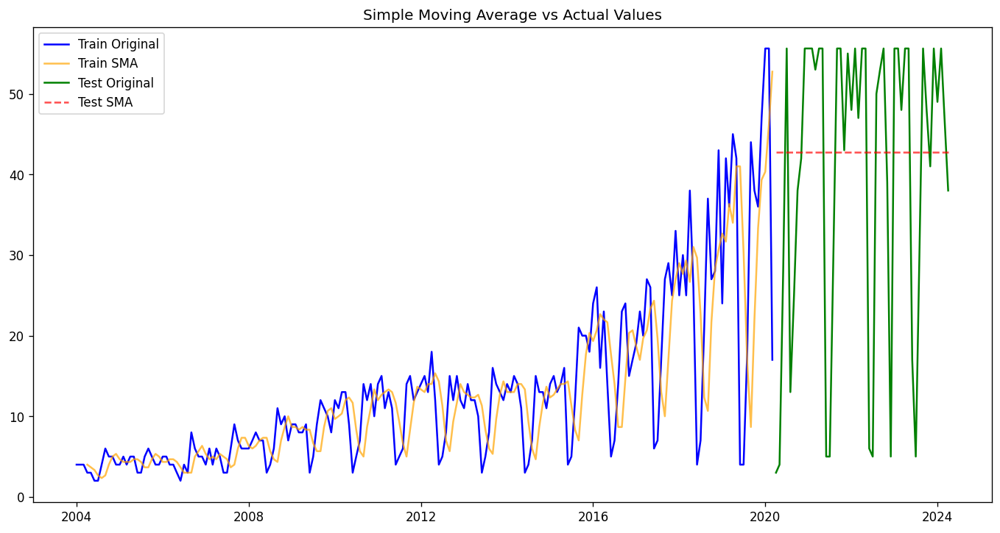

In [60]:

def calculate_mape(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

window_size = 3
train['SMA'] = train['SerieA'].rolling(window=window_size).mean().shift(1)
test['SMA'] = train['SerieA'].iloc[-window_size:].mean()

train_mae = mean_absolute_error(train['SerieA'][window_size:], train['SMA'].dropna())
train_mse = mean_squared_error(train['SerieA'][window_size:], train['SMA'].dropna())
train_rmse = np.sqrt(train_mse)
train_mape = calculate_mape(train['SerieA'][window_size:], train['SMA'].dropna())

test_mae = mean_absolute_error(test['SerieA'], test['SMA'])
test_mse = mean_squared_error(test['SerieA'], test['SMA'])
test_rmse = np.sqrt(test_mse)
test_mape = calculate_mape(test['SerieA'], test['SMA'])

print('Train Metrics:')
print(f'MAE: {train_mae}')
print(f'MSE: {train_mse}')
print(f'RMSE: {train_rmse}')
print(f'MAPE: {train_mape}%')

print('\nTest Metrics:')
print(f'MAE: {test_mae}')
print(f'MSE: {test_mse}')
print(f'RMSE: {test_rmse}')
print(f'MAPE: {test_mape}%')

plt.figure(figsize=(14, 7))
plt.plot(train['SerieA'], label='Train Original', color='blue')
plt.plot(train['SMA'], label='Train SMA', color='orange', alpha=0.7)
plt.plot(test['SerieA'], label='Test Original', color='green')
plt.plot(test['SMA'], label='Test SMA', color='red', linestyle='--', alpha=0.7)
plt.title('Simple Moving Average vs Actual Values')
plt.legend()
plt.show()


### Single Exponential Smoothing

/opt/homebrew/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Train Metrics:
MAE: 4.3210032050204665
MSE: 47.0826890687706
RMSE: 6.861682670363779
MAPE: 49.00129945690621%

Test Metrics:
MAE: 17.339565516856688
MSE: 371.6305281721581
RMSE: 19.277721031599096
MAPE: 142.1703352510507%


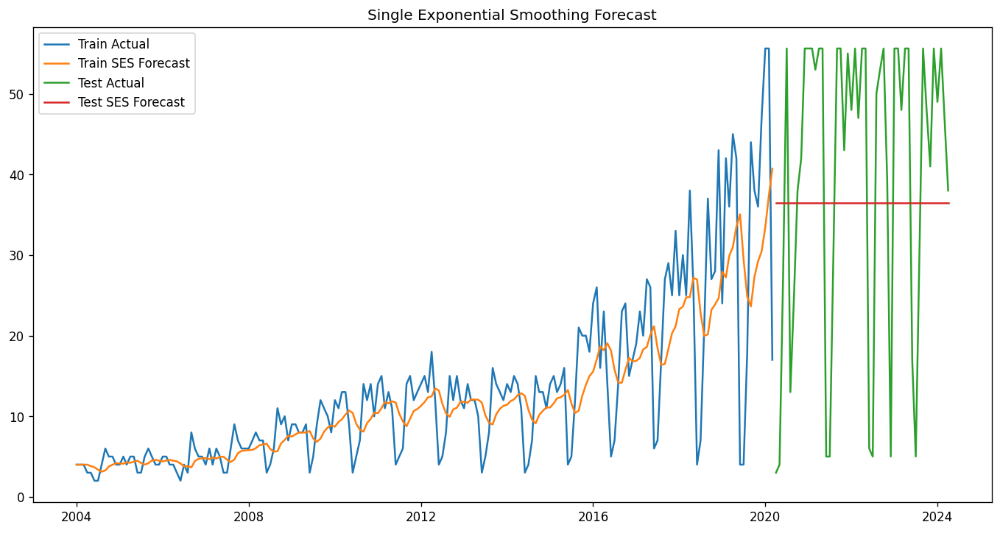

In [61]:
ses_model = SimpleExpSmoothing(train['SerieA']).fit(optimized=True)


train['SES'] = ses_model.fittedvalues


test['SES'] = ses_model.forecast(steps=len(test))


train_mae = mean_absolute_error(train['SerieA'], train['SES'])
train_mse = mean_squared_error(train['SerieA'], train['SES'])
train_rmse = np.sqrt(train_mse)
train_mape = np.mean(np.abs((train['SerieA'] - train['SES']) / train['SerieA'])) * 100


test_mae = mean_absolute_error(test['SerieA'], test['SES'])
test_mse = mean_squared_error(test['SerieA'], test['SES'])
test_rmse = np.sqrt(test_mse)
test_mape = np.mean(np.abs((test['SerieA'] - test['SES']) / test['SerieA'])) * 100


print('Train Metrics:')
print(f'MAE: {train_mae}')
print(f'MSE: {train_mse}')
print(f'RMSE: {train_rmse}')
print(f'MAPE: {train_mape}%')

print('\nTest Metrics:')
print(f'MAE: {test_mae}')
print(f'MSE: {test_mse}')
print(f'RMSE: {test_rmse}')
print(f'MAPE: {test_mape}%')


plt.figure(figsize=(14, 7))
plt.plot(train['SerieA'], label='Train Actual')
plt.plot(train['SES'], label='Train SES Forecast')
plt.plot(test['SerieA'], label='Test Actual')
plt.plot(test['SES'], label='Test SES Forecast')
plt.title('Single Exponential Smoothing Forecast')
plt.legend()
plt.show()

### ETS

/opt/homebrew/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Train Metrics:
MAE: 2.362531173936453
MSE: 16.524342261696933
RMSE: 4.065014423307368
MAPE: 21.39050008847483%

Test Metrics:
MAE: 12.826440711382368
MSE: 315.57260150832775
RMSE: 17.764363245225756
MAPE: 129.74896664577582%


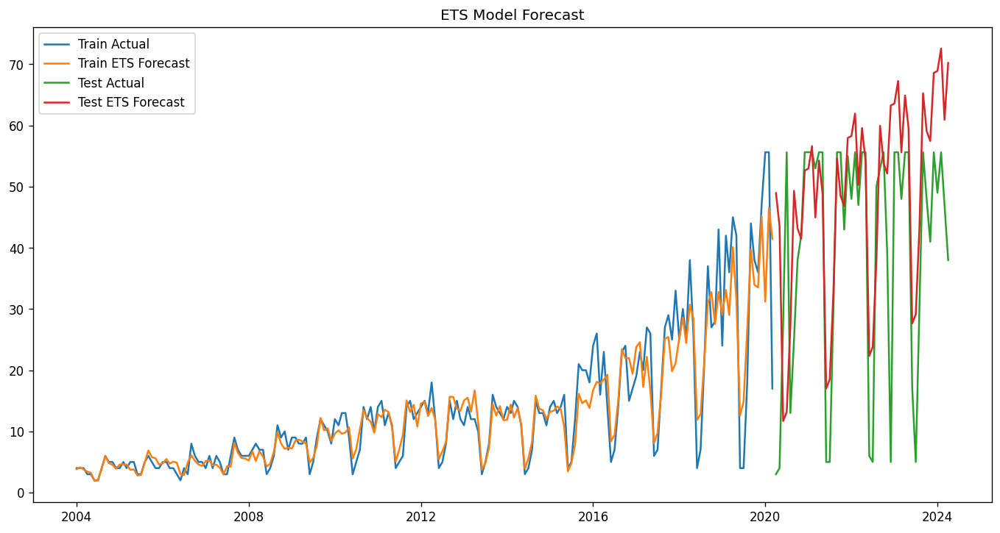

In [62]:


def calculate_mape(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100


ets_model = ExponentialSmoothing(
    train['SerieA'], 
    trend="add", 
    seasonal="add", 
    seasonal_periods=12
).fit()


train['ETS'] = ets_model.fittedvalues


test['ETS'] = ets_model.forecast(steps=len(test))


train_mae = mean_absolute_error(train['SerieA'], train['ETS'])
train_mse = mean_squared_error(train['SerieA'], train['ETS'])
train_rmse = np.sqrt(train_mse)
train_mape = calculate_mape(train['SerieA'], train['ETS'])


test_mae = mean_absolute_error(test['SerieA'], test['ETS'])
test_mse = mean_squared_error(test['SerieA'], test['ETS'])
test_rmse = np.sqrt(test_mse)
test_mape = calculate_mape(test['SerieA'], test['ETS'])


print('Train Metrics:')
print(f'MAE: {train_mae}')
print(f'MSE: {train_mse}')
print(f'RMSE: {train_rmse}')
print(f'MAPE: {train_mape}%')

print('\nTest Metrics:')
print(f'MAE: {test_mae}')
print(f'MSE: {test_mse}')
print(f'RMSE: {test_rmse}')
print(f'MAPE: {test_mape}%')


plt.figure(figsize=(14, 7))
plt.plot(train['SerieA'], label='Train Actual')
plt.plot(train['ETS'], label='Train ETS Forecast')
plt.plot(test['SerieA'], label='Test Actual')
plt.plot(test['ETS'], label='Test ETS Forecast')
plt.title('ETS Model Forecast')
plt.legend()
plt.show()


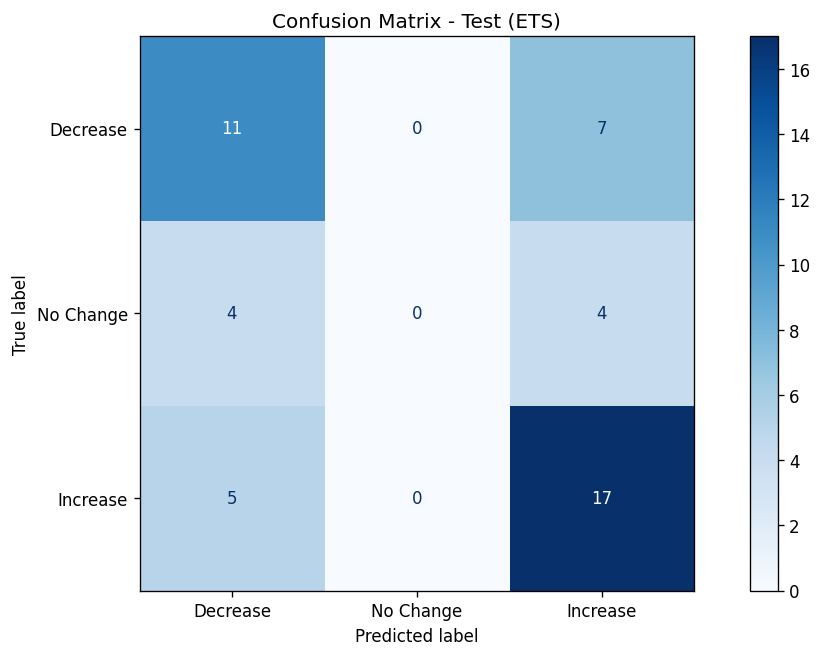

In [63]:

actual_train_change = np.sign(np.diff(train['SerieA'].values))
actual_test_change = np.sign(np.diff(test['SerieA'].values))

predicted_train_change = np.sign(np.diff(train['ETS'].values))
predicted_test_change = np.sign(np.diff(test['ETS'].values))

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm_train = confusion_matrix(actual_train_change, predicted_train_change, labels=[-1, 0, 1])
cm_test = confusion_matrix(actual_test_change, predicted_test_change, labels=[-1, 0, 1])


disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=['Decrease', 'No Change', 'Increase'])
disp_test.plot(cmap='Blues')
plt.title('Confusion Matrix - Test (ETS)')
plt.show()


### Naive Forecast

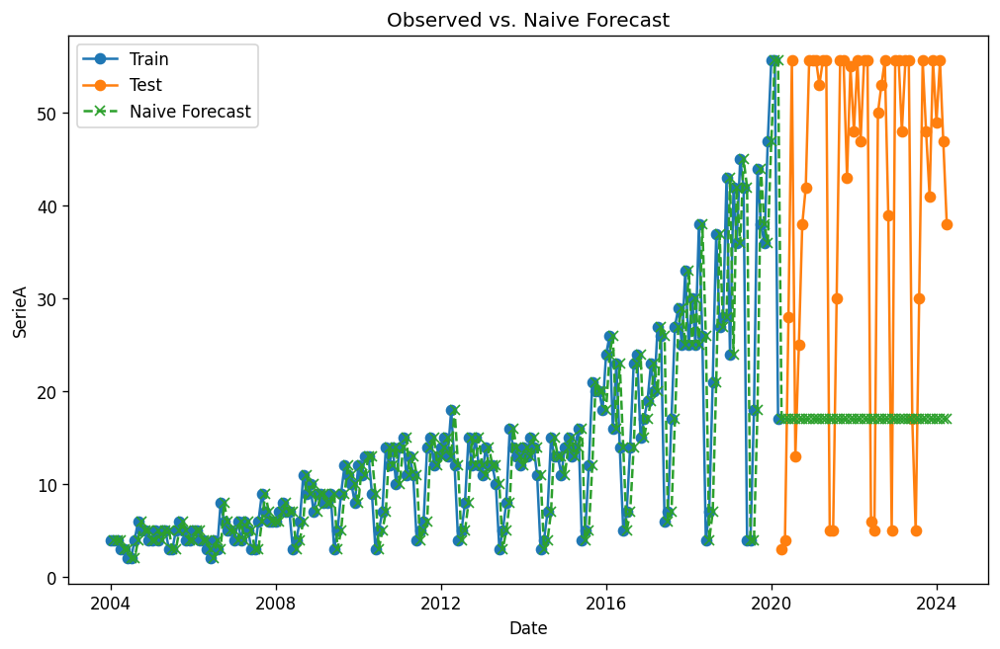

Train RMSE: 6.918256607306214
Train MAE: 4.042525773195877
Train MAPE: 42.847994212219 %
Train MSE: 47.86227448453608
Test RMSE: 30.022414033314426
Test MAE: 27.507653061224488
Test MAPE: 95.63602449792758 %
Test MSE: 901.3453443877551


In [64]:
train['naive_forecast'] = train['SerieA'].shift(1)
train.loc[:, 'naive_forecast'] = train['SerieA'].shift(1)
last_observed = train['SerieA'].iloc[-1]
test.loc[:, 'naive_forecast'] = last_observed

train_rmse = sqrt(mean_squared_error(train['SerieA'].iloc[1:], train['naive_forecast'].iloc[1:]))
test_rmse_naive = sqrt(mean_squared_error(test['SerieA'], test['naive_forecast']))

import numpy as np

def calculate_mape(actual, forecast):
    actual = np.array(actual)
    forecast = np.array(forecast)
    actual = np.where(actual == 0, np.finfo(float).eps, actual)
    mape_value = np.mean(np.abs((actual - forecast) / actual)) * 100
    return mape_value

train_mape = calculate_mape(train['SerieA'].iloc[1:], train['naive_forecast'].iloc[1:])
test_mape_naive = calculate_mape(test['SerieA'], test['naive_forecast'])

train_mae = mean_absolute_error(train['SerieA'].iloc[1:], train['naive_forecast'].iloc[1:])
test_mae_naive = mean_absolute_error(test['SerieA'], test['naive_forecast'])

train_mse = mean_squared_error(train['SerieA'].iloc[1:], train['naive_forecast'].iloc[1:])
test_mse_naive = mean_squared_error(test['SerieA'], test['naive_forecast'])

plt.figure(figsize=(10, 6))
plt.plot(train['SerieA'], label='Train', marker='o')
plt.plot(test['SerieA'], label='Test', marker='o')
plt.plot(pd.concat([train['naive_forecast'], test['naive_forecast']]), label='Naive Forecast', linestyle='--', marker='x')
plt.title('Observed vs. Naive Forecast')
plt.xlabel('Date')
plt.ylabel('SerieA')
plt.legend()
plt.show()

print(f'Train RMSE: {train_rmse}')
print(f'Train MAE: {train_mae}')
print(f'Train MAPE: {train_mape} %')
print(f'Train MSE: {train_mse}')

print(f'Test RMSE: {test_rmse_naive}')
print(f'Test MAE: {test_mae_naive}')
print(f'Test MAPE: {test_mape_naive} %')
print(f'Test MSE: {test_mse_naive}')


### Trends of Serie A

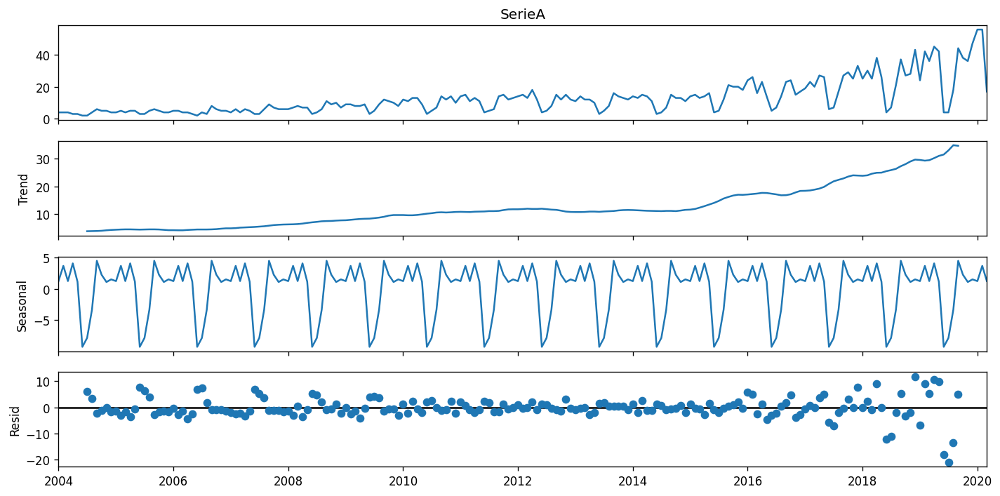

In [65]:
import statsmodels.api as sm
sm.tsa.seasonal_decompose(train.SerieA).plot()
result = sm.tsa.stattools.adfuller(train.SerieA)
plt.show()

### Holt Winter's Exponential Model



/opt/homebrew/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


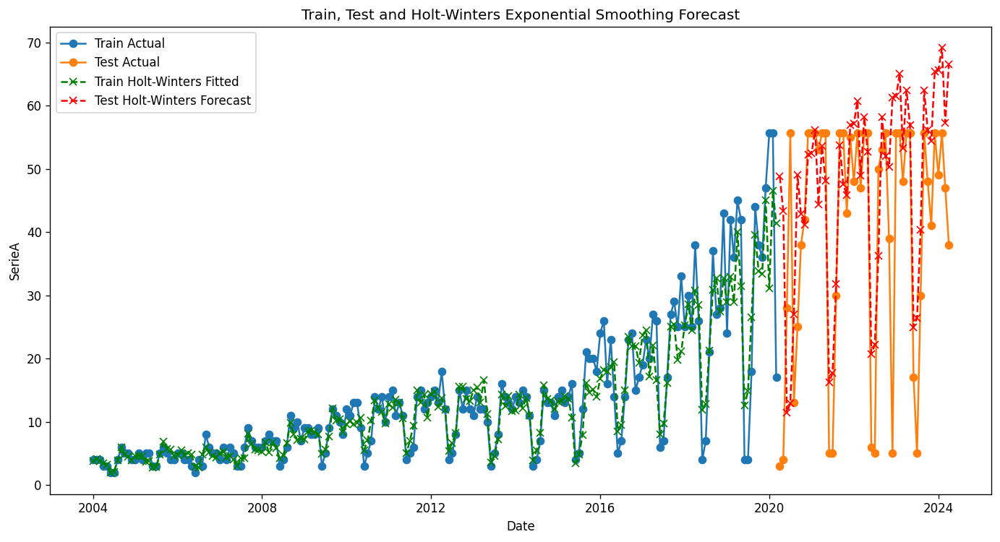

Train RMSE: 4.073992632455918
Train MAE: 2.368930692335967
Train MAPE: 21.32218876185216
Train MSE: 16.597415969305107
Test RMSE: 16.798571985027134
Test MAE: 11.691554316798372
Test MAPE: 123.50425687140407
Test MSE: 282.1920207361385


In [66]:
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_squared_error, mean_absolute_error

def calculate_mape(actual, forecast):
    actual, forecast = np.array(actual), np.array(forecast)
    non_zero_actual = np.where(actual == 0, np.finfo(float).eps, actual)
    return np.mean(np.abs((actual - forecast) / non_zero_actual)) * 100

seasonal_periods = 12
model = ExponentialSmoothing(
    train['SerieA'],
    seasonal='add',
    trend='add',
    seasonal_periods=seasonal_periods,
    damped_trend=True,
    initialization_method="estimated"
).fit()

train['Holt_Winters_fitted'] = model.fittedvalues
forecast = model.forecast(len(test))
test['Holt_Winters_forecast'] = forecast.values

train_rmse = np.sqrt(mean_squared_error(train['SerieA'], train['Holt_Winters_fitted']))
train_mae = mean_absolute_error(train['SerieA'], train['Holt_Winters_fitted'])
train_mape = calculate_mape(train['SerieA'], train['Holt_Winters_fitted'])
train_mse = mean_squared_error(train['SerieA'], train['Holt_Winters_fitted'])

test_rmse_hexp = np.sqrt(mean_squared_error(test['SerieA'], test['Holt_Winters_forecast']))
test_mae_hexp = mean_absolute_error(test['SerieA'], test['Holt_Winters_forecast'])
test_mape_hexp = calculate_mape(test['SerieA'], test['Holt_Winters_forecast'])
test_mse_hexp = mean_squared_error(test['SerieA'], test['Holt_Winters_forecast'])

plt.figure(figsize=(14, 7))
plt.plot(train.index, train['SerieA'], label='Train Actual', marker='o')
plt.plot(test.index, test['SerieA'], label='Test Actual', marker='o')
plt.plot(train.index, train['Holt_Winters_fitted'], label='Train Holt-Winters Fitted', linestyle='--', marker='x', color='green')
plt.plot(test.index, test['Holt_Winters_forecast'], label='Test Holt-Winters Forecast', linestyle='--', marker='x', color='red')
plt.title('Train, Test and Holt-Winters Exponential Smoothing Forecast')
plt.xlabel('Date')
plt.ylabel('SerieA')
plt.legend()
plt.show()

print(f'Train RMSE: {train_rmse}')
print(f'Train MAE: {train_mae}')
print(f'Train MAPE: {train_mape}')
print(f'Train MSE: {train_mse}')
print(f'Test RMSE: {test_rmse_hexp}')
print(f'Test MAE: {test_mae_hexp}')
print(f'Test MAPE: {test_mape_hexp}')
print(f'Test MSE: {test_mse_hexp}')



[notice] A new release of pip is available: 23.0.1 -> 24.0
[notice] To update, run: python3.10 -m pip install --upgrade pip


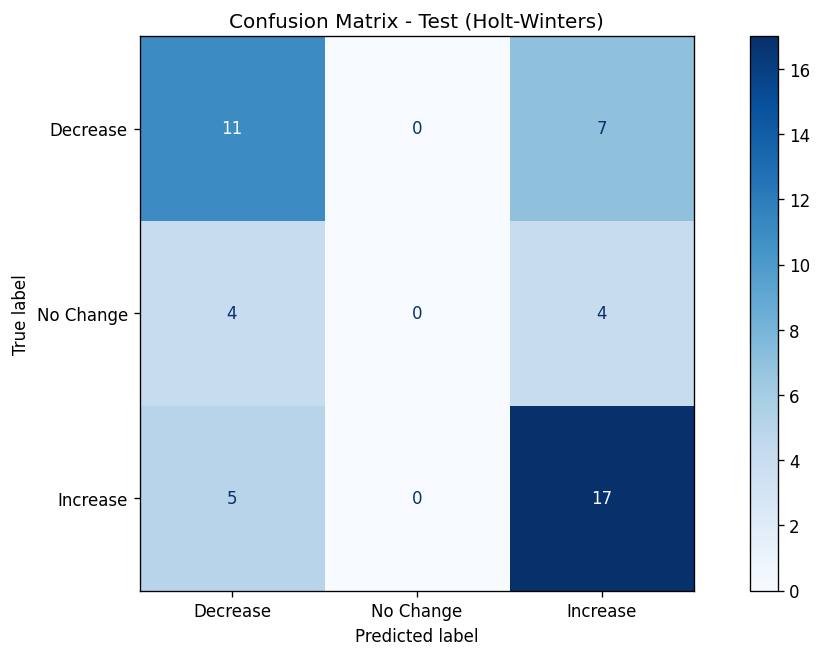

In [67]:
!pip3.10 install scikit-learn

actual_train_change = np.sign(np.diff(train['SerieA'].values))
actual_test_change = np.sign(np.diff(test['SerieA'].values))

predicted_train_change = np.sign(np.diff(train['Holt_Winters_fitted'].values))
predicted_test_change = np.sign(np.diff(test['Holt_Winters_forecast'].values))

cm_train = confusion_matrix(actual_train_change, predicted_train_change, labels=[-1, 0, 1])
cm_test = confusion_matrix(actual_test_change, predicted_test_change, labels=[-1, 0, 1])


disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=['Decrease', 'No Change', 'Increase'])
disp_test.plot(cmap='Blues')
plt.title('Confusion Matrix - Test (Holt-Winters)')
plt.show()


### Holt's Linear Trend Model

/opt/homebrew/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/var/folders/9h/cz_6965d2zb35zxbgyc7pl_h0000gn/T/ipykernel_25199/1669880601.py:8: FutureWarning: the 'smoothing_slope' keyword is deprecated, use 'smoothing_trend' instead.
  model = Holt(train['SerieA']).fit(smoothing_level=0.3, smoothing_slope=0.1, optimized=True)
/opt/homebrew/lib/python3.10/site-packages/pandas/util/_decorators.py:213: EstimationWarning: Model has no free parameters to estimate. Set optimized=False to suppress this warning
  return func(*args, **kwargs)


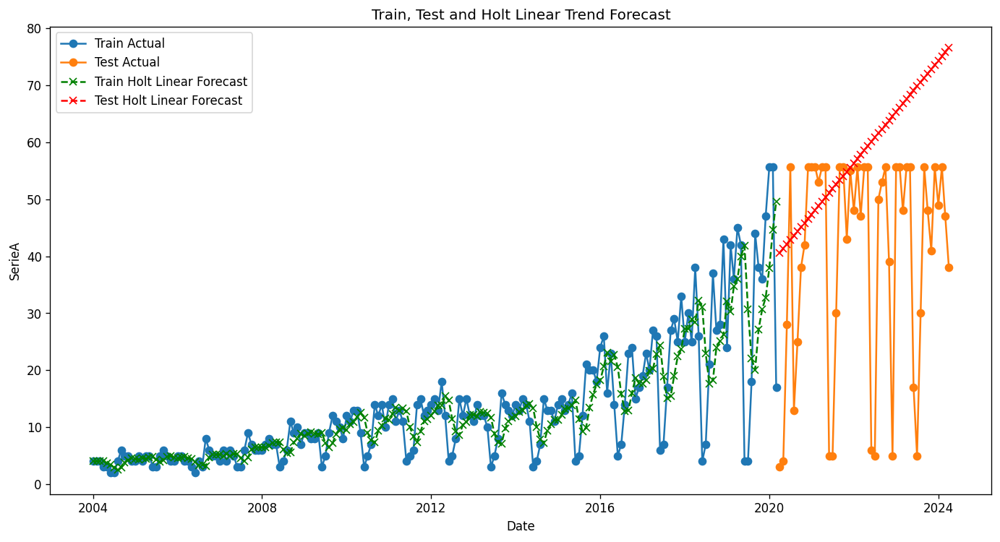

Train RMSE: 7.155440153010662
Train MAE: 4.259146995147045
Train MAPE: 51.76254916578379
Train MSE: 51.20032378331725
Test RMSE: 26.881094497219664
Test MAE: 20.55511569870992
Test MAPE: 210.5888464237021
Test MSE: 722.5932413684533


In [68]:
from statsmodels.tsa.holtwinters import Holt

def calculate_mape(actual, forecast):
    actual, forecast = np.array(actual), np.array(forecast)
    non_zero_actual = np.where(actual == 0, np.finfo(float).eps, actual)
    return np.mean(np.abs((actual - forecast) / non_zero_actual)) * 100

model = Holt(train['SerieA']).fit(smoothing_level=0.3, smoothing_slope=0.1, optimized=True)
forecast = model.forecast(len(test))
test['Holt_linear_forecast'] = forecast.values
train['Holt_linear_forecast'] = model.fittedvalues

train_rmse = np.sqrt(mean_squared_error(train['SerieA'], train['Holt_linear_forecast']))
train_mae = mean_absolute_error(train['SerieA'], train['Holt_linear_forecast'])
train_mape = calculate_mape(train['SerieA'], train['Holt_linear_forecast'])
train_mse = mean_squared_error(train['SerieA'], train['Holt_linear_forecast'])

test_rmse_hlin = np.sqrt(mean_squared_error(test['SerieA'], test['Holt_linear_forecast']))
test_mae_hlin = mean_absolute_error(test['SerieA'], test['Holt_linear_forecast'])
test_mape_hlin = calculate_mape(test['SerieA'], test['Holt_linear_forecast'])
test_mse_hlin = mean_squared_error(test['SerieA'], test['Holt_linear_forecast'])

plt.figure(figsize=(14, 7))
plt.plot(train.index, train['SerieA'], label='Train Actual', marker='o')
plt.plot(test.index, test['SerieA'], label='Test Actual', marker='o')
plt.plot(train.index, train['Holt_linear_forecast'], label='Train Holt Linear Forecast', linestyle='--', marker='x', color='green')
plt.plot(test.index, test['Holt_linear_forecast'], label='Test Holt Linear Forecast', linestyle='--', marker='x', color='red')
plt.title('Train, Test and Holt Linear Trend Forecast')
plt.xlabel('Date')
plt.ylabel('SerieA')
plt.legend()
plt.show()

print(f'Train RMSE: {train_rmse}')
print(f'Train MAE: {train_mae}')
print(f'Train MAPE: {train_mape}')
print(f'Train MSE: {train_mse}')
print(f'Test RMSE: {test_rmse_hlin}')
print(f'Test MAE: {test_mae_hlin}')
print(f'Test MAPE: {test_mape_hlin}')
print(f'Test MSE: {test_mse_hlin}')


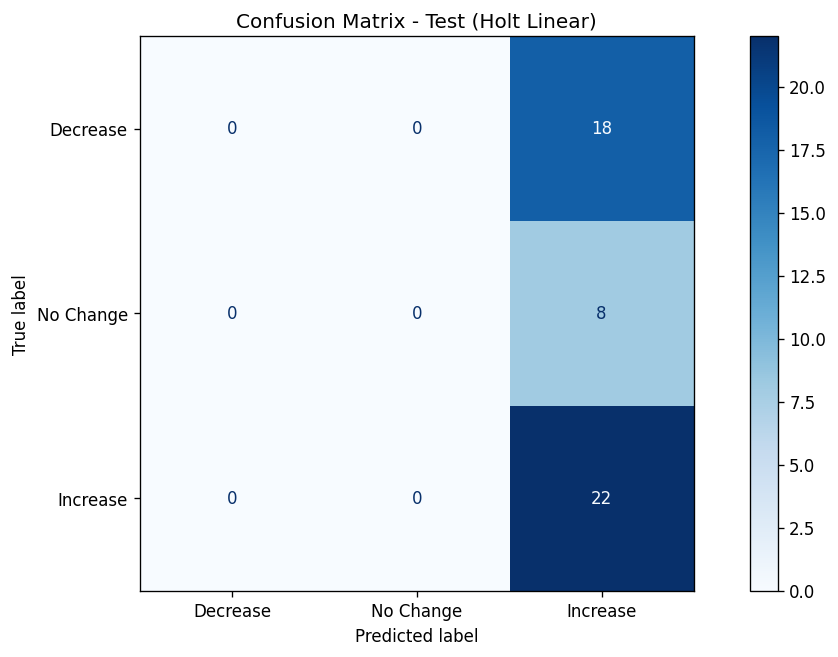

In [69]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import numpy as np


train_actual_changes = np.sign(np.diff(train['SerieA'].values))
train_predicted_changes = np.sign(np.diff(train['Holt_linear_forecast'].values))


test_actual_changes = np.sign(np.diff(test['SerieA'].values))
test_predicted_changes = np.sign(np.diff(test['Holt_linear_forecast'].values))


cm_train = confusion_matrix(train_actual_changes, train_predicted_changes, labels=[-1, 0, 1])
cm_test = confusion_matrix(test_actual_changes, test_predicted_changes, labels=[-1, 0, 1])


#disp_train = ConfusionMatrixDisplay(confusion_matrix=cm_train, display_labels=['Decrease', 'No Change', 'Increase'])
#disp_train.plot(cmap='Blues')
#plt.title('Confusion Matrix - Train (Holt Linear)')
#plt.show()


disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=['Decrease', 'No Change', 'Increase'])
disp_test.plot(cmap='Blues')
plt.title('Confusion Matrix - Test (Holt Linear)')
plt.show()


### SARIMA MODEL

RUNNING THE L-BFGS-B CODE

           * * *



/opt/homebrew/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/homebrew/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.


Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.52502D+00    |proj g|=  2.03111D-01

At iterate    5    f=  2.46895D+00    |proj g|=  7.95668D-02

At iterate   10    f=  2.44980D+00    |proj g|=  9.90653D-03

At iterate   15    f=  2.44952D+00    |proj g|=  1.33286D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     17     20      1     0     0   4.220D-06   2.450D+00
  F =   2.4495223740105811     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


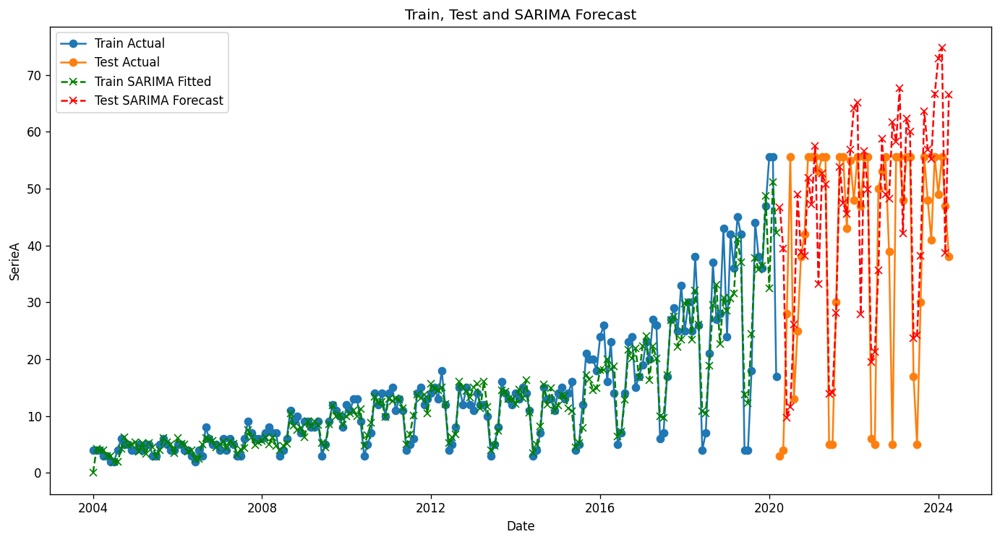

Train RMSE: 3.8502780527729117
Train MAE: 2.2474932454558916
Train MAPE: 21.26601617497105
Train MSE: 14.824641083664766
Test RMSE: 17.350695767193816
Test MAE: 12.668332789620633
Test MAPE: 118.32126833414165
Test MSE: 301.0466436057174


In [70]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
def calculate_mape(actual, forecast):
    actual, forecast = np.array(actual), np.array(forecast)
    non_zero_actual = np.where(actual == 0, np.finfo(float).eps, actual)
    return np.mean(np.abs((actual - forecast) / non_zero_actual)) * 100

order = (1, 1, 1)
seasonal_order = (1, 1, 1, 12)

model = SARIMAX(train['SerieA'], order=order, seasonal_order=seasonal_order, enforce_stationarity=False, enforce_invertibility=False).fit()

train['SARIMA_fitted'] = model.fittedvalues

forecast = model.forecast(steps=len(test))

test['SARIMA_forecast'] = forecast.values

train_rmse = np.sqrt(mean_squared_error(train['SerieA'], train['SARIMA_fitted']))
train_mae = mean_absolute_error(train['SerieA'], train['SARIMA_fitted'])
train_mape = calculate_mape(train['SerieA'], train['SARIMA_fitted'])
train_mse = mean_squared_error(train['SerieA'], train['SARIMA_fitted'])

test_rmse_sar = np.sqrt(mean_squared_error(test['SerieA'], test['SARIMA_forecast']))
test_mae_sar = mean_absolute_error(test['SerieA'], test['SARIMA_forecast'])
test_mape_sar = calculate_mape(test['SerieA'], test['SARIMA_forecast'])
test_mse_sar = mean_squared_error(test['SerieA'], test['SARIMA_forecast'])

plt.figure(figsize=(14, 7))
plt.plot(train.index, train['SerieA'], label='Train Actual', marker='o')
plt.plot(test.index, test['SerieA'], label='Test Actual', marker='o')
plt.plot(train.index, train['SARIMA_fitted'], label='Train SARIMA Fitted', linestyle='--', marker='x', color='green')
plt.plot(test.index, test['SARIMA_forecast'], label='Test SARIMA Forecast', linestyle='--', marker='x', color='red')
plt.title('Train, Test and SARIMA Forecast')
plt.xlabel('Date')
plt.ylabel('SerieA')
plt.legend()
plt.show()

print(f'Train RMSE: {train_rmse}')
print(f'Train MAE: {train_mae}')
print(f'Train MAPE: {train_mape}')
print(f'Train MSE: {train_mse}')
print(f'Test RMSE: {test_rmse_sar}')
print(f'Test MAE: {test_mae_sar}')
print(f'Test MAPE: {test_mape_sar}')
print(f'Test MSE: {test_mse_sar}')


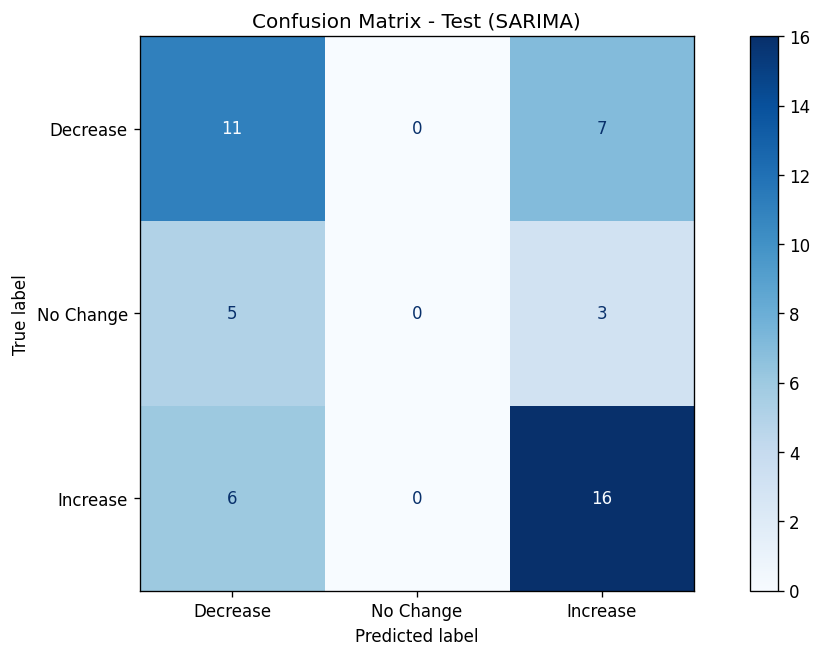

In [71]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt


train_actual_changes = np.sign(np.diff(train['SerieA'].values))
train_predicted_changes = np.sign(np.diff(train['SARIMA_fitted'].values))

test_actual_changes = np.sign(np.diff(test['SerieA'].values))
test_predicted_changes = np.sign(np.diff(test['SARIMA_forecast'].values))

cm_train = confusion_matrix(train_actual_changes, train_predicted_changes, labels=[-1, 0, 1])
cm_test = confusion_matrix(test_actual_changes, test_predicted_changes, labels=[-1, 0, 1])

disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=['Decrease', 'No Change', 'Increase'])
disp_test.plot(cmap='Blues')
plt.title('Confusion Matrix - Test (SARIMA)')
plt.show()


The SARIMA model can be used when the naive model and other models fail

### Random Forest

/opt/homebrew/lib/python3.10/site-packages/sklearn/metrics/_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
/opt/homebrew/lib/python3.10/site-packages/sklearn/metrics/_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


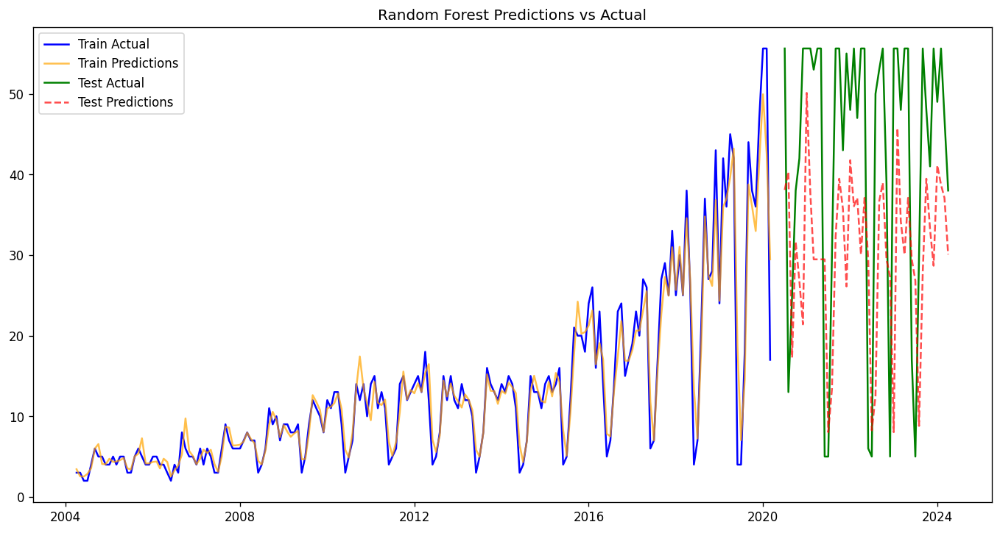

Train MAE: 1.5956684027777779
Train MSE: 7.163622264578315
Train RMSE: 2.6764943983835114
Train MAPE: 18.057337201688327%
Test MAE: 17.843605072463767
Test MSE: 408.60254462560385
Test RMSE: 20.213919576015034
Test MAPE: 76.95677270300536%


In [72]:
from sklearn.ensemble import RandomForestRegressor

def create_lagged_features(df, n_lags):
    return pd.concat([df.shift(i) for i in range(1, n_lags + 1)], axis=1)

n_lags = 3
train_lagged = create_lagged_features(train['SerieA'], n_lags).dropna()
test_lagged = create_lagged_features(test['SerieA'], n_lags).dropna()

train_X = train_lagged
train_y = train['SerieA'][n_lags:]
test_X = test_lagged
test_y = test['SerieA'][n_lags:]

rf = RandomForestRegressor(n_estimators=100, random_state=0)
rf.fit(train_X, train_y)

train_predictions = rf.predict(train_X)
test_predictions = rf.predict(test_X)

train_mae = mean_absolute_error(train_y, train_predictions)
train_mse = mean_squared_error(train_y, train_predictions)
train_rmse = mean_squared_error(train_y, train_predictions, squared=False)
train_mape = np.mean(np.abs((train_y - train_predictions) / train_y)) * 100

test_mae = mean_absolute_error(test_y, test_predictions)
test_mse = mean_squared_error(test_y, test_predictions)
test_rmse = mean_squared_error(test_y, test_predictions, squared=False)
test_mape = np.mean(np.abs((test_y - test_predictions) / test_y)) * 100

plt.figure(figsize=(14, 7))
plt.plot(train['SerieA'].index[n_lags:], train_y, label='Train Actual', color='blue')
plt.plot(train['SerieA'].index[n_lags:], train_predictions, label='Train Predictions', color='orange', alpha=0.7)
plt.plot(test['SerieA'].index[n_lags:], test_y, label='Test Actual', color='green')
plt.plot(test['SerieA'].index[n_lags:], test_predictions, label='Test Predictions', color='red', linestyle='--', alpha=0.7)
plt.title('Random Forest Predictions vs Actual')
plt.legend()
plt.show()

print(f'Train MAE: {train_mae}')
print(f'Train MSE: {train_mse}')
print(f'Train RMSE: {train_rmse}')
print(f'Train MAPE: {train_mape}%')
print(f'Test MAE: {test_mae}')
print(f'Test MSE: {test_mse}')
print(f'Test RMSE: {test_rmse}')
print(f'Test MAPE: {test_mape}%')


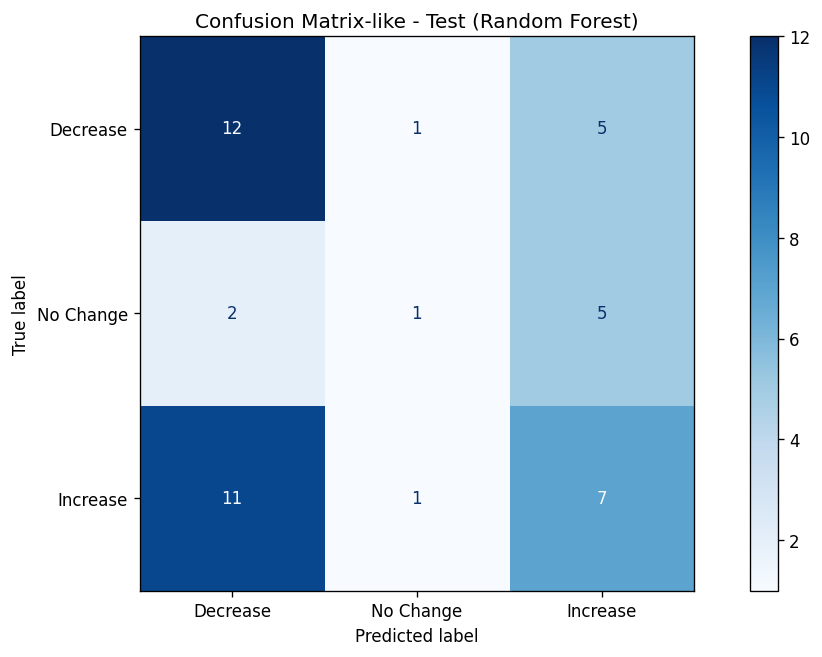

In [73]:

actual_train_change = np.sign(train_y.values[1:] - train_y.values[:-1])
actual_test_change = np.sign(test_y.values[1:] - test_y.values[:-1])

predicted_train_change = np.sign(train_predictions[1:] - train_predictions[:-1])
predicted_test_change = np.sign(test_predictions[1:] - test_predictions[:-1])

cm_train = confusion_matrix(actual_train_change, predicted_train_change, labels=[-1, 0, 1])
cm_test = confusion_matrix(actual_test_change, predicted_test_change, labels=[-1, 0, 1])


disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=['Decrease', 'No Change', 'Increase'])
disp_test.plot(cmap='Blues')
plt.title('Confusion Matrix-like - Test (Random Forest)')
plt.show()


### Theta Method

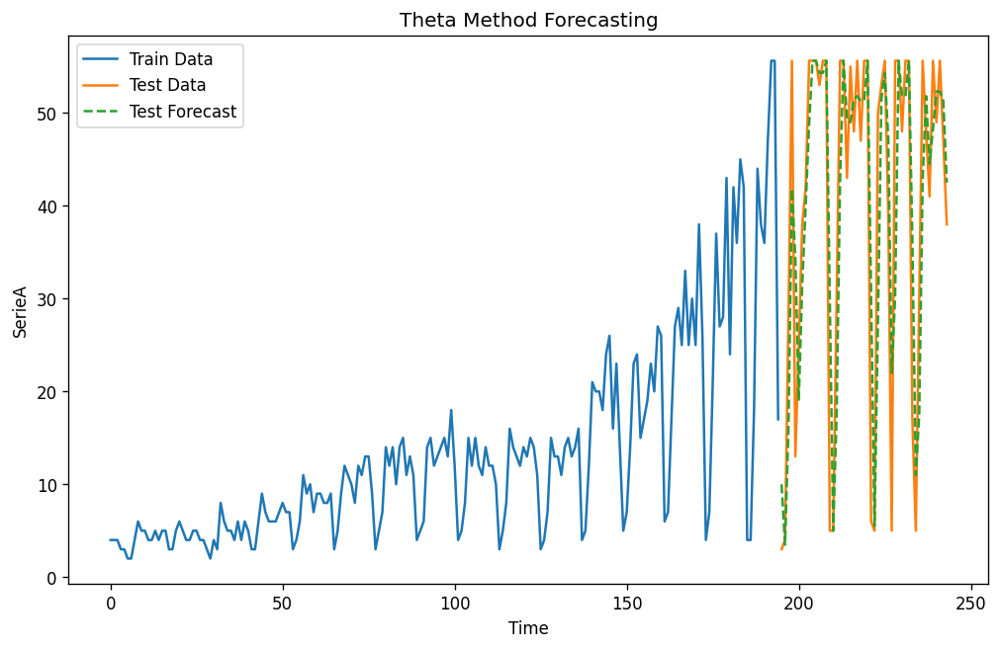

Train MSE: 55.683009826030926
Train MAE: 4.340528350515464
Train RMSE: 7.4621049192591045
Train MAPE: 50.094723264628186
Test MSE: 103.99553571428571
Test MAE: 7.081632653061225
Test RMSE: 10.197820145221513
Test MAPE: 49.490562223008155


In [74]:

def theta_method(series, theta):
    n = len(series)
    if n == 0:
        raise ValueError("Empty series provided.")
    elif n == 1:
        return series[0]
    elif n == 2:
        return series[1]
    
    forecasts = []
    for i in range(1, n):
        forecasts.append(theta * series[i-1] + (1 - theta) * series[i])
    
    return forecasts[-1]

train_series = train['SerieA'].values
test_series = test['SerieA'].values

theta = 0.5 

train_forecasts = [theta_method(train_series[:i], theta) for i in range(1, len(train_series))]
test_forecasts = [theta_method(np.append(train_series, test_series[:i]), theta) for i in range(1, len(test_series)+1)]

train_mse = mean_squared_error(train_series[1:], train_forecasts)
train_mae = mean_absolute_error(train_series[1:], train_forecasts)
train_rmse = np.sqrt(train_mse)
train_mape = np.mean(np.abs((train_series[1:] - train_forecasts) / train_series[1:])) * 100

test_mse = mean_squared_error(test_series, test_forecasts)
test_mae = mean_absolute_error(test_series, test_forecasts)
test_rmse = np.sqrt(test_mse)
test_mape = np.mean(np.abs((test_series - test_forecasts) / test_series)) * 100

plt.figure(figsize=(10, 6))
plt.plot(train_series, label='Train Data')
plt.plot(np.arange(len(train_series), len(train_series) + len(test_series)), test_series, label='Test Data')
plt.plot(np.arange(len(train_series), len(train_series) + len(test_series)), test_forecasts, label='Test Forecast', linestyle='--')
plt.xlabel('Time')
plt.ylabel('SerieA')
plt.title('Theta Method Forecasting')
plt.legend()
plt.show()

print(f'Train MSE: {train_mse}')
print(f'Train MAE: {train_mae}')
print(f'Train RMSE: {train_rmse}')
print(f'Train MAPE: {train_mape}')

print(f'Test MSE: {test_mse}')
print(f'Test MAE: {test_mae}')
print(f'Test RMSE: {test_rmse}')
print(f'Test MAPE: {test_mape}')


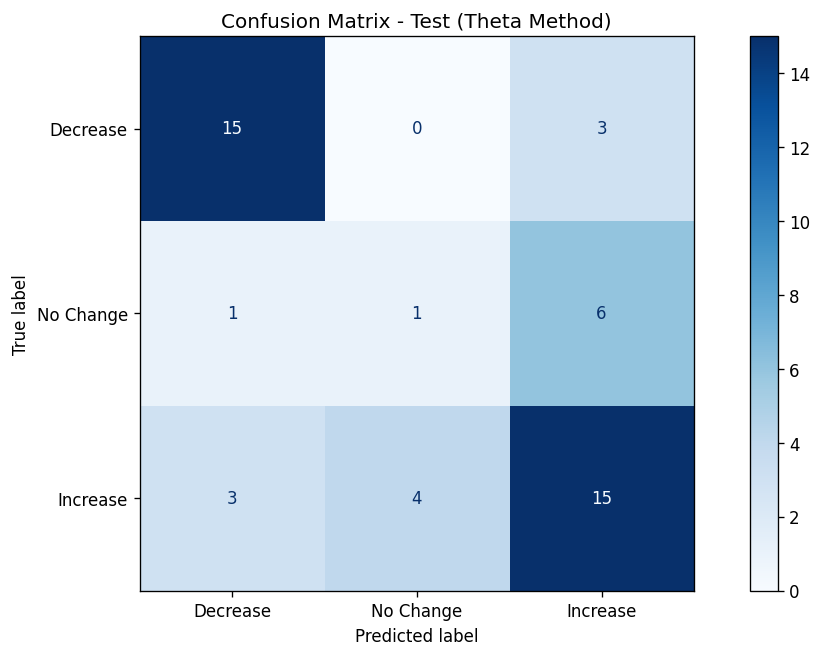

In [75]:
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

actual_test_change = np.diff(test_series)  
actual_test_change_cat = np.sign(actual_test_change) 

forecast_test_change = np.array(test_forecasts[1:]) - np.array(test_forecasts[:-1])  
forecast_test_change_cat = np.sign(forecast_test_change)

cm_test = confusion_matrix(actual_test_change_cat, forecast_test_change_cat, labels=[-1, 0, 1])


disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=['Decrease', 'No Change', 'Increase'])
disp_test.plot(cmap='Blues')
plt.title('Confusion Matrix - Test (Theta Method)')
plt.show()


The theta model, though simple, is relatively more accurate than most other models

### Support Vector Machine

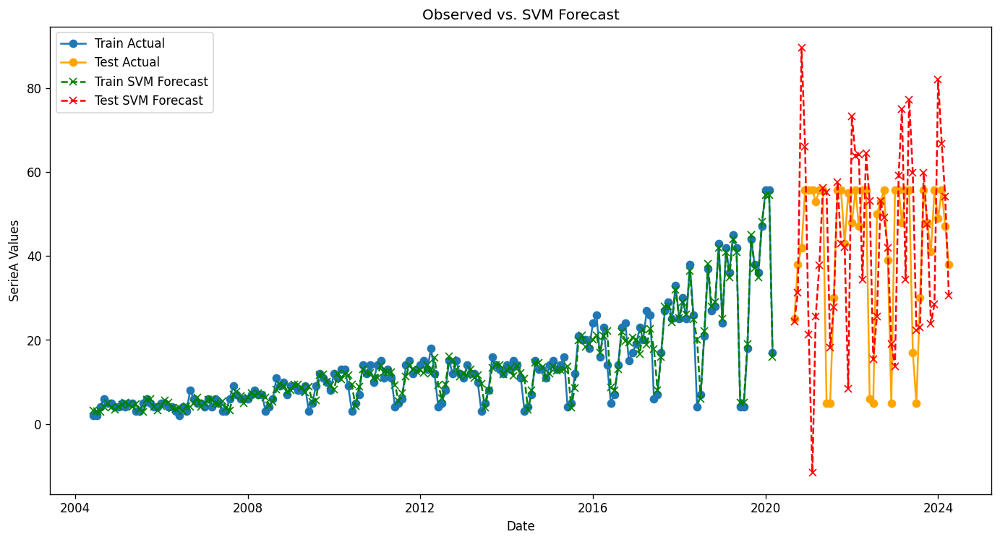

Train RMSE: 2.7162528867249836, Test RMSE: 24.707203167375486
Train MSE: 7.378029744641806, Test MSE: 610.4458883539692
Train MAE: 1.7539252291135348, Test MAE: 18.539676858880615
Train MAPE: 122.33%, Test MAPE: 142.76%


In [76]:
import numpy as np
import pandas as pd
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

scaler = StandardScaler()
train_scaled = scaler.fit_transform(train[['SerieA']])
test_scaled = scaler.transform(test[['SerieA']])

def create_features(data, lag=1):
    X, y = [], []
    for i in range(lag, len(data)):
        X.append(data[i-lag:i].flatten())
        y.append(data[i])
    return np.array(X), np.array(y)

def calculate_mape(actual, forecast):
    actual, forecast = np.array(actual), np.array(forecast)
    actual = np.where(actual == 0, np.finfo(float).eps, actual)
    return np.mean(np.abs((actual - forecast) / actual)) * 100

lag = 5
X_train, y_train = create_features(train_scaled, lag)
X_test, y_test = create_features(test_scaled, lag)

model = SVR(kernel='rbf', C=100, gamma=0.1, epsilon=0.1)
model.fit(X_train, y_train.ravel())

train_pred_scaled = model.predict(X_train)
test_pred_scaled = model.predict(X_test)

train_pred = scaler.inverse_transform(train_pred_scaled.reshape(-1, 1))
test_pred = scaler.inverse_transform(test_pred_scaled.reshape(-1, 1))

train_rmse = np.sqrt(mean_squared_error(train['SerieA'][lag:], train_pred))
test_rmse = np.sqrt(mean_squared_error(test['SerieA'][lag:], test_pred))
train_mse = mean_squared_error(train['SerieA'][lag:], train_pred)
test_mse = mean_squared_error(test['SerieA'][lag:], test_pred)
train_mae = mean_absolute_error(train['SerieA'][lag:], train_pred)
test_mae = mean_absolute_error(test['SerieA'][lag:], test_pred)
train_mape = calculate_mape(train['SerieA'][lag:], train_pred)
test_mape = calculate_mape(test['SerieA'][lag:], test_pred)

plt.figure(figsize=(14, 7))
plt.plot(train.index[lag:], train['SerieA'][lag:], label='Train Actual', marker='o')
plt.plot(test.index[lag:], test['SerieA'][lag:], label='Test Actual', marker='o', color='orange')
plt.plot(train.index[lag:], train_pred, label='Train SVM Forecast', linestyle='--', marker='x', color='green')
plt.plot(test.index[lag:], test_pred, label='Test SVM Forecast', linestyle='--', marker='x', color='red')
plt.title('Observed vs. SVM Forecast')
plt.xlabel('Date')
plt.ylabel('SerieA Values')
plt.legend()
plt.show()

print(f'Train RMSE: {train_rmse}, Test RMSE: {test_rmse}')
print(f'Train MSE: {train_mse}, Test MSE: {test_mse}')
print(f'Train MAE: {train_mae}, Test MAE: {test_mae}')
print(f'Train MAPE: {train_mape:.2f}%, Test MAPE: {test_mape:.2f}%')


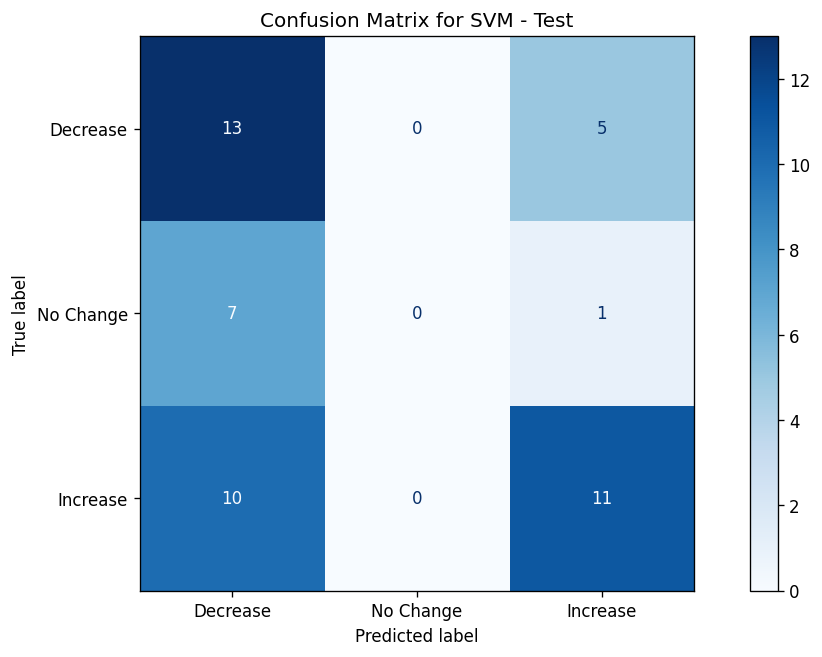

In [77]:
import numpy as np
import pandas as pd
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt


def create_features_labels(series):
    diffs = np.diff(series)
    categories = np.sign(diffs)
    return categories[:-1], categories[1:]  # Prepare input-output pairs

X_train, y_train = create_features_labels(train['SerieA'])
X_test, y_test = create_features_labels(test['SerieA'])

model = SVC(kernel='rbf', C=100, gamma=0.1)
model.fit(X_train.reshape(-1, 1), y_train)


y_pred = model.predict(X_test.reshape(-1, 1))


cm = confusion_matrix(y_test, y_pred, labels=[-1, 0, 1])
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Decrease', 'No Change', 'Increase'])


disp.plot(cmap='Blues')
plt.title('Confusion Matrix for SVM - Test')
plt.show()


# Bundesliga

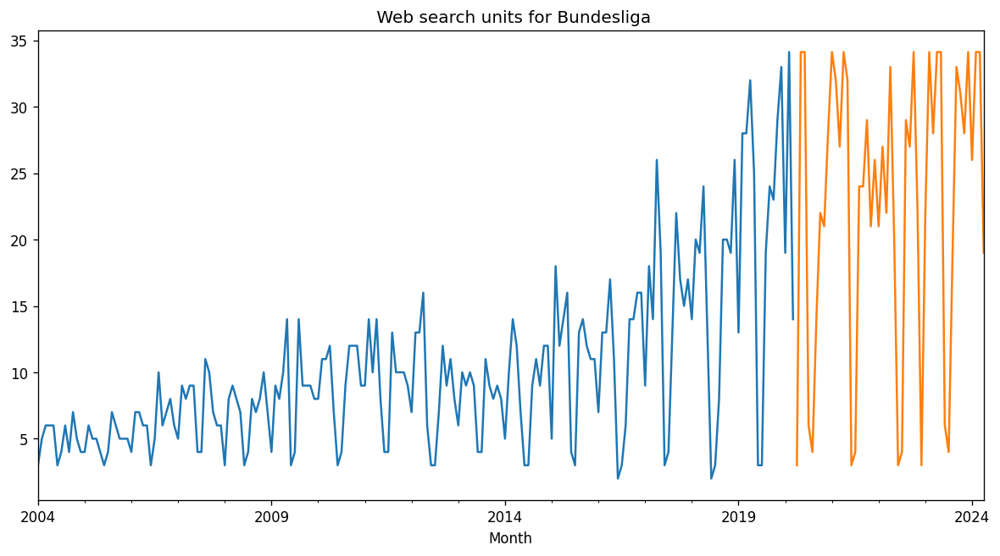

In [78]:
train.Bundesliga.plot(title=" Web Search units for Bundesliga")
test.Bundesliga.plot(title=" Web search units for Bundesliga")
plt.show()

### Simple Average

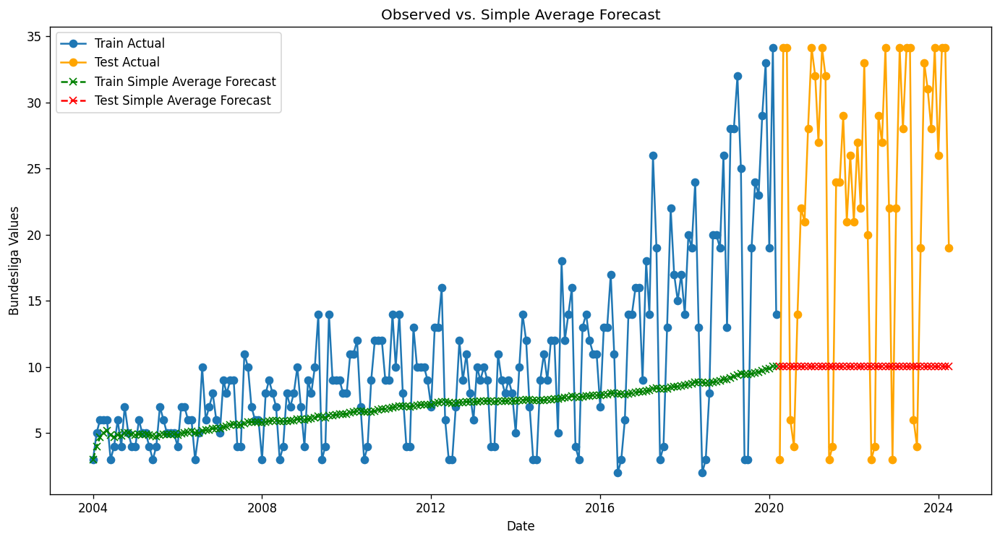

Train RMSE with Simple Average Forecast: 6.368572869626148
Test RMSE with Simple Average Forecast: 16.824762501145585
Train MAE with Simple Average Forecast: 4.461103244450397
Test MAE with Simple Average Forecast: 15.329931972789119
Train MAPE with Simple Average Forecast: 46.645363098296585
Test MAPE with Simple Average Forecast: 83.57294047086677
Train MSE with Simple Average Forecast: 40.558720395738234
Test MSE with Simple Average Forecast: 283.0726332199547


In [79]:
def calculate_mape(actual, forecast):
    actual, forecast = np.array(actual), np.array(forecast)
    actual = np.where(actual == 0, np.finfo(float).eps, actual)
    return np.mean(np.abs((actual - forecast) / actual)) * 100

simple_average = train['Bundesliga'].mean()

train['simple_avg_forecast'] = [train['Bundesliga'][:i].mean() for i in range(1, len(train['Bundesliga'])+1)]
test['simple_avg_forecast'] = simple_average

train_rmse_simple_avg = np.sqrt(mean_squared_error(train['Bundesliga'].iloc[1:], train['simple_avg_forecast'].iloc[1:]))
test_rmse_simple_avg = np.sqrt(mean_squared_error(test['Bundesliga'], test['simple_avg_forecast']))

train_mape_simple_avg = calculate_mape(train['Bundesliga'].iloc[1:], train['simple_avg_forecast'].iloc[1:])
test_mape_simple_avg = calculate_mape(test['Bundesliga'], test['simple_avg_forecast'])

train_mae_simple_avg = mean_absolute_error(train['Bundesliga'].iloc[1:], train['simple_avg_forecast'].iloc[1:])
test_mae_simple_avg = mean_absolute_error(test['Bundesliga'], test['simple_avg_forecast'])

train_mse_simple_avg = mean_squared_error(train['Bundesliga'].iloc[1:], train['simple_avg_forecast'].iloc[1:])
test_mse_simple_avg = mean_squared_error(test['Bundesliga'], test['simple_avg_forecast'])

plt.figure(figsize=(14, 7))
plt.plot(train.index, train['Bundesliga'], label='Train Actual', marker='o')
plt.plot(test.index, test['Bundesliga'], label='Test Actual', marker='o', color='orange')
plt.plot(train.index, train['simple_avg_forecast'], label='Train Simple Average Forecast', linestyle='--', marker='x', color='green')
plt.plot(test.index, [simple_average]*len(test), label='Test Simple Average Forecast', linestyle='--', marker='x', color='red')
plt.title('Observed vs. Simple Average Forecast')
plt.xlabel('Date')
plt.ylabel('Bundesliga Values')
plt.legend()
plt.show()

print(f'Train RMSE with Simple Average Forecast: {train_rmse_simple_avg}')
print(f'Test RMSE with Simple Average Forecast: {test_rmse_simple_avg}')
print(f'Train MAE with Simple Average Forecast: {train_mae_simple_avg}')
print(f'Test MAE with Simple Average Forecast: {test_mae_simple_avg}')
print(f'Train MAPE with Simple Average Forecast: {train_mape_simple_avg}')
print(f'Test MAPE with Simple Average Forecast: {test_mape_simple_avg}')
print(f'Train MSE with Simple Average Forecast: {train_mse_simple_avg}')
print(f'Test MSE with Simple Average Forecast: {test_mse_simple_avg}')


### SMA

Train Metrics:
MAE: 4.108506944444444
MSE: 32.226218894675924
RMSE: 5.676814150091222
MAPE: 64.92450342531308%

Test Metrics:
MAE: 8.974489795918368
MSE: 117.87308673469387
RMSE: 10.856937263090998
MAPE: 118.9847037150557%


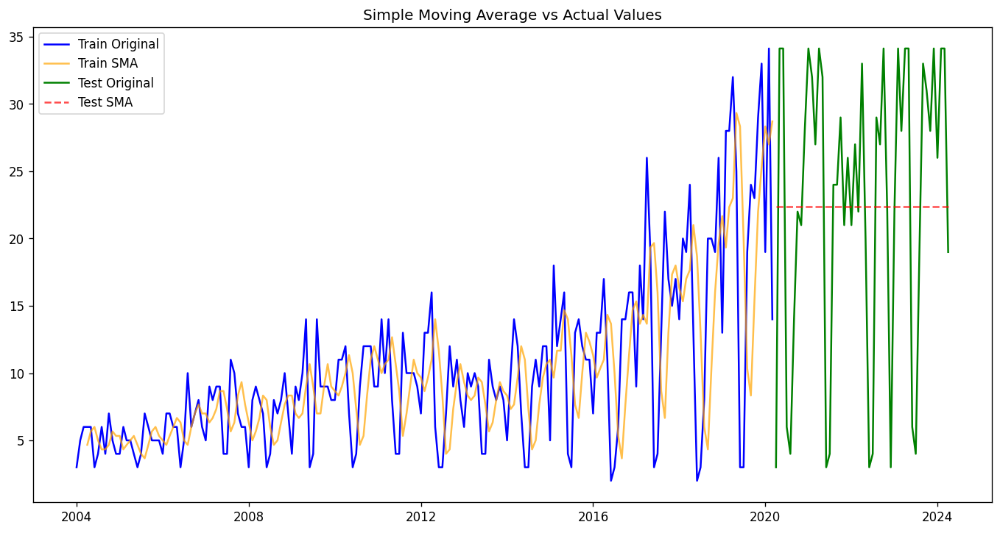

In [80]:

def calculate_mape(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

window_size = 3
train['SMA'] = train['Bundesliga'].rolling(window=window_size).mean().shift(1)
test['SMA'] = train['Bundesliga'].iloc[-window_size:].mean()

train_mae = mean_absolute_error(train['Bundesliga'][window_size:], train['SMA'].dropna())
train_mse = mean_squared_error(train['Bundesliga'][window_size:], train['SMA'].dropna())
train_rmse = np.sqrt(train_mse)
train_mape = calculate_mape(train['Bundesliga'][window_size:], train['SMA'].dropna())

test_mae = mean_absolute_error(test['Bundesliga'], test['SMA'])
test_mse = mean_squared_error(test['Bundesliga'], test['SMA'])
test_rmse = np.sqrt(test_mse)
test_mape = calculate_mape(test['Bundesliga'], test['SMA'])

print('Train Metrics:')
print(f'MAE: {train_mae}')
print(f'MSE: {train_mse}')
print(f'RMSE: {train_rmse}')
print(f'MAPE: {train_mape}%')

print('\nTest Metrics:')
print(f'MAE: {test_mae}')
print(f'MSE: {test_mse}')
print(f'RMSE: {test_rmse}')
print(f'MAPE: {test_mape}%')

plt.figure(figsize=(14, 7))
plt.plot(train['Bundesliga'], label='Train Original', color='blue')
plt.plot(train['SMA'], label='Train SMA', color='orange', alpha=0.7)
plt.plot(test['Bundesliga'], label='Test Original', color='green')
plt.plot(test['SMA'], label='Test SMA', color='red', linestyle='--', alpha=0.7)
plt.title('Simple Moving Average vs Actual Values')
plt.legend()
plt.show()


### SES

/opt/homebrew/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Train Metrics:
MAE: 3.5533682229452146
MSE: 24.14952524522156
RMSE: 4.914216646142248
MAPE: 54.22312736512316%

Test Metrics:
MAE: 9.086581846341028
MSE: 118.79446289231886
RMSE: 10.899287265336154
MAPE: 116.47731374696421%


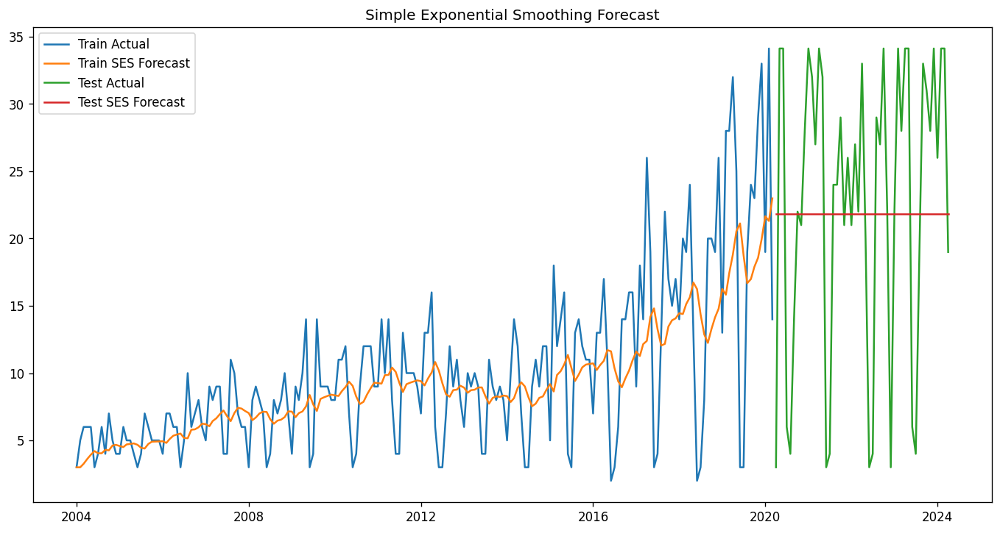

In [81]:
from statsmodels.tsa.holtwinters import SimpleExpSmoothing
from sklearn.metrics import mean_absolute_error, mean_squared_error
import matplotlib.pyplot as plt
import numpy as np

ses_model = SimpleExpSmoothing(train['Bundesliga']).fit(optimized=True)

train['SES'] = ses_model.fittedvalues

test['SES'] = ses_model.forecast(steps=len(test))

train_mae = mean_absolute_error(train['Bundesliga'], train['SES'])
train_mse = mean_squared_error(train['Bundesliga'], train['SES'])
train_rmse = np.sqrt(train_mse)
train_mape = np.mean(np.abs((train['Bundesliga'] - train['SES']) / train['Bundesliga'])) * 100

test_mae = mean_absolute_error(test['Bundesliga'], test['SES'])
test_mse = mean_squared_error(test['Bundesliga'], test['SES'])
test_rmse = np.sqrt(test_mse)
test_mape = np.mean(np.abs((test['Bundesliga'] - test['SES']) / test['Bundesliga'])) * 100

print('Train Metrics:')
print(f'MAE: {train_mae}')
print(f'MSE: {train_mse}')
print(f'RMSE: {train_rmse}')
print(f'MAPE: {train_mape}%')

print('\nTest Metrics:')
print(f'MAE: {test_mae}')
print(f'MSE: {test_mse}')
print(f'RMSE: {test_rmse}')
print(f'MAPE: {test_mape}%')

plt.figure(figsize=(14, 7))
plt.plot(train['Bundesliga'], label='Train Actual')
plt.plot(train['SES'], label='Train SES Forecast')
plt.plot(test['Bundesliga'], label='Test Actual')
plt.plot(test['SES'], label='Test SES Forecast')
plt.title('Simple Exponential Smoothing Forecast')
plt.legend()
plt.show()


### ETS

/opt/homebrew/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Train Metrics:
MAE: 2.030274205394711
MSE: 8.210304773772224
RMSE: 2.8653629392752715
MAPE: 25.921733921991%

Test Metrics:
MAE: 6.236626240782136
MSE: 85.79481158283022
RMSE: 9.262548870739103
MAPE: 78.35410630363323%


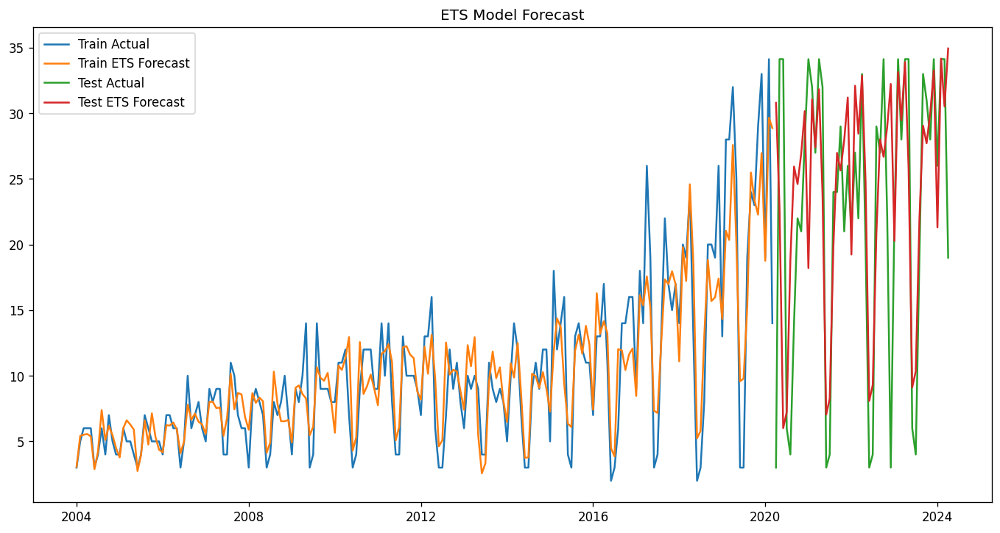

In [82]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_absolute_error, mean_squared_error
import matplotlib.pyplot as plt
import numpy as np

def calculate_mape(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

ets_model = ExponentialSmoothing(
    train['Bundesliga'], 
    trend="add", 
    seasonal="add", 
    seasonal_periods=12
).fit()

train['ETS'] = ets_model.fittedvalues

test['ETS'] = ets_model.forecast(steps=len(test))

train_mae = mean_absolute_error(train['Bundesliga'], train['ETS'])
train_mse = mean_squared_error(train['Bundesliga'], train['ETS'])
train_rmse = np.sqrt(train_mse)
train_mape = calculate_mape(train['Bundesliga'], train['ETS'])

test_mae = mean_absolute_error(test['Bundesliga'], test['ETS'])
test_mse = mean_squared_error(test['Bundesliga'], test['ETS'])
test_rmse = np.sqrt(test_mse)
test_mape = calculate_mape(test['Bundesliga'], test['ETS'])

print('Train Metrics:')
print(f'MAE: {train_mae}')
print(f'MSE: {train_mse}')
print(f'RMSE: {train_rmse}')
print(f'MAPE: {train_mape}%')

print('\nTest Metrics:')
print(f'MAE: {test_mae}')
print(f'MSE: {test_mse}')
print(f'RMSE: {test_rmse}')
print(f'MAPE: {test_mape}%')

plt.figure(figsize=(14, 7))
plt.plot(train['Bundesliga'], label='Train Actual')
plt.plot(train['ETS'], label='Train ETS Forecast')
plt.plot(test['Bundesliga'], label='Test Actual')
plt.plot(test['ETS'], label='Test ETS Forecast')
plt.title('ETS Model Forecast')
plt.legend()
plt.show()


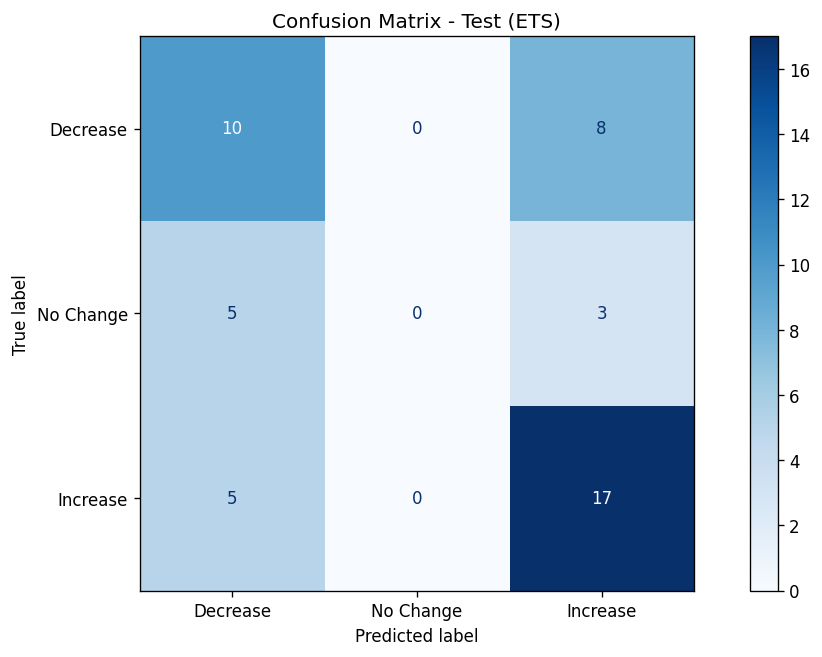

In [83]:

actual_train_change = np.sign(np.diff(train['SerieA'].values))
actual_test_change = np.sign(np.diff(test['SerieA'].values))

predicted_train_change = np.sign(np.diff(train['ETS'].values))
predicted_test_change = np.sign(np.diff(test['ETS'].values))

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm_train = confusion_matrix(actual_train_change, predicted_train_change, labels=[-1, 0, 1])
cm_test = confusion_matrix(actual_test_change, predicted_test_change, labels=[-1, 0, 1])


disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=['Decrease', 'No Change', 'Increase'])
disp_test.plot(cmap='Blues')
plt.title('Confusion Matrix - Test (ETS)')
plt.show()


### Naive Forecast

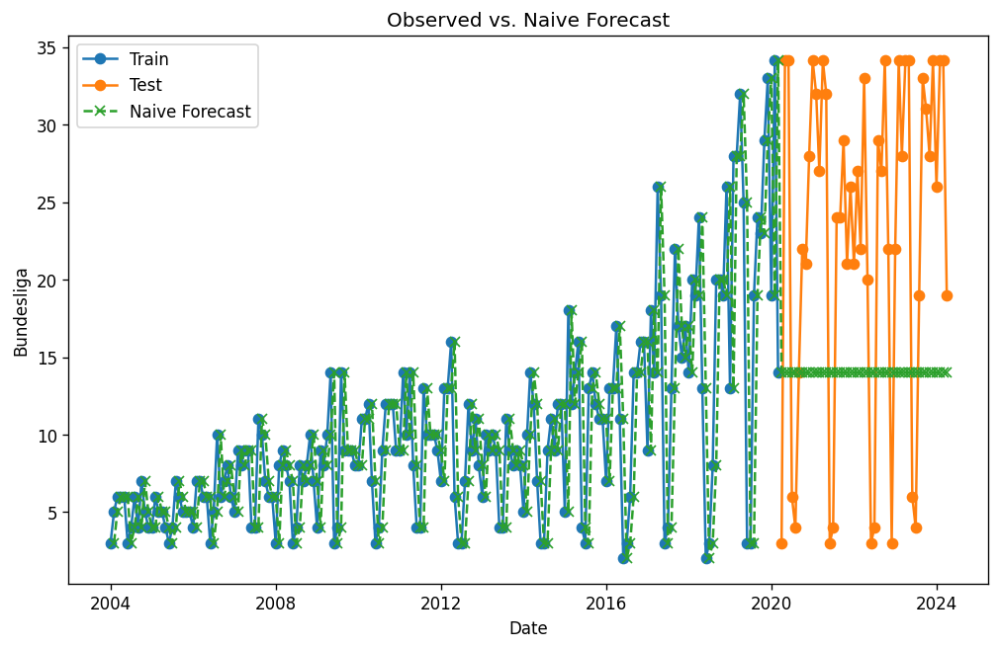

Train RMSE: 5.369722894998602
Test RMSE: 14.032158309994037
Train MAE: 3.5940721649484537
Test MAE: 12.987244897959183
Train MAPE: 48.605851909978334 %
Test MAPE: 93.18696688223814 %
Train MSE: 28.833923969072163
Test MSE: 196.9014668367347


In [84]:
train['naive_forecast'] = train['Bundesliga'].shift(1)
train.loc[:, 'naive_forecast'] = train['Bundesliga'].shift(1)
last_observed = train['Bundesliga'].iloc[-1]
test.loc[:, 'naive_forecast'] = last_observed

train_rmse = sqrt(mean_squared_error(train['Bundesliga'].iloc[1:], train['naive_forecast'].iloc[1:]))
test_rmse_naive = sqrt(mean_squared_error(test['Bundesliga'], test['naive_forecast']))

def calculate_mape(actual, forecast):
    actual = np.array(actual)
    forecast = np.array(forecast)
    actual = np.where(actual == 0, np.finfo(float).eps, actual)
    mape_value = np.mean(np.abs((actual - forecast) / actual)) * 100
    return mape_value

train_mape = calculate_mape(train['Bundesliga'].iloc[1:], train['naive_forecast'].iloc[1:])
test_mape_naive = calculate_mape(test['Bundesliga'], test['naive_forecast'])

train_mae_naive = mean_absolute_error(train['Bundesliga'].iloc[1:], train['naive_forecast'].iloc[1:])
test_mae_naive = mean_absolute_error(test['Bundesliga'], test['naive_forecast'])

train_mse_naive = mean_squared_error(train['Bundesliga'].iloc[1:], train['naive_forecast'].iloc[1:])
test_mse_naive = mean_squared_error(test['Bundesliga'], test['naive_forecast'])

plt.figure(figsize=(10, 6))
plt.plot(train['Bundesliga'], label='Train', marker='o')
plt.plot(test['Bundesliga'], label='Test', marker='o')
plt.plot(pd.concat([train['naive_forecast'], test['naive_forecast']]), label='Naive Forecast', linestyle='--', marker='x')
plt.title('Observed vs. Naive Forecast')
plt.xlabel('Date')
plt.ylabel('Bundesliga')
plt.legend()
plt.show()

print(f'Train RMSE: {train_rmse}')
print(f'Test RMSE: {test_rmse_naive}')
print(f'Train MAE: {train_mae_naive}')
print(f'Test MAE: {test_mae_naive}')
print(f'Train MAPE: {train_mape} %')
print(f'Test MAPE: {test_mape_naive} %')
print(f'Train MSE: {train_mse_naive}')
print(f'Test MSE: {test_mse_naive}')


### Trends of Bundesliga

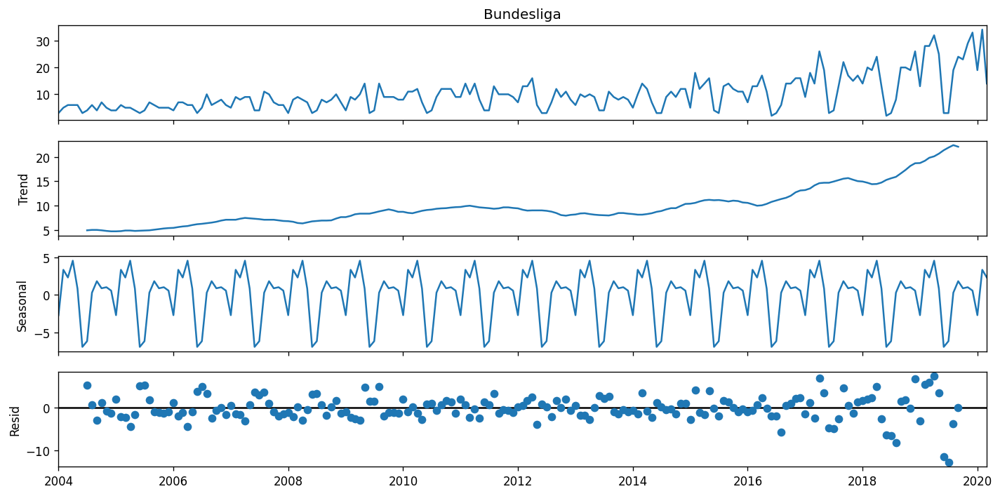

In [85]:
import statsmodels.api as sm
sm.tsa.seasonal_decompose(train.Bundesliga).plot()
result = sm.tsa.stattools.adfuller(train.Bundesliga)
plt.show()

### Holt Winter's Exponential Model

/opt/homebrew/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


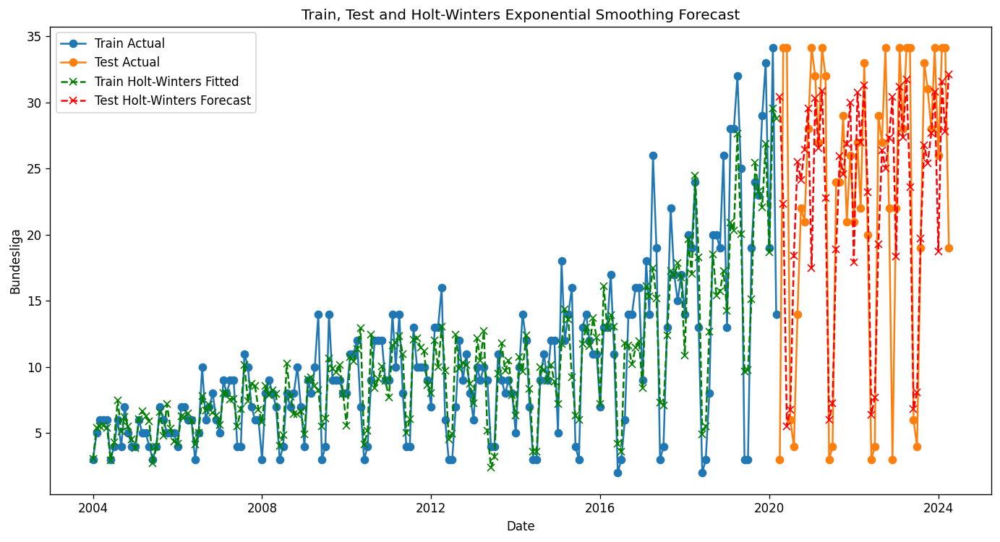

Train RMSE: 2.874547247137808
Train MAE: 2.03101578785542
Train MSE: 8.263021876027551
Train MAPE: 25.50313871196936
Test RMSE: 9.185600582364392
Test MAE: 6.302973451337062
Test MSE: 84.37525805873307
Test MAPE: 71.94867883053078


In [86]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing
def calculate_mape(actual, forecast):
    actual, forecast = np.array(actual), np.array(forecast)
    non_zero_actual = np.where(actual == 0, np.finfo(float).eps, actual)
    return np.mean(np.abs((actual - forecast) / non_zero_actual)) * 100

seasonal_periods = 12
model = ExponentialSmoothing(
    train['Bundesliga'],
    seasonal='add',
    trend='add',
    seasonal_periods=seasonal_periods,
    damped_trend=True,
    initialization_method="estimated"
).fit()

train['Holt_Winters_fitted'] = model.fittedvalues
forecast = model.forecast(len(test))
test['Holt_Winters_forecast'] = forecast.values

train_rmse = np.sqrt(mean_squared_error(train['Bundesliga'], train['Holt_Winters_fitted']))
train_mae = mean_absolute_error(train['Bundesliga'], train['Holt_Winters_fitted'])
train_mse = mean_squared_error(train['Bundesliga'], train['Holt_Winters_fitted'])
train_mape = calculate_mape(train['Bundesliga'], train['Holt_Winters_fitted'])

test_rmse_hexp = np.sqrt(mean_squared_error(test['Bundesliga'], test['Holt_Winters_forecast']))
test_mae_hexp = mean_absolute_error(test['Bundesliga'], test['Holt_Winters_forecast'])
test_mse_hexp = mean_squared_error(test['Bundesliga'], test['Holt_Winters_forecast'])
test_mape_hexp = calculate_mape(test['Bundesliga'], test['Holt_Winters_forecast'])

plt.figure(figsize=(14, 7))
plt.plot(train.index, train['Bundesliga'], label='Train Actual', marker='o')
plt.plot(test.index, test['Bundesliga'], label='Test Actual', marker='o')
plt.plot(train.index, train['Holt_Winters_fitted'], label='Train Holt-Winters Fitted', linestyle='--', marker='x', color='green')
plt.plot(test.index, test['Holt_Winters_forecast'], label='Test Holt-Winters Forecast', linestyle='--', marker='x', color='red')
plt.title('Train, Test and Holt-Winters Exponential Smoothing Forecast')
plt.xlabel('Date')
plt.ylabel('Bundesliga')
plt.legend()
plt.show()

print(f'Train RMSE: {train_rmse}')
print(f'Train MAE: {train_mae}')
print(f'Train MSE: {train_mse}')
print(f'Train MAPE: {train_mape}')

print(f'Test RMSE: {test_rmse_hexp}')
print(f'Test MAE: {test_mae_hexp}')
print(f'Test MSE: {test_mse_hexp}')
print(f'Test MAPE: {test_mape_hexp}')


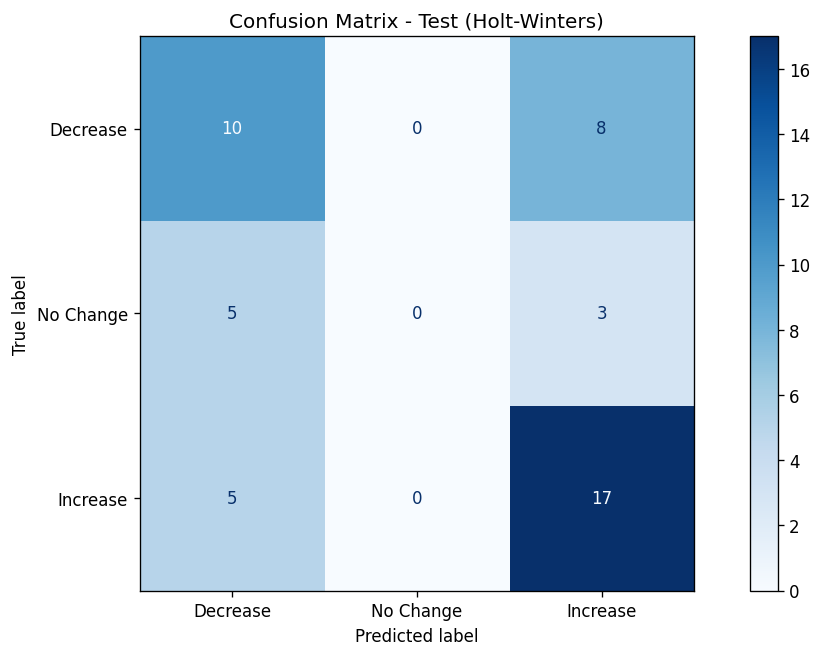

In [87]:

actual_train_change = np.sign(np.diff(train['SerieA'].values))
actual_test_change = np.sign(np.diff(test['SerieA'].values))

predicted_train_change = np.sign(np.diff(train['Holt_Winters_fitted'].values))
predicted_test_change = np.sign(np.diff(test['Holt_Winters_forecast'].values))

cm_train = confusion_matrix(actual_train_change, predicted_train_change, labels=[-1, 0, 1])
cm_test = confusion_matrix(actual_test_change, predicted_test_change, labels=[-1, 0, 1])


disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=['Decrease', 'No Change', 'Increase'])
disp_test.plot(cmap='Blues')
plt.title('Confusion Matrix - Test (Holt-Winters)')
plt.show()


### Holt's Linear Trend Model

/opt/homebrew/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/var/folders/9h/cz_6965d2zb35zxbgyc7pl_h0000gn/T/ipykernel_25199/4056711095.py:9: FutureWarning: the 'smoothing_slope' keyword is deprecated, use 'smoothing_trend' instead.
  model = Holt(train['Bundesliga']).fit(smoothing_level=0.8, smoothing_slope=0.2, optimized=False)


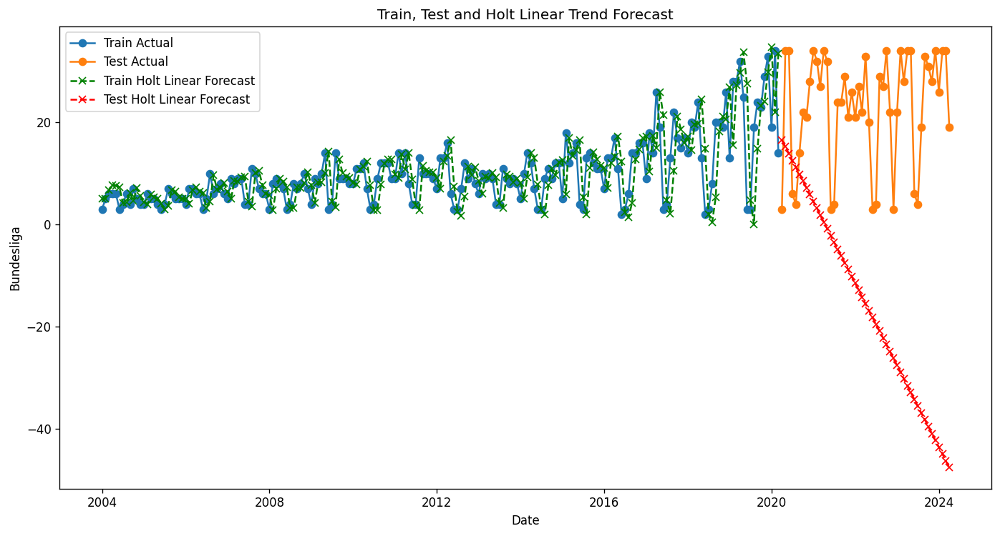

Train RMSE: 5.707233855132077
Train MAE: 3.843845139267443
Train MSE: 32.57251827716575
Train MAPE: 54.01960472782983
Test RMSE: 45.06363747011978
Test MAE: 39.57462069136514
Test MSE: 2030.7314220383835
Test MAPE: 231.61064372741725


In [88]:
from statsmodels.tsa.holtwinters import Holt

# Function to calculate MAPE
def calculate_mape(actual, forecast):
    actual, forecast = np.array(actual), np.array(forecast)
    non_zero_actual = np.where(actual == 0, np.finfo(float).eps, actual)  # Avoid division by zero
    return np.mean(np.abs((actual - forecast) / non_zero_actual)) * 100

model = Holt(train['Bundesliga']).fit(smoothing_level=0.8, smoothing_slope=0.2, optimized=False)

forecast = model.forecast(len(test))
test['Holt_linear_forecast'] = forecast.values

train['Holt_linear_forecast'] = model.fittedvalues

train_rmse = np.sqrt(mean_squared_error(train['Bundesliga'], train['Holt_linear_forecast']))
train_mae = mean_absolute_error(train['Bundesliga'], train['Holt_linear_forecast'])
train_mse = mean_squared_error(train['Bundesliga'], train['Holt_linear_forecast'])
train_mape = calculate_mape(train['Bundesliga'], train['Holt_linear_forecast'])

test_rmse_hlin = np.sqrt(mean_squared_error(test['Bundesliga'], test['Holt_linear_forecast']))
test_mae_hlin = mean_absolute_error(test['Bundesliga'], test['Holt_linear_forecast'])
test_mse_hlin = mean_squared_error(test['Bundesliga'], test['Holt_linear_forecast'])
test_mape_hlin = calculate_mape(test['Bundesliga'], test['Holt_linear_forecast'])

plt.figure(figsize=(14, 7))
plt.plot(train.index, train['Bundesliga'], label='Train Actual', marker='o')
plt.plot(test.index, test['Bundesliga'], label='Test Actual', marker='o')
plt.plot(train.index, train['Holt_linear_forecast'], label='Train Holt Linear Forecast', linestyle='--', marker='x', color='green')
plt.plot(test.index, test['Holt_linear_forecast'], label='Test Holt Linear Forecast', linestyle='--', marker='x', color='red')
plt.title('Train, Test and Holt Linear Trend Forecast')
plt.xlabel('Date')
plt.ylabel('Bundesliga')
plt.legend()
plt.show()

print(f'Train RMSE: {train_rmse}')
print(f'Train MAE: {train_mae}')
print(f'Train MSE: {train_mse}')
print(f'Train MAPE: {train_mape}')
print(f'Test RMSE: {test_rmse_hlin}')
print(f'Test MAE: {test_mae_hlin}')
print(f'Test MSE: {test_mse_hlin}')
print(f'Test MAPE: {test_mape_hlin}')


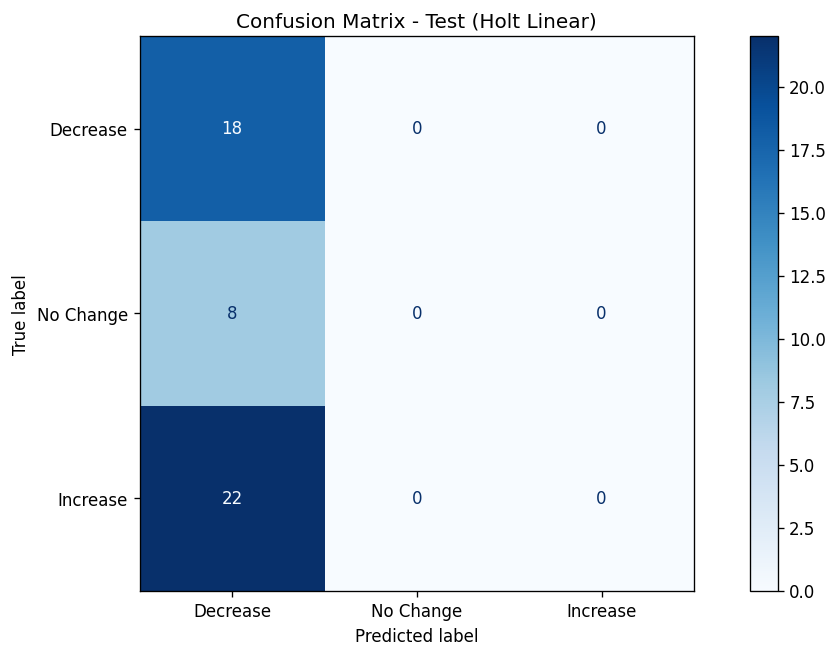

In [89]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import numpy as np


train_actual_changes = np.sign(np.diff(train['SerieA'].values))
train_predicted_changes = np.sign(np.diff(train['Holt_linear_forecast'].values))


test_actual_changes = np.sign(np.diff(test['SerieA'].values))
test_predicted_changes = np.sign(np.diff(test['Holt_linear_forecast'].values))


cm_train = confusion_matrix(train_actual_changes, train_predicted_changes, labels=[-1, 0, 1])
cm_test = confusion_matrix(test_actual_changes, test_predicted_changes, labels=[-1, 0, 1])




disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=['Decrease', 'No Change', 'Increase'])
disp_test.plot(cmap='Blues')
plt.title('Confusion Matrix - Test (Holt Linear)')
plt.show()


### SARIMA

/opt/homebrew/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/homebrew/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.20393D+00    |proj g|=  8.51808D-02

At iterate    5    f=  2.12815D+00    |proj g|=  3.11715D-02

At iterate   10    f=  2.12681D+00    |proj g|=  9.80391D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     12     15      1     0     0   1.210D-05   2.127D+00
  F =   2.1268105141131883     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


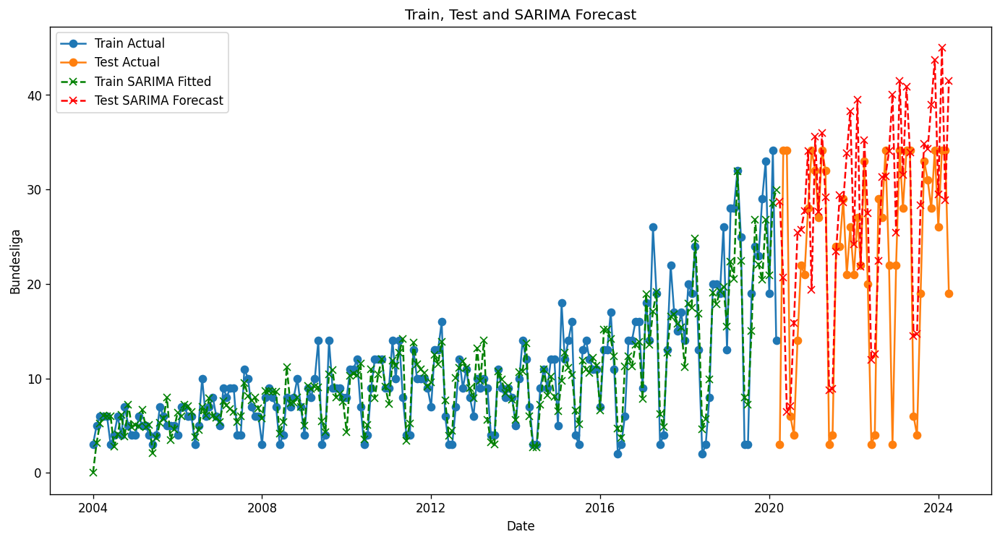

Train RMSE: 2.717746628584672
Train MAE: 1.8934774741544815
Train MSE: 7.38614673718335
Train MAPE: 24.371498096381828
Test RMSE: 10.950474392839586
Test MAE: 8.101114942832629
Test MSE: 119.9128894282355
Test MAPE: 96.12329703648987


In [90]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

def calculate_mape(actual, forecast):
    actual, forecast = np.array(actual), np.array(forecast)
    non_zero_actual = np.where(actual == 0, np.finfo(float).eps, actual)
    return np.mean(np.abs((actual - forecast) / non_zero_actual)) * 100

order = (1, 1, 1)
seasonal_order = (1, 1, 1, 12)

model = SARIMAX(train['Bundesliga'], order=order, seasonal_order=seasonal_order, enforce_stationarity=False, enforce_invertibility=False).fit()

train['SARIMA_fitted'] = model.fittedvalues

forecast = model.forecast(steps=len(test))
test['SARIMA_forecast'] = forecast.values

train_rmse = np.sqrt(mean_squared_error(train['Bundesliga'], train['SARIMA_fitted']))
train_mae = mean_absolute_error(train['Bundesliga'], train['SARIMA_fitted'])
train_mse = mean_squared_error(train['Bundesliga'], train['SARIMA_fitted'])
train_mape = calculate_mape(train['Bundesliga'], train['SARIMA_fitted'])

test_rmse_sar = np.sqrt(mean_squared_error(test['Bundesliga'], test['SARIMA_forecast']))
test_mae_sar = mean_absolute_error(test['Bundesliga'], test['SARIMA_forecast'])
test_mse_sar = mean_squared_error(test['Bundesliga'], test['SARIMA_forecast'])
test_mape_sar = calculate_mape(test['Bundesliga'], test['SARIMA_forecast'])

plt.figure(figsize=(14, 7))
plt.plot(train.index, train['Bundesliga'], label='Train Actual', marker='o')
plt.plot(test.index, test['Bundesliga'], label='Test Actual', marker='o')
plt.plot(train.index, train['SARIMA_fitted'], label='Train SARIMA Fitted', linestyle='--', marker='x', color='green')
plt.plot(test.index, test['SARIMA_forecast'], label='Test SARIMA Forecast', linestyle='--', marker='x', color='red')
plt.title('Train, Test and SARIMA Forecast')
plt.xlabel('Date')
plt.ylabel('Bundesliga')
plt.legend()
plt.show()

print(f'Train RMSE: {train_rmse}')
print(f'Train MAE: {train_mae}')
print(f'Train MSE: {train_mse}')
print(f'Train MAPE: {train_mape}')

print(f'Test RMSE: {test_rmse_sar}')
print(f'Test MAE: {test_mae_sar}')
print(f'Test MSE: {test_mse_sar}')
print(f'Test MAPE: {test_mape_sar}')


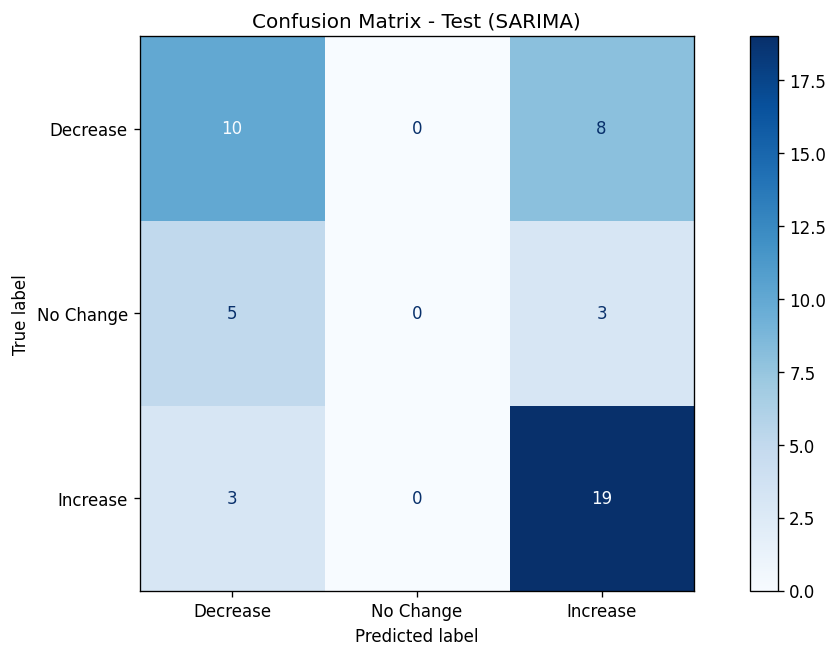

In [91]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt


train_actual_changes = np.sign(np.diff(train['SerieA'].values))
train_predicted_changes = np.sign(np.diff(train['SARIMA_fitted'].values))

test_actual_changes = np.sign(np.diff(test['SerieA'].values))
test_predicted_changes = np.sign(np.diff(test['SARIMA_forecast'].values))

cm_train = confusion_matrix(train_actual_changes, train_predicted_changes, labels=[-1, 0, 1])
cm_test = confusion_matrix(test_actual_changes, test_predicted_changes, labels=[-1, 0, 1])

disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=['Decrease', 'No Change', 'Increase'])
disp_test.plot(cmap='Blues')
plt.title('Confusion Matrix - Test (SARIMA)')
plt.show()


### Random Forest

/opt/homebrew/lib/python3.10/site-packages/sklearn/metrics/_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
/opt/homebrew/lib/python3.10/site-packages/sklearn/metrics/_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


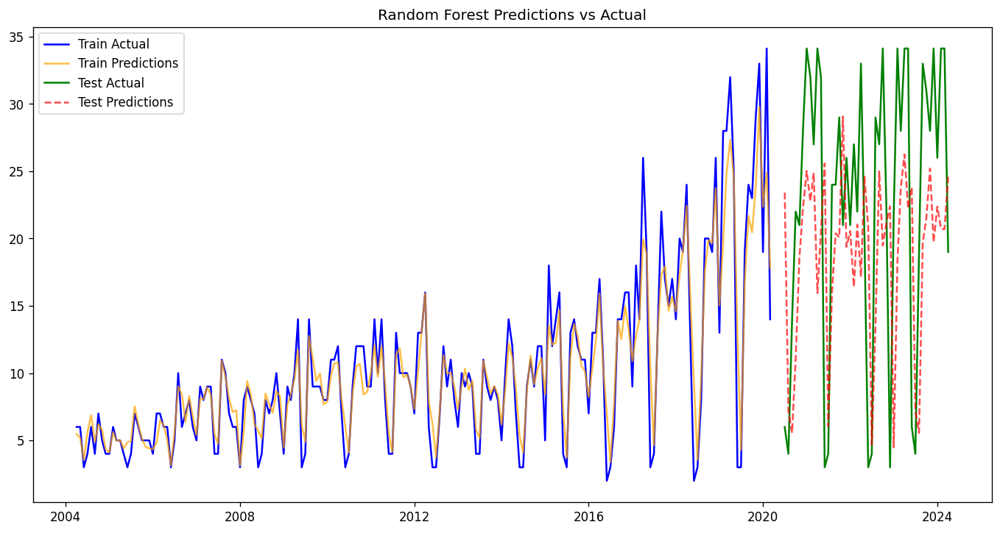

Train MAE: 1.4137570684523808
Train MSE: 4.646338433638039
Train RMSE: 2.155536692714378
Train MAPE: 21.21900191393001%
Test MAE: 9.323699275362317
Test MSE: 123.05284117059176
Test RMSE: 11.092918514556562
Test MAPE: 86.56371715702241%


In [92]:

from sklearn.ensemble import RandomForestRegressor


def create_lagged_features(df, n_lags):
    return pd.concat([df.shift(i) for i in range(1, n_lags + 1)], axis=1)

n_lags = 3
train_lagged = create_lagged_features(train['Bundesliga'], n_lags).dropna()
test_lagged = create_lagged_features(test['Bundesliga'], n_lags).dropna()

train_X = train_lagged
train_y = train['Bundesliga'][n_lags:]
test_X = test_lagged
test_y = test['Bundesliga'][n_lags:]

rf = RandomForestRegressor(n_estimators=100, random_state=0)
rf.fit(train_X, train_y)

train_predictions = rf.predict(train_X)
test_predictions = rf.predict(test_X)

train_mae = mean_absolute_error(train_y, train_predictions)
train_mse = mean_squared_error(train_y, train_predictions)
train_rmse = mean_squared_error(train_y, train_predictions, squared=False)
train_mape = np.mean(np.abs((train_y - train_predictions) / train_y)) * 100

test_mae = mean_absolute_error(test_y, test_predictions)
test_mse = mean_squared_error(test_y, test_predictions)
test_rmse = mean_squared_error(test_y, test_predictions, squared=False)
test_mape = np.mean(np.abs((test_y - test_predictions) / test_y)) * 100

plt.figure(figsize=(14, 7))
plt.plot(train['Bundesliga'].index[n_lags:], train_y, label='Train Actual', color='blue')
plt.plot(train['Bundesliga'].index[n_lags:], train_predictions, label='Train Predictions', color='orange', alpha=0.7)
plt.plot(test['Bundesliga'].index[n_lags:], test_y, label='Test Actual', color='green')
plt.plot(test['Bundesliga'].index[n_lags:], test_predictions, label='Test Predictions', color='red', linestyle='--', alpha=0.7)
plt.title('Random Forest Predictions vs Actual')
plt.legend()
plt.show()

print(f'Train MAE: {train_mae}')
print(f'Train MSE: {train_mse}')
print(f'Train RMSE: {train_rmse}')
print(f'Train MAPE: {train_mape}%')
print(f'Test MAE: {test_mae}')
print(f'Test MSE: {test_mse}')
print(f'Test RMSE: {test_rmse}')
print(f'Test MAPE: {test_mape}%')


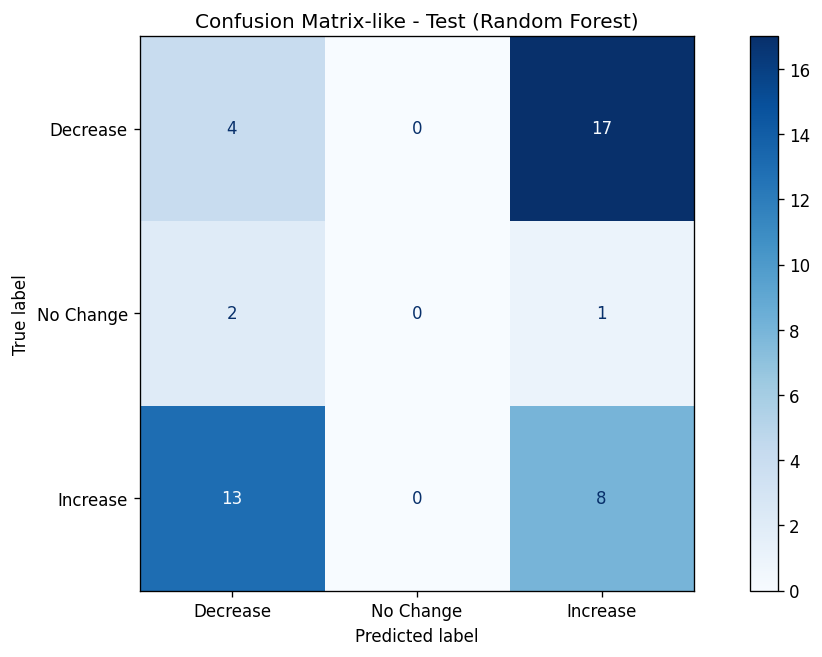

In [93]:

actual_train_change = np.sign(train_y.values[1:] - train_y.values[:-1])
actual_test_change = np.sign(test_y.values[1:] - test_y.values[:-1])

predicted_train_change = np.sign(train_predictions[1:] - train_predictions[:-1])
predicted_test_change = np.sign(test_predictions[1:] - test_predictions[:-1])

cm_train = confusion_matrix(actual_train_change, predicted_train_change, labels=[-1, 0, 1])
cm_test = confusion_matrix(actual_test_change, predicted_test_change, labels=[-1, 0, 1])


disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=['Decrease', 'No Change', 'Increase'])
disp_test.plot(cmap='Blues')
plt.title('Confusion Matrix-like - Test (Random Forest)')
plt.show()


### Theta Method

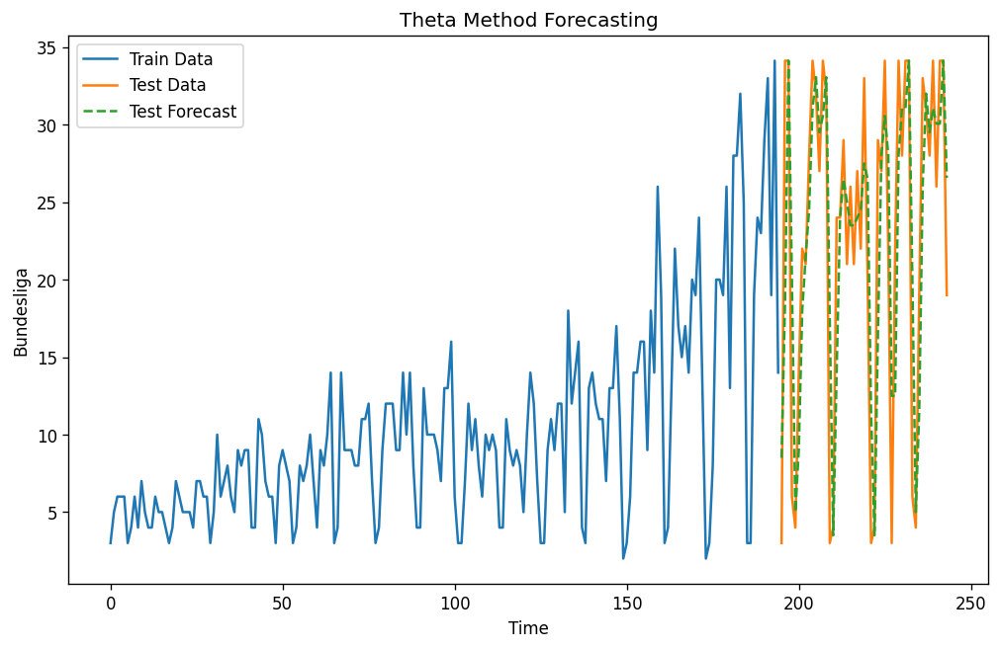

Train MSE: 30.32387644974227
Train MAE: 3.879832474226804
Train RMSE: 5.506711945411914
Train MAPE: 59.9487730069875
Test MSE: 38.985969387755105
Test MAE: 4.663265306122449
Test RMSE: 6.243874549328734
Test MAPE: 49.670341652336255


In [94]:
def theta_method(series, theta):
    n = len(series)
    if n == 0:
        raise ValueError("Empty series provided.")
    elif n == 1:
        return series[0]
    elif n == 2:
        return series[1]
    
    forecasts = []
    for i in range(1, n):
        forecasts.append(theta * series[i-1] + (1 - theta) * series[i])
    
    return forecasts[-1]

train_series = train['Bundesliga'].values
test_series = test['Bundesliga'].values

theta = 0.5 
train_forecasts = [theta_method(train_series[:i], theta) for i in range(1, len(train_series))]
test_forecasts = [theta_method(np.append(train_series, test_series[:i]), theta) for i in range(1, len(test_series)+1)]

train_mse = mean_squared_error(train_series[1:], train_forecasts)
train_mae = mean_absolute_error(train_series[1:], train_forecasts)
train_rmse = np.sqrt(train_mse)
train_mape = np.mean(np.abs((train_series[1:] - train_forecasts) / train_series[1:])) * 100

test_mse = mean_squared_error(test_series, test_forecasts)
test_mae = mean_absolute_error(test_series, test_forecasts)
test_rmse = np.sqrt(test_mse)
test_mape = np.mean(np.abs((test_series - test_forecasts) / test_series)) * 100

plt.figure(figsize=(10, 6))
plt.plot(train_series, label='Train Data')
plt.plot(np.arange(len(train_series), len(train_series) + len(test_series)), test_series, label='Test Data')
plt.plot(np.arange(len(train_series), len(train_series) + len(test_series)), test_forecasts, label='Test Forecast', linestyle='--')
plt.xlabel('Time')
plt.ylabel('Bundesliga')
plt.title('Theta Method Forecasting')
plt.legend()
plt.show()

print(f'Train MSE: {train_mse}')
print(f'Train MAE: {train_mae}')
print(f'Train RMSE: {train_rmse}')
print(f'Train MAPE: {train_mape}')

print(f'Test MSE: {test_mse}')
print(f'Test MAE: {test_mae}')
print(f'Test RMSE: {test_rmse}')
print(f'Test MAPE: {test_mape}')


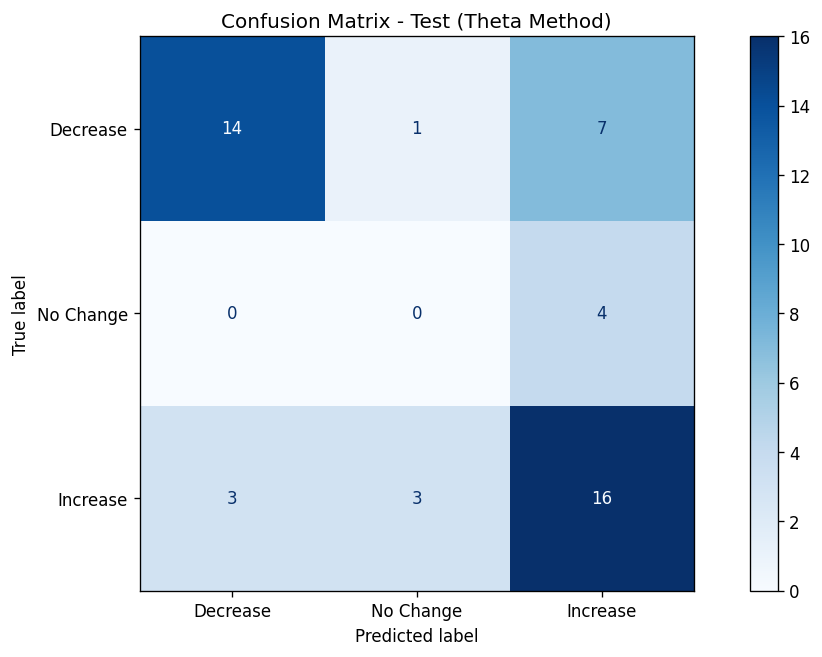

In [95]:
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

actual_test_change = np.diff(test_series)  
actual_test_change_cat = np.sign(actual_test_change) 

forecast_test_change = np.array(test_forecasts[1:]) - np.array(test_forecasts[:-1])  
forecast_test_change_cat = np.sign(forecast_test_change)

cm_test = confusion_matrix(actual_test_change_cat, forecast_test_change_cat, labels=[-1, 0, 1])


disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=['Decrease', 'No Change', 'Increase'])
disp_test.plot(cmap='Blues')
plt.title('Confusion Matrix - Test (Theta Method)')
plt.show()


### Support Vector Machine

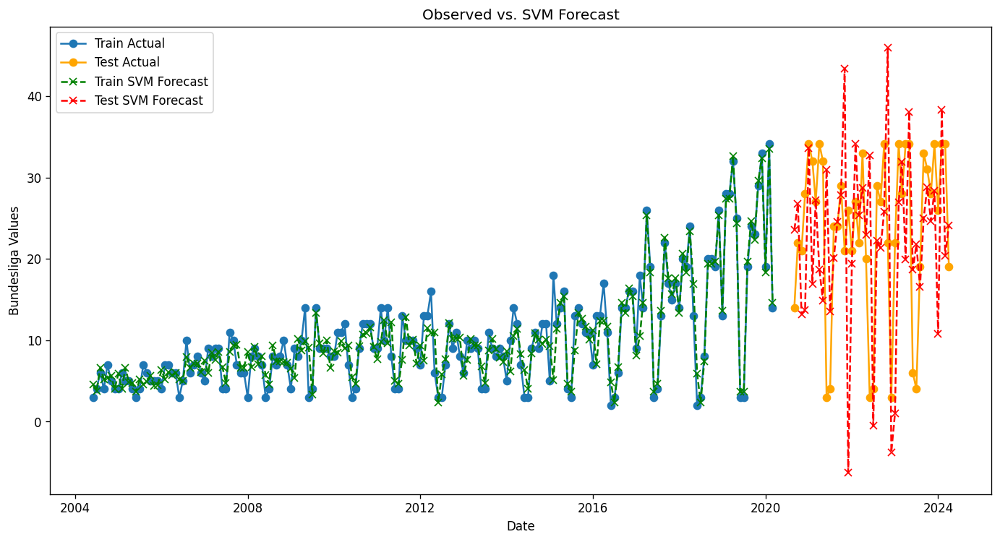

Train RMSE: 2.234820216041508, Test RMSE: 12.717378608714789
Train MSE: 4.994421398027811, Test MSE: 161.73171867739651
Train MAE: 1.5288164919870575, Test MAE: 9.731741868191204
Train MAPE: 85.45%, Test MAPE: 118.90%


In [96]:
import numpy as np
import pandas as pd
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

scaler = StandardScaler()
train_scaled = scaler.fit_transform(train[['Bundesliga']])
test_scaled = scaler.transform(test[['Bundesliga']])

def create_features(data, lag=1):
    X, y = [], []
    for i in range(lag, len(data)):
        X.append(data[i-lag:i].flatten())
        y.append(data[i])
    return np.array(X), np.array(y)

def calculate_mape(actual, forecast):
    actual, forecast = np.array(actual), np.array(forecast)
    actual = np.where(actual == 0, np.finfo(float).eps, actual)
    return np.mean(np.abs((actual - forecast) / actual)) * 100

lag = 5
X_train, y_train = create_features(train_scaled, lag)
X_test, y_test = create_features(test_scaled, lag)

model = SVR(kernel='rbf', C=100, gamma=0.1, epsilon=0.1)
model.fit(X_train, y_train.ravel())

train_pred_scaled = model.predict(X_train)
test_pred_scaled = model.predict(X_test)

train_pred = scaler.inverse_transform(train_pred_scaled.reshape(-1, 1))
test_pred = scaler.inverse_transform(test_pred_scaled.reshape(-1, 1))

train_rmse = np.sqrt(mean_squared_error(train['Bundesliga'][lag:], train_pred))
test_rmse = np.sqrt(mean_squared_error(test['Bundesliga'][lag:], test_pred))
train_mse = mean_squared_error(train['Bundesliga'][lag:], train_pred)
test_mse = mean_squared_error(test['Bundesliga'][lag:], test_pred)
train_mae = mean_absolute_error(train['Bundesliga'][lag:], train_pred)
test_mae = mean_absolute_error(test['Bundesliga'][lag:], test_pred)
train_mape = calculate_mape(train['Bundesliga'][lag:], train_pred)
test_mape = calculate_mape(test['Bundesliga'][lag:], test_pred)

plt.figure(figsize=(14, 7))
plt.plot(train.index[lag:], train['Bundesliga'][lag:], label='Train Actual', marker='o')
plt.plot(test.index[lag:], test['Bundesliga'][lag:], label='Test Actual', marker='o', color='orange')
plt.plot(train.index[lag:], train_pred, label='Train SVM Forecast', linestyle='--', marker='x', color='green')
plt.plot(test.index[lag:], test_pred, label='Test SVM Forecast', linestyle='--', marker='x', color='red')
plt.title('Observed vs. SVM Forecast')
plt.xlabel('Date')
plt.ylabel('Bundesliga Values')
plt.legend()
plt.show()

print(f'Train RMSE: {train_rmse}, Test RMSE: {test_rmse}')
print(f'Train MSE: {train_mse}, Test MSE: {test_mse}')
print(f'Train MAE: {train_mae}, Test MAE: {test_mae}')
print(f'Train MAPE: {train_mape:.2f}%, Test MAPE: {test_mape:.2f}%')


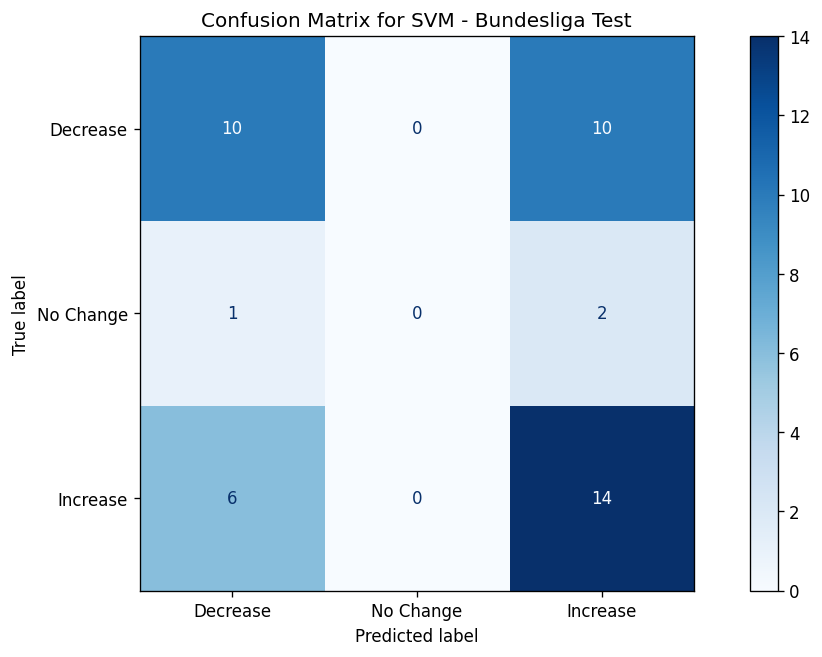

In [97]:
import numpy as np
import pandas as pd
from sklearn.svm import SVR
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

actual_test_changes_bundesliga = np.sign(np.diff(test['Bundesliga'].iloc[lag:]))
predicted_test_changes_bundesliga = np.sign(np.diff(test_pred.flatten()))

actual_test_categories_bundesliga = np.sign(actual_test_changes_bundesliga)
predicted_test_categories_bundesliga = np.sign(predicted_test_changes_bundesliga)

cm_test_bundesliga = confusion_matrix(actual_test_categories_bundesliga, predicted_test_categories_bundesliga, labels=[-1, 0, 1])
disp_test_bundesliga = ConfusionMatrixDisplay(confusion_matrix=cm_test_bundesliga, display_labels=['Decrease', 'No Change', 'Increase'])

disp_test_bundesliga.plot(cmap='Blues')
plt.title('Confusion Matrix for SVM - Bundesliga Test')
plt.show()


# MLB

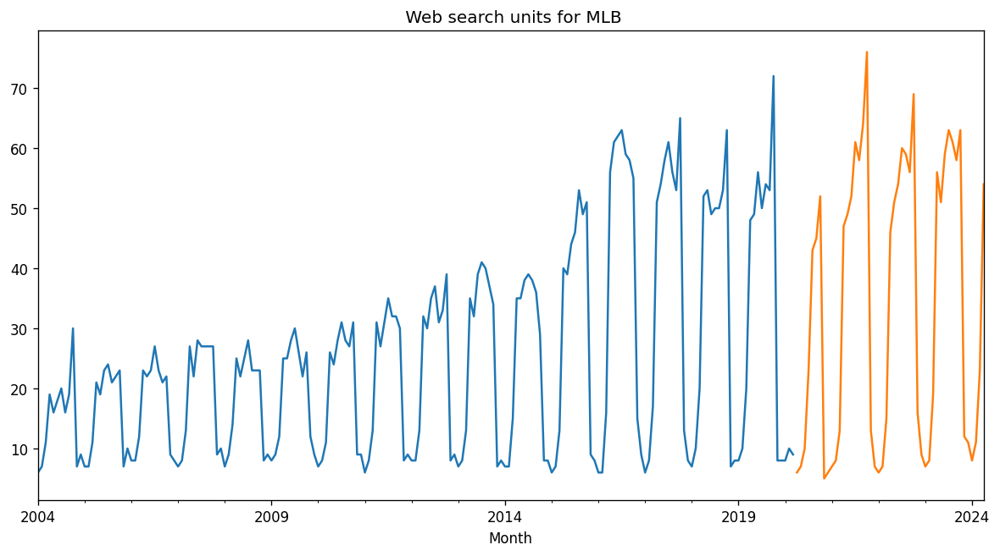

In [98]:
train.MLB.plot(title=" Web Search units for MLB")
test.MLB.plot(title=" Web search units for MLB")
plt.show()

### Simple Average

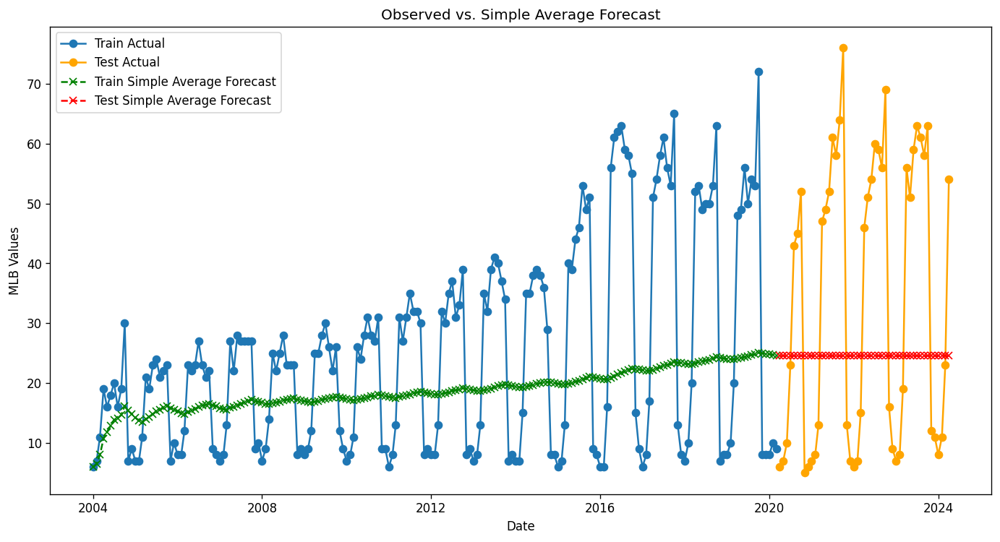

Train MAE with Simple Average Forecast: 13.920092542420546
Test MAE with Simple Average Forecast: 22.966509680795394
Train MSE with Simple Average Forecast: 283.0822328527841
Test MSE with Simple Average Forecast: 647.7243623287579
Train RMSE with Simple Average Forecast: 16.825047781589927
Test RMSE with Simple Average Forecast: 25.450429511675395
Train MAPE with Simple Average Forecast: 74.34769080666477
Test MAPE with Simple Average Forecast: 114.48246759246618


In [99]:
def calculate_mape(actual, forecast):
    actual, forecast = np.array(actual), np.array(forecast)
    actual = np.where(actual == 0, np.finfo(float).eps, actual)
    return np.mean(np.abs((actual - forecast) / actual)) * 100

simple_average = train['MLB'].mean()

train['simple_avg_forecast'] = [train['MLB'][:i].mean() for i in range(1, len(train['MLB'])+1)]
test['simple_avg_forecast'] = simple_average

train_mae_simple_avg = mean_absolute_error(train['MLB'].iloc[1:], train['simple_avg_forecast'].iloc[1:])
test_mae_simple_avg = mean_absolute_error(test['MLB'], test['simple_avg_forecast'])

train_mse_simple_avg = mean_squared_error(train['MLB'].iloc[1:], train['simple_avg_forecast'].iloc[1:])
test_mse_simple_avg = mean_squared_error(test['MLB'], test['simple_avg_forecast'])

train_rmse_simple_avg = np.sqrt(train_mse_simple_avg)
test_rmse_simple_avg = np.sqrt(test_mse_simple_avg)

train_mape_simple_avg = calculate_mape(train['MLB'].iloc[1:], train['simple_avg_forecast'].iloc[1:])
test_mape_simple_avg = calculate_mape(test['MLB'], test['simple_avg_forecast'])

plt.figure(figsize=(14, 7))
plt.plot(train.index, train['MLB'], label='Train Actual', marker='o')
plt.plot(test.index, test['MLB'], label='Test Actual', marker='o', color='orange')
plt.plot(train.index, train['simple_avg_forecast'], label='Train Simple Average Forecast', linestyle='--', marker='x', color='green')
plt.plot(test.index, [simple_average]*len(test), label='Test Simple Average Forecast', linestyle='--', marker='x', color='red')
plt.title('Observed vs. Simple Average Forecast')
plt.xlabel('Date')
plt.ylabel('MLB Values')
plt.legend()
plt.show()

print(f'Train MAE with Simple Average Forecast: {train_mae_simple_avg}')
print(f'Test MAE with Simple Average Forecast: {test_mae_simple_avg}')
print(f'Train MSE with Simple Average Forecast: {train_mse_simple_avg}')
print(f'Test MSE with Simple Average Forecast: {test_mse_simple_avg}')
print(f'Train RMSE with Simple Average Forecast: {train_rmse_simple_avg}')
print(f'Test RMSE with Simple Average Forecast: {test_rmse_simple_avg}')
print(f'Train MAPE with Simple Average Forecast: {train_mape_simple_avg}')
print(f'Test MAPE with Simple Average Forecast: {test_mape_simple_avg}')


### SMA

Train Metrics:
MAE: 10.597222222222221
MSE: 236.2384259259259
RMSE: 15.370049639670196
MAPE: 77.8144524761089%

Test Metrics:
MAE: 26.020408163265305
MSE: 1183.857142857143
RMSE: 34.40722515485872
MAPE: 59.069629759034%


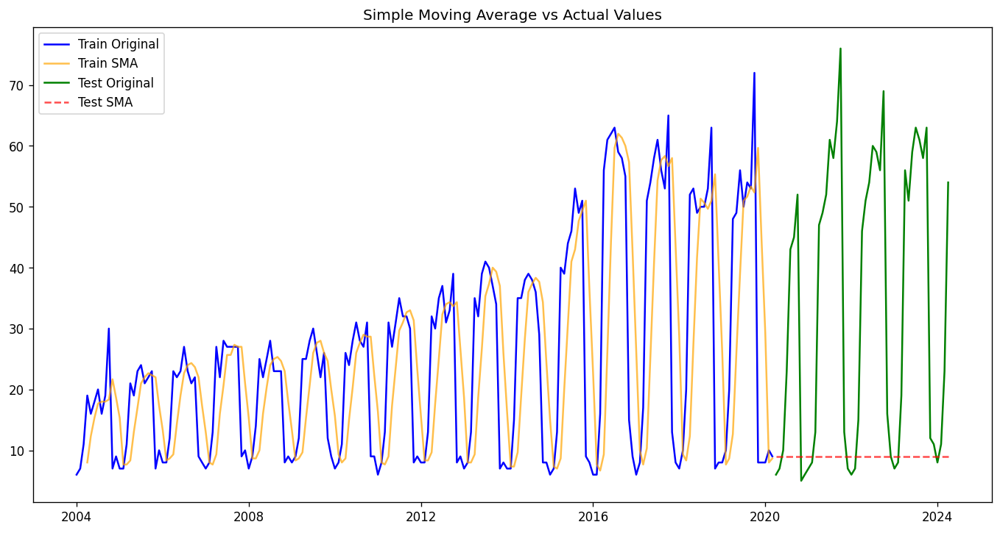

In [100]:
def calculate_mape(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

window_size = 3
train['SMA'] = train['MLB'].rolling(window=window_size).mean().shift(1)
test['SMA'] = train['MLB'].iloc[-window_size:].mean()

train_mae = mean_absolute_error(train['MLB'][window_size:], train['SMA'].dropna())
train_mse = mean_squared_error(train['MLB'][window_size:], train['SMA'].dropna())
train_rmse = np.sqrt(train_mse)
train_mape = calculate_mape(train['MLB'][window_size:], train['SMA'].dropna())

test_mae = mean_absolute_error(test['MLB'], test['SMA'])
test_mse = mean_squared_error(test['MLB'], test['SMA'])
test_rmse = np.sqrt(test_mse)
test_mape = calculate_mape(test['MLB'], test['SMA'])

print('Train Metrics:')
print(f'MAE: {train_mae}')
print(f'MSE: {train_mse}')
print(f'RMSE: {train_rmse}')
print(f'MAPE: {train_mape}%')

print('\nTest Metrics:')
print(f'MAE: {test_mae}')
print(f'MSE: {test_mse}')
print(f'RMSE: {test_rmse}')
print(f'MAPE: {test_mape}%')

plt.figure(figsize=(14, 7))
plt.plot(train['MLB'], label='Train Original', color='blue')
plt.plot(train['SMA'], label='Train SMA', color='orange', alpha=0.7)
plt.plot(test['MLB'], label='Test Original', color='green')
plt.plot(test['SMA'], label='Test SMA', color='red', linestyle='--', alpha=0.7)
plt.title('Simple Moving Average vs Actual Values')
plt.legend()
plt.show()


### SES

/opt/homebrew/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Train Metrics:
MAE: 6.531858124173063
MSE: 146.37824936904576
RMSE: 12.09868791931777
MAPE: 45.55506876972208%

Test Metrics:
MAE: 26.017544995063567
MSE: 1183.552688350643
RMSE: 34.40280058876956
MAPE: 59.07785150362875%


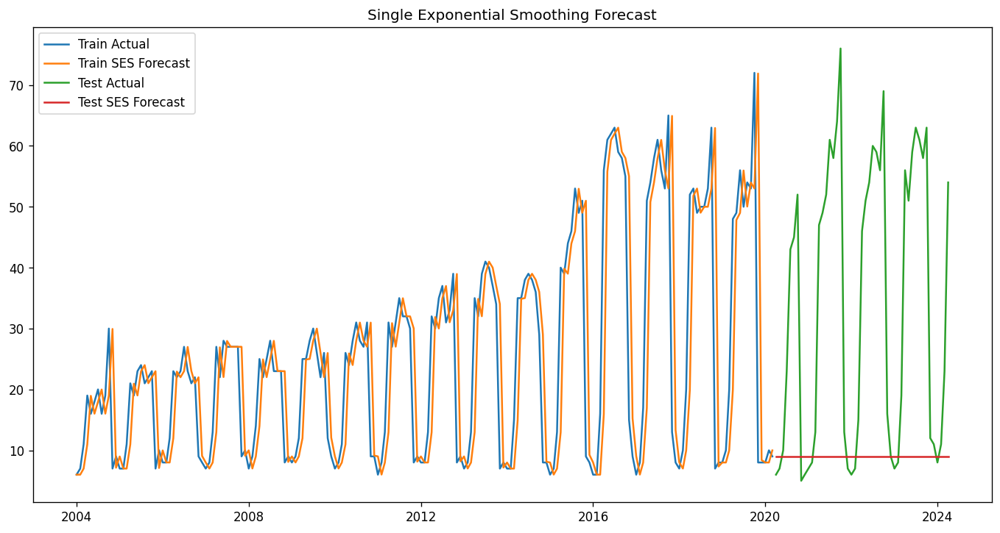

In [101]:
from statsmodels.tsa.holtwinters import SimpleExpSmoothing
from sklearn.metrics import mean_absolute_error, mean_squared_error
import matplotlib.pyplot as plt
import numpy as np

ses_model = SimpleExpSmoothing(train['MLB']).fit(optimized=True)

train['SES'] = ses_model.fittedvalues

test['SES'] = ses_model.forecast(steps=len(test))

train_mae = mean_absolute_error(train['MLB'], train['SES'])
train_mse = mean_squared_error(train['MLB'], train['SES'])
train_rmse = np.sqrt(train_mse)
train_mape = np.mean(np.abs((train['MLB'] - train['SES']) / train['MLB'])) * 100

test_mae = mean_absolute_error(test['MLB'], test['SES'])
test_mse = mean_squared_error(test['MLB'], test['SES'])
test_rmse = np.sqrt(test_mse)
test_mape = np.mean(np.abs((test['MLB'] - test['SES']) / test['MLB'])) * 100

print('Train Metrics:')
print(f'MAE: {train_mae}')
print(f'MSE: {train_mse}')
print(f'RMSE: {train_rmse}')
print(f'MAPE: {train_mape}%')

print('\nTest Metrics:')
print(f'MAE: {test_mae}')
print(f'MSE: {test_mse}')
print(f'RMSE: {test_rmse}')
print(f'MAPE: {test_mape}%')

plt.figure(figsize=(14, 7))
plt.plot(train['MLB'], label='Train Actual')
plt.plot(train['SES'], label='Train SES Forecast')
plt.plot(test['MLB'], label='Test Actual')
plt.plot(test['SES'], label='Test SES Forecast')
plt.title('Single Exponential Smoothing Forecast')
plt.legend()
plt.show()


### ETS 

/opt/homebrew/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Train Metrics:
MAE: 2.812046391355513
MSE: 16.898056444810567
RMSE: 4.110724564454613
MAPE: 15.9224155651706%

Test Metrics:
MAE: 6.997902015670097
MSE: 154.33810110012823
RMSE: 12.423288658810446
MAPE: 55.088330664544316%


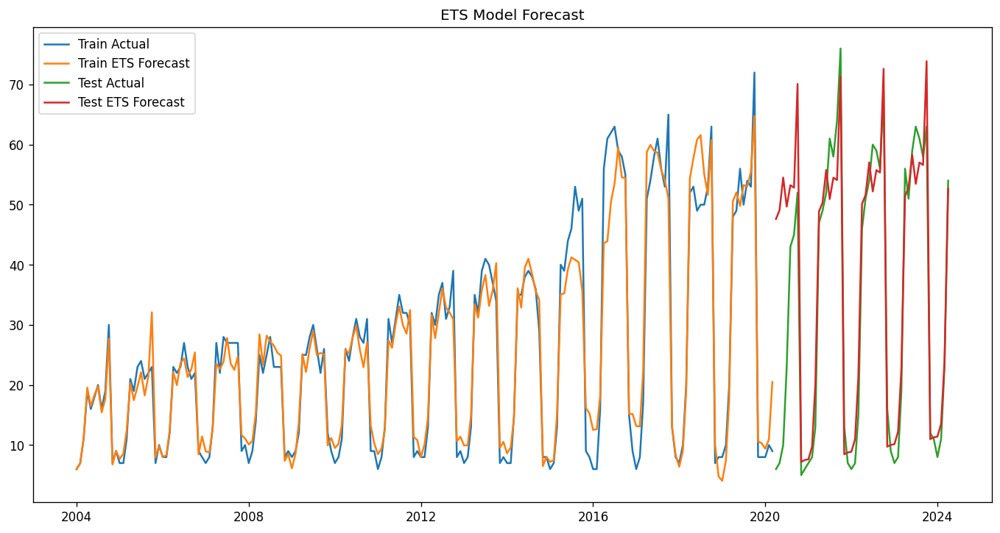

In [102]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing

def calculate_mape(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

ets_model = ExponentialSmoothing(
    train['MLB'], 
    trend="add", 
    seasonal="add", 
    seasonal_periods=12
).fit()

train['ETS'] = ets_model.fittedvalues

test['ETS'] = ets_model.forecast(steps=len(test))

train_mae = mean_absolute_error(train['MLB'], train['ETS'])
train_mse = mean_squared_error(train['MLB'], train['ETS'])
train_rmse = np.sqrt(train_mse)
train_mape = calculate_mape(train['MLB'], train['ETS'])

test_mae = mean_absolute_error(test['MLB'], test['ETS'])
test_mse = mean_squared_error(test['MLB'], test['ETS'])
test_rmse = np.sqrt(test_mse)
test_mape = calculate_mape(test['MLB'], test['ETS'])

print('Train Metrics:')
print(f'MAE: {train_mae}')
print(f'MSE: {train_mse}')
print(f'RMSE: {train_rmse}')
print(f'MAPE: {train_mape}%')

print('\nTest Metrics:')
print(f'MAE: {test_mae}')
print(f'MSE: {test_mse}')
print(f'RMSE: {test_rmse}')
print(f'MAPE: {test_mape}%')

plt.figure(figsize=(14, 7))
plt.plot(train['MLB'], label='Train Actual')
plt.plot(train['ETS'], label='Train ETS Forecast')
plt.plot(test['MLB'], label='Test Actual')
plt.plot(test['ETS'], label='Test ETS Forecast')
plt.title('ETS Model Forecast')
plt.legend()
plt.show()


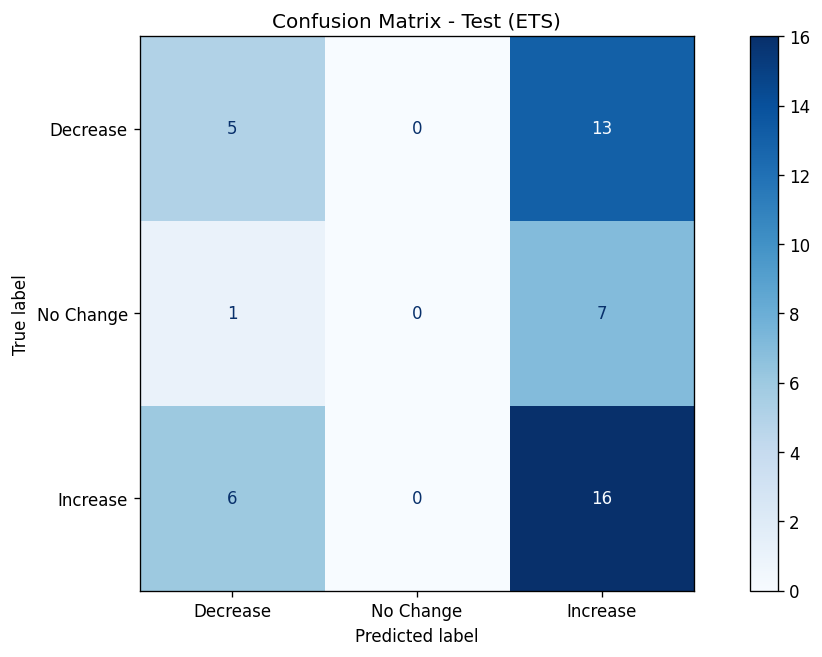

In [103]:

actual_train_change = np.sign(np.diff(train['SerieA'].values))
actual_test_change = np.sign(np.diff(test['SerieA'].values))

predicted_train_change = np.sign(np.diff(train['ETS'].values))
predicted_test_change = np.sign(np.diff(test['ETS'].values))

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm_train = confusion_matrix(actual_train_change, predicted_train_change, labels=[-1, 0, 1])
cm_test = confusion_matrix(actual_test_change, predicted_test_change, labels=[-1, 0, 1])


disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=['Decrease', 'No Change', 'Increase'])
disp_test.plot(cmap='Blues')
plt.title('Confusion Matrix - Test (ETS)')
plt.show()


### Naive Forecast

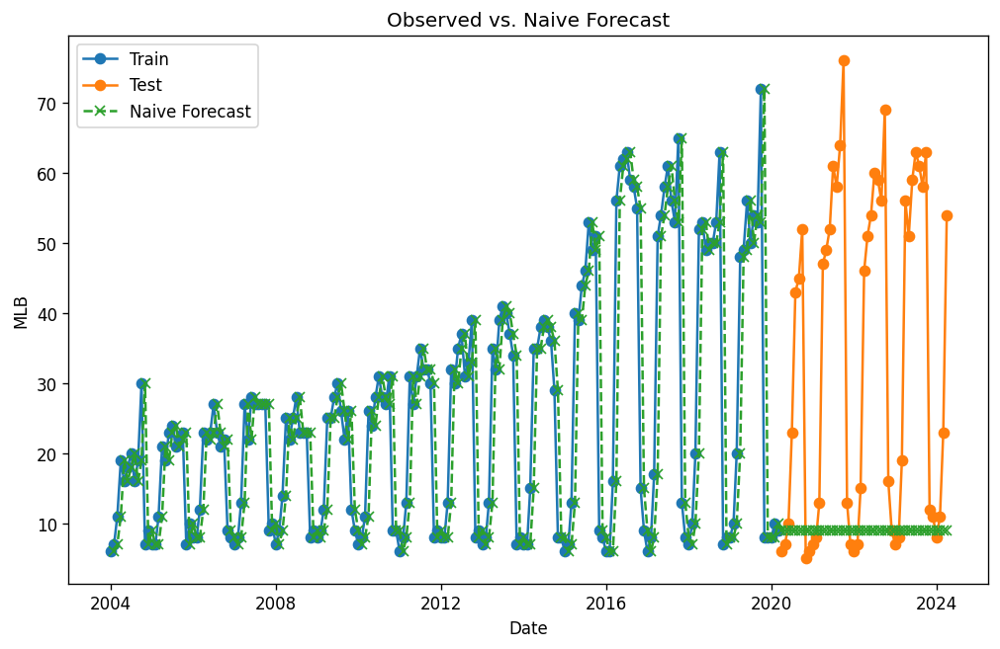

Train MAE: 6.561855670103093
Train MSE: 147.13917525773195
Train RMSE: 12.130093786023748
Train MAPE: 45.7798905995361 %
Test MAE: 26.020408163265305
Test MSE: 1183.857142857143
Test RMSE: 34.40722515485872
Test MAPE: 59.069629759034 %


In [104]:
train['naive_forecast'] = train['MLB'].shift(1)

train.loc[:, 'naive_forecast'] = train['MLB'].shift(1)
last_observed = train['MLB'].iloc[-1]
test.loc[:, 'naive_forecast'] = last_observed

train_mae = mean_absolute_error(train['MLB'].iloc[1:], train['naive_forecast'].iloc[1:])
train_mse = mean_squared_error(train['MLB'].iloc[1:], train['naive_forecast'].iloc[1:])
train_rmse = sqrt(train_mse)

test_mae = mean_absolute_error(test['MLB'], test['naive_forecast'])
test_mse = mean_squared_error(test['MLB'], test['naive_forecast'])
test_rmse = sqrt(test_mse)

train_mape = calculate_mape(train['MLB'].iloc[1:], train['naive_forecast'].iloc[1:])
test_mape_naive = calculate_mape(test['MLB'], test['naive_forecast'])

plt.figure(figsize=(10, 6))
plt.plot(train['MLB'], label='Train', marker='o')
plt.plot(test['MLB'], label='Test', marker='o')
plt.plot(pd.concat([train['naive_forecast'], test['naive_forecast']]), label='Naive Forecast', linestyle='--', marker='x')
plt.title('Observed vs. Naive Forecast')
plt.xlabel('Date')
plt.ylabel('MLB')
plt.legend()
plt.show()

print(f'Train MAE: {train_mae}')
print(f'Train MSE: {train_mse}')
print(f'Train RMSE: {train_rmse}')
print(f'Train MAPE: {train_mape} %')
print(f'Test MAE: {test_mae}')
print(f'Test MSE: {test_mse}')
print(f'Test RMSE: {test_rmse}')
print(f'Test MAPE: {test_mape_naive} %')


### Trends of MLB

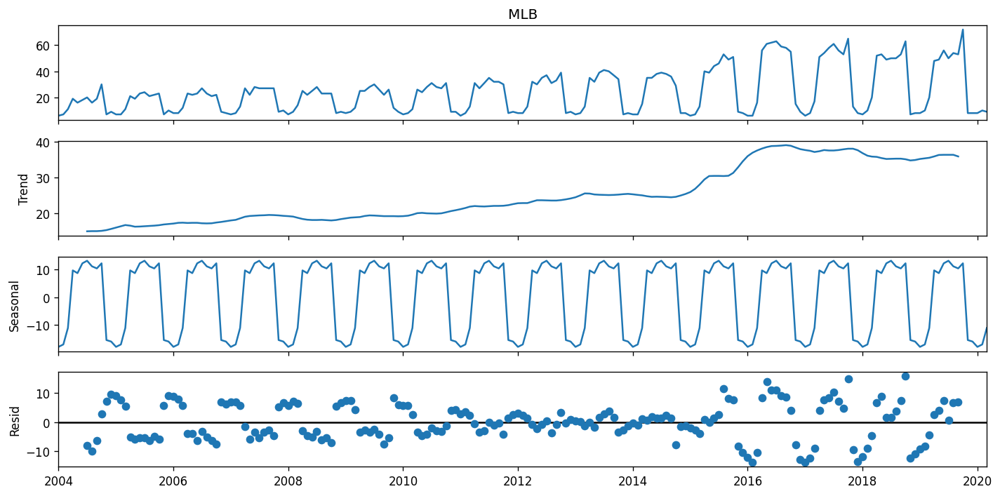

In [105]:
import statsmodels.api as sm
sm.tsa.seasonal_decompose(train.MLB).plot()
result = sm.tsa.stattools.adfuller(train.MLB)
plt.show()

### Holt's Linear Trend Model

/opt/homebrew/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/var/folders/9h/cz_6965d2zb35zxbgyc7pl_h0000gn/T/ipykernel_25199/1372436942.py:8: FutureWarning: the 'smoothing_slope' keyword is deprecated, use 'smoothing_trend' instead.
  model = Holt(train['MLB']).fit(smoothing_level=0.8, smoothing_slope=0.2, optimized=False)


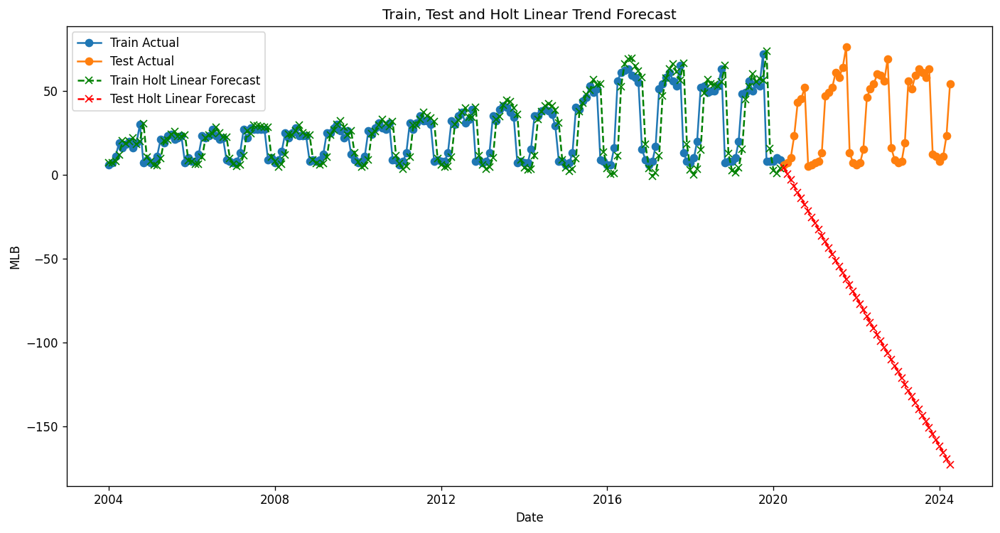

Train RMSE: 13.363076497537289
Train MAE: 7.88441989124828
Train MAPE: 55.94785753575331
Train MSE: 178.57181347903347
Test RMSE: 133.04436324375612
Test MAE: 118.30448134931162
Test MAPE: 569.0150894106566
Test MSE: 17700.802590936528


In [106]:
from statsmodels.tsa.holtwinters import Holt

def calculate_mape(actual, forecast):
    actual, forecast = np.array(actual), np.array(forecast)
    non_zero_actual = np.where(actual == 0, np.finfo(float).eps, actual)
    return np.mean(np.abs((actual - forecast) / non_zero_actual)) * 100

model = Holt(train['MLB']).fit(smoothing_level=0.8, smoothing_slope=0.2, optimized=False)

forecast = model.forecast(len(test))

test['Holt_linear_forecast'] = forecast.values

train['Holt_linear_forecast'] = model.fittedvalues

train_rmse = np.sqrt(mean_squared_error(train['MLB'], train['Holt_linear_forecast']))
train_mae = mean_absolute_error(train['MLB'], train['Holt_linear_forecast'])
train_mape = calculate_mape(train['MLB'], train['Holt_linear_forecast'])
train_mse = mean_squared_error(train['MLB'], train['Holt_linear_forecast'])

test_rmse_hlin = np.sqrt(mean_squared_error(test['MLB'], test['Holt_linear_forecast']))
test_mae_hlin = mean_absolute_error(test['MLB'], test['Holt_linear_forecast'])
test_mape_hlin = calculate_mape(test['MLB'], test['Holt_linear_forecast'])
test_mse_hlin = mean_squared_error(test['MLB'], test['Holt_linear_forecast'])

plt.figure(figsize=(14, 7))
plt.plot(train.index, train['MLB'], label='Train Actual', marker='o')
plt.plot(test.index, test['MLB'], label='Test Actual', marker='o')
plt.plot(train.index, train['Holt_linear_forecast'], label='Train Holt Linear Forecast', linestyle='--', marker='x', color='green')
plt.plot(test.index, test['Holt_linear_forecast'], label='Test Holt Linear Forecast', linestyle='--', marker='x', color='red')
plt.title('Train, Test and Holt Linear Trend Forecast')
plt.xlabel('Date')
plt.ylabel('MLB')
plt.legend()
plt.show()

print(f'Train RMSE: {train_rmse}')
print(f'Train MAE: {train_mae}')
print(f'Train MAPE: {train_mape}')
print(f'Train MSE: {train_mse}')
print(f'Test RMSE: {test_rmse_hlin}')
print(f'Test MAE: {test_mae_hlin}')
print(f'Test MAPE: {test_mape_hlin}')
print(f'Test MSE: {test_mse_hlin}')


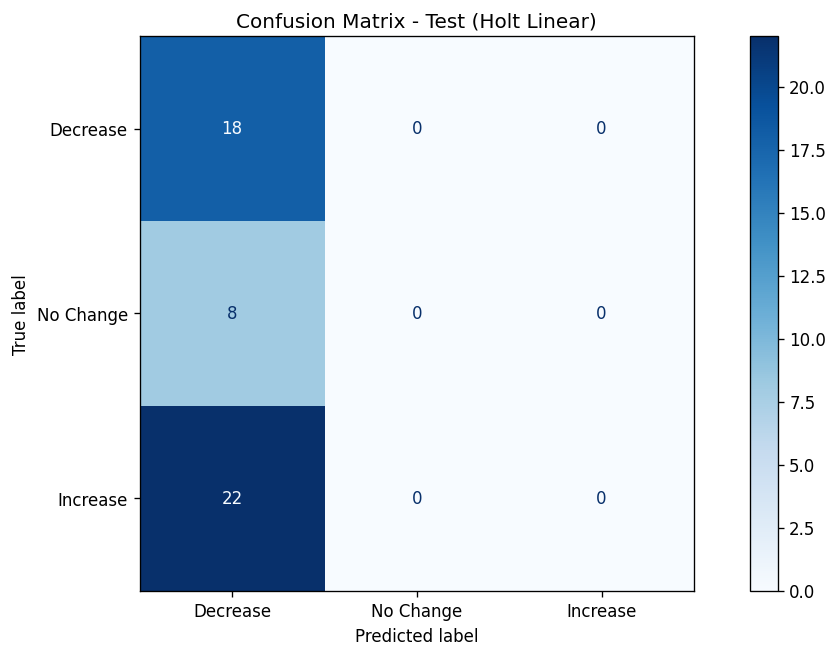

In [107]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import numpy as np


train_actual_changes = np.sign(np.diff(train['SerieA'].values))
train_predicted_changes = np.sign(np.diff(train['Holt_linear_forecast'].values))


test_actual_changes = np.sign(np.diff(test['SerieA'].values))
test_predicted_changes = np.sign(np.diff(test['Holt_linear_forecast'].values))


cm_train = confusion_matrix(train_actual_changes, train_predicted_changes, labels=[-1, 0, 1])
cm_test = confusion_matrix(test_actual_changes, test_predicted_changes, labels=[-1, 0, 1])




disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=['Decrease', 'No Change', 'Increase'])
disp_test.plot(cmap='Blues')
plt.title('Confusion Matrix - Test (Holt Linear)')
plt.show()


### Holt's Winter Exponential Method

/opt/homebrew/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


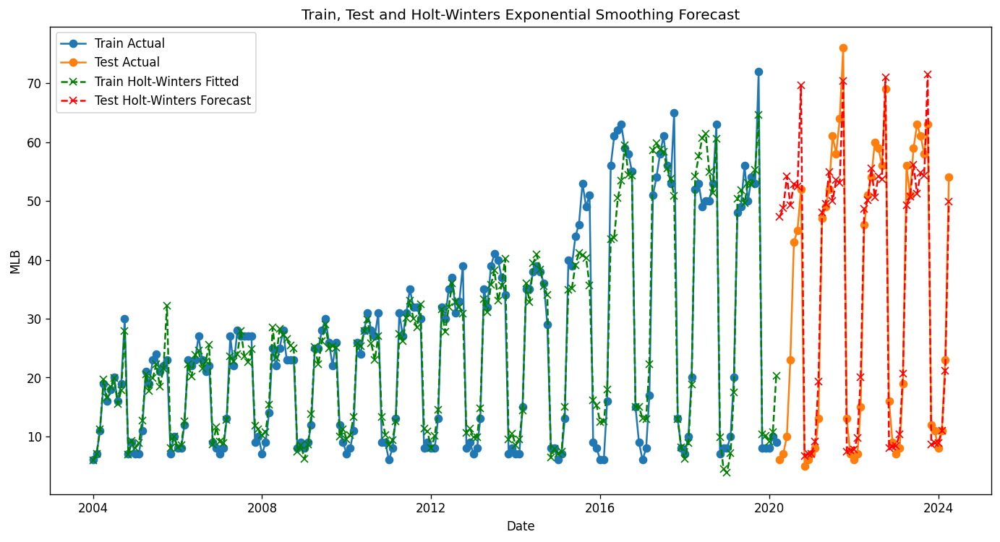

Train MAE: 2.8086564744831626
Train MSE: 16.905422663549004
Train RMSE: 4.1116204425444
Train MAPE: 15.880545964979751
Test MAE: 6.966854012830399
Test MSE: 153.93064474637532
Test RMSE: 12.406878928496695
Test MAPE: 51.922526207179445


In [108]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_absolute_error, mean_squared_error
import matplotlib.pyplot as plt
import numpy as np

def calculate_mape(actual, forecast):
    actual, forecast = np.array(actual), np.array(forecast)
    non_zero_actual = np.where(actual == 0, np.finfo(float).eps, actual)
    return np.mean(np.abs((actual - forecast) / non_zero_actual)) * 100

seasonal_periods = 12
model = ExponentialSmoothing(
    train['MLB'],
    seasonal='add',
    trend='add',
    seasonal_periods=seasonal_periods,
    damped_trend=True,
    initialization_method="estimated"
).fit()

train['Holt_Winters_fitted'] = model.fittedvalues

forecast = model.forecast(len(test))

test['Holt_Winters_forecast'] = forecast.values

train_mae = mean_absolute_error(train['MLB'], train['Holt_Winters_fitted'])
train_mse = mean_squared_error(train['MLB'], train['Holt_Winters_fitted'])
train_rmse = np.sqrt(train_mse)
train_mape = calculate_mape(train['MLB'], train['Holt_Winters_fitted'])

test_mae = mean_absolute_error(test['MLB'], test['Holt_Winters_forecast'])
test_mse = mean_squared_error(test['MLB'], test['Holt_Winters_forecast'])
test_rmse = np.sqrt(test_mse)
test_mape = calculate_mape(test['MLB'], test['Holt_Winters_forecast'])

plt.figure(figsize=(14, 7))
plt.plot(train.index, train['MLB'], label='Train Actual', marker='o')
plt.plot(test.index, test['MLB'], label='Test Actual', marker='o')
plt.plot(train.index, train['Holt_Winters_fitted'], label='Train Holt-Winters Fitted', linestyle='--', marker='x', color='green')
plt.plot(test.index, test['Holt_Winters_forecast'], label='Test Holt-Winters Forecast', linestyle='--', marker='x', color='red')
plt.title('Train, Test and Holt-Winters Exponential Smoothing Forecast')
plt.xlabel('Date')
plt.ylabel('MLB')
plt.legend()
plt.show()

print(f'Train MAE: {train_mae}')
print(f'Train MSE: {train_mse}')
print(f'Train RMSE: {train_rmse}')
print(f'Train MAPE: {train_mape}')
print(f'Test MAE: {test_mae}')
print(f'Test MSE: {test_mse}')
print(f'Test RMSE: {test_rmse}')
print(f'Test MAPE: {test_mape}')


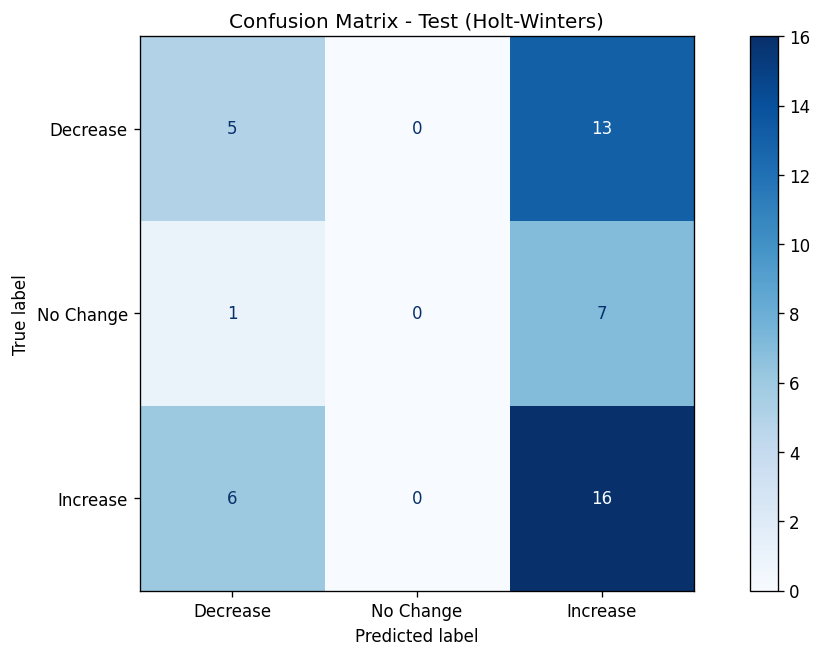

In [109]:

actual_train_change = np.sign(np.diff(train['SerieA'].values))
actual_test_change = np.sign(np.diff(test['SerieA'].values))

predicted_train_change = np.sign(np.diff(train['Holt_Winters_fitted'].values))
predicted_test_change = np.sign(np.diff(test['Holt_Winters_forecast'].values))

cm_train = confusion_matrix(actual_train_change, predicted_train_change, labels=[-1, 0, 1])
cm_test = confusion_matrix(actual_test_change, predicted_test_change, labels=[-1, 0, 1])


disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=['Decrease', 'No Change', 'Increase'])
disp_test.plot(cmap='Blues')
plt.title('Confusion Matrix - Test (Holt-Winters)')
plt.show()


### SARIMA MODEL

/opt/homebrew/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/homebrew/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.41450D+00    |proj g|=  3.93850D-02

At iterate    5    f=  2.39029D+00    |proj g|=  5.96398D-02

At iterate   10    f=  2.37211D+00    |proj g|=  3.23131D-02

At iterate   15    f=  2.37109D+00    |proj g|=  1.28681D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     19     27      1     0     0   8.860D-07   2.371D+00
  F =   2.3710205296341891     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


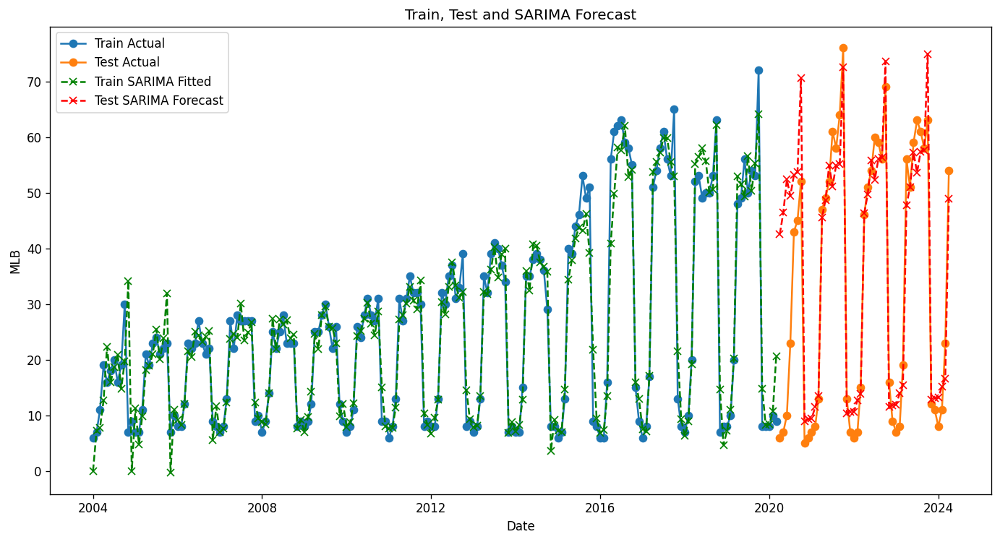

Train MAE: 2.83641133009386
Train MSE: 18.83668334268037
Train RMSE: 4.34012480726999
Train MAPE: 17.685362279914642
Test MAE: 7.012417899191668
Test MSE: 140.00342932859795
Test RMSE: 11.83230448089458
Test MAPE: 56.58657800657575


In [110]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_absolute_error, mean_squared_error
import matplotlib.pyplot as plt
import numpy as np

def calculate_mape(actual, forecast):
    actual, forecast = np.array(actual), np.array(forecast)
    non_zero_actual = np.where(actual == 0, np.finfo(float).eps, actual)
    return np.mean(np.abs((actual - forecast) / non_zero_actual)) * 100

order = (1, 1, 1)
seasonal_order = (1, 1, 1, 12)

model = SARIMAX(train['MLB'], order=order, seasonal_order=seasonal_order, enforce_stationarity=False, enforce_invertibility=False).fit()

train['SARIMA_fitted'] = model.fittedvalues

forecast = model.forecast(steps=len(test))

test['SARIMA_forecast'] = forecast.values

train_mae = mean_absolute_error(train['MLB'], train['SARIMA_fitted'])
train_mse = mean_squared_error(train['MLB'], train['SARIMA_fitted'])
train_rmse = np.sqrt(train_mse)
train_mape = calculate_mape(train['MLB'], train['SARIMA_fitted'])

test_mae = mean_absolute_error(test['MLB'], test['SARIMA_forecast'])
test_mse = mean_squared_error(test['MLB'], test['SARIMA_forecast'])
test_rmse = np.sqrt(test_mse)
test_mape = calculate_mape(test['MLB'], test['SARIMA_forecast'])

plt.figure(figsize=(14, 7))
plt.plot(train.index, train['MLB'], label='Train Actual', marker='o')
plt.plot(test.index, test['MLB'], label='Test Actual', marker='o')
plt.plot(train.index, train['SARIMA_fitted'], label='Train SARIMA Fitted', linestyle='--', marker='x', color='green')
plt.plot(test.index, test['SARIMA_forecast'], label='Test SARIMA Forecast', linestyle='--', marker='x', color='red')
plt.title('Train, Test and SARIMA Forecast')
plt.xlabel('Date')
plt.ylabel('MLB')
plt.legend()
plt.show()

print(f'Train MAE: {train_mae}')
print(f'Train MSE: {train_mse}')
print(f'Train RMSE: {train_rmse}')
print(f'Train MAPE: {train_mape}')
print(f'Test MAE: {test_mae}')
print(f'Test MSE: {test_mse}')
print(f'Test RMSE: {test_rmse}')
print(f'Test MAPE: {test_mape}')


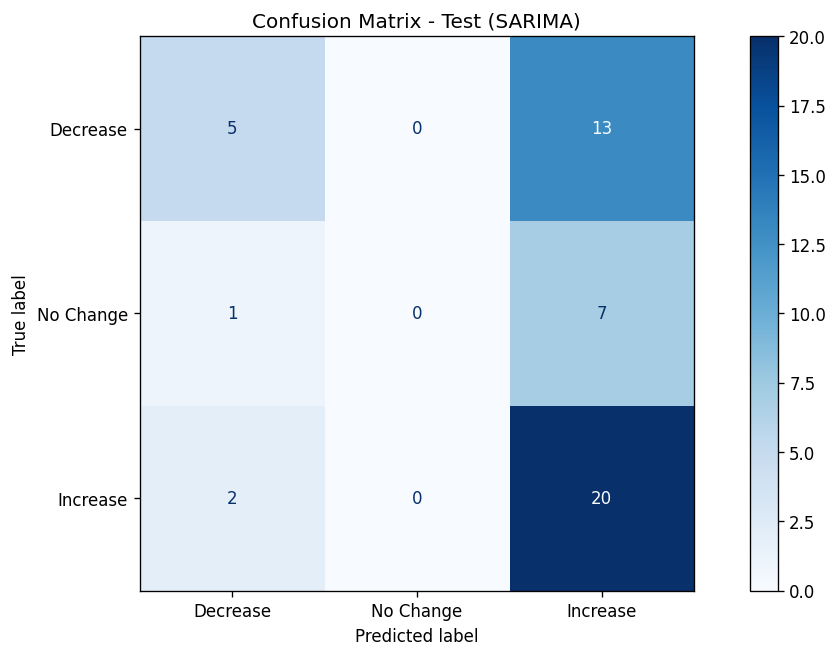

In [111]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt


train_actual_changes = np.sign(np.diff(train['SerieA'].values))
train_predicted_changes = np.sign(np.diff(train['SARIMA_fitted'].values))

test_actual_changes = np.sign(np.diff(test['SerieA'].values))
test_predicted_changes = np.sign(np.diff(test['SARIMA_forecast'].values))

cm_train = confusion_matrix(train_actual_changes, train_predicted_changes, labels=[-1, 0, 1])
cm_test = confusion_matrix(test_actual_changes, test_predicted_changes, labels=[-1, 0, 1])

disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=['Decrease', 'No Change', 'Increase'])
disp_test.plot(cmap='Blues')
plt.title('Confusion Matrix - Test (SARIMA)')
plt.show()


### Random Forest

/opt/homebrew/lib/python3.10/site-packages/sklearn/metrics/_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
/opt/homebrew/lib/python3.10/site-packages/sklearn/metrics/_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


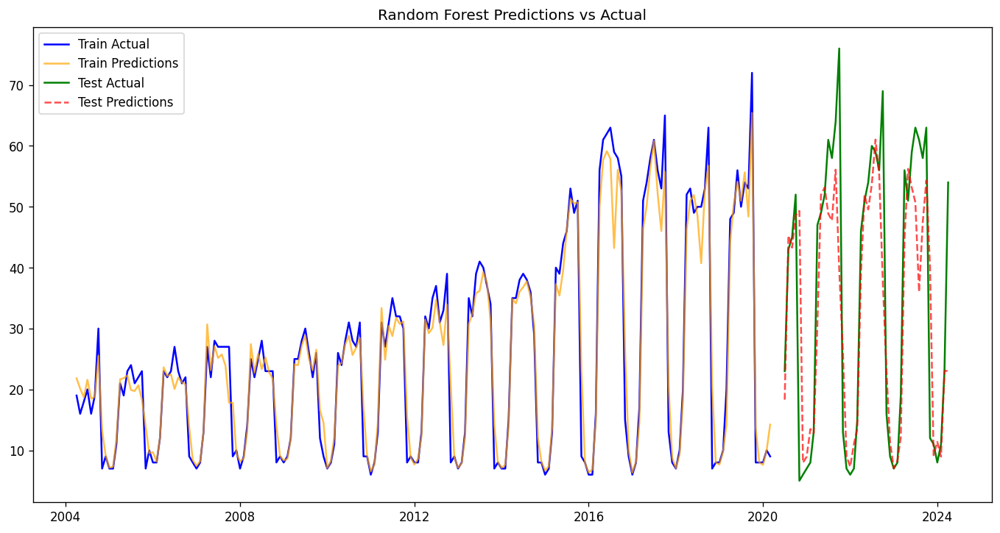

Train MAE: 2.383942212301587
Train MSE: 14.089887647770217
Train RMSE: 3.7536499101235075
Train MAPE: 14.359690239287726%
Test MAE: 8.466591614906834
Test MSE: 179.45138752362467
Test RMSE: 13.395946682621004
Test MAPE: 45.909823105071716%


In [112]:
from sklearn.ensemble import RandomForestRegressor
import pandas as pd
import numpy as np
from sklearn.metrics import mean_absolute_error, mean_squared_error
import matplotlib.pyplot as plt

def create_lagged_features(df, n_lags):
    return pd.concat([df.shift(i) for i in range(1, n_lags + 1)], axis=1)

n_lags = 3
train_lagged = create_lagged_features(train['MLB'], n_lags).dropna()
test_lagged = create_lagged_features(test['MLB'], n_lags).dropna()

train_X = train_lagged
train_y = train['MLB'][n_lags:]
test_X = test_lagged
test_y = test['MLB'][n_lags:]

rf = RandomForestRegressor(n_estimators=100, random_state=0)
rf.fit(train_X, train_y)

train_predictions = rf.predict(train_X)
test_predictions = rf.predict(test_X)

train_mae = mean_absolute_error(train_y, train_predictions)
train_mse = mean_squared_error(train_y, train_predictions)
train_rmse = mean_squared_error(train_y, train_predictions, squared=False)
train_mape = np.mean(np.abs((train_y - train_predictions) / train_y)) * 100

test_mae = mean_absolute_error(test_y, test_predictions)
test_mse = mean_squared_error(test_y, test_predictions)
test_rmse = mean_squared_error(test_y, test_predictions, squared=False)
test_mape = np.mean(np.abs((test_y - test_predictions) / test_y)) * 100

plt.figure(figsize=(14, 7))
plt.plot(train['MLB'].index[n_lags:], train_y, label='Train Actual', color='blue')
plt.plot(train['MLB'].index[n_lags:], train_predictions, label='Train Predictions', color='orange', alpha=0.7)
plt.plot(test['MLB'].index[n_lags:], test_y, label='Test Actual', color='green')
plt.plot(test['MLB'].index[n_lags:], test_predictions, label='Test Predictions', color='red', linestyle='--', alpha=0.7)
plt.title('Random Forest Predictions vs Actual')
plt.legend()
plt.show()

print(f'Train MAE: {train_mae}')
print(f'Train MSE: {train_mse}')
print(f'Train RMSE: {train_rmse}')
print(f'Train MAPE: {train_mape}%')
print(f'Test MAE: {test_mae}')
print(f'Test MSE: {test_mse}')
print(f'Test RMSE: {test_rmse}')
print(f'Test MAPE: {test_mape}%')


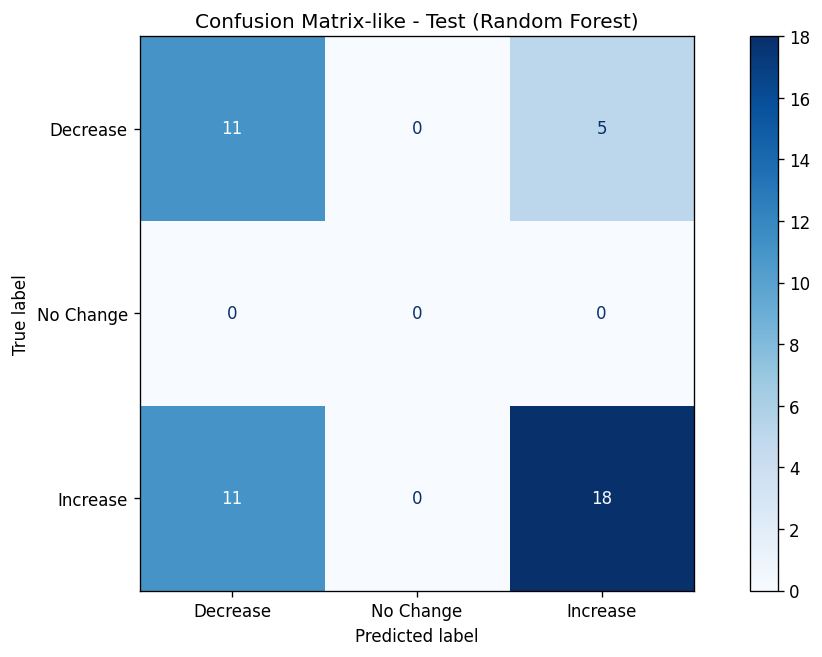

In [113]:

actual_train_change = np.sign(train_y.values[1:] - train_y.values[:-1])
actual_test_change = np.sign(test_y.values[1:] - test_y.values[:-1])

predicted_train_change = np.sign(train_predictions[1:] - train_predictions[:-1])
predicted_test_change = np.sign(test_predictions[1:] - test_predictions[:-1])

cm_train = confusion_matrix(actual_train_change, predicted_train_change, labels=[-1, 0, 1])
cm_test = confusion_matrix(actual_test_change, predicted_test_change, labels=[-1, 0, 1])


disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=['Decrease', 'No Change', 'Increase'])
disp_test.plot(cmap='Blues')
plt.title('Confusion Matrix-like - Test (Random Forest)')
plt.show()


### Theta Method

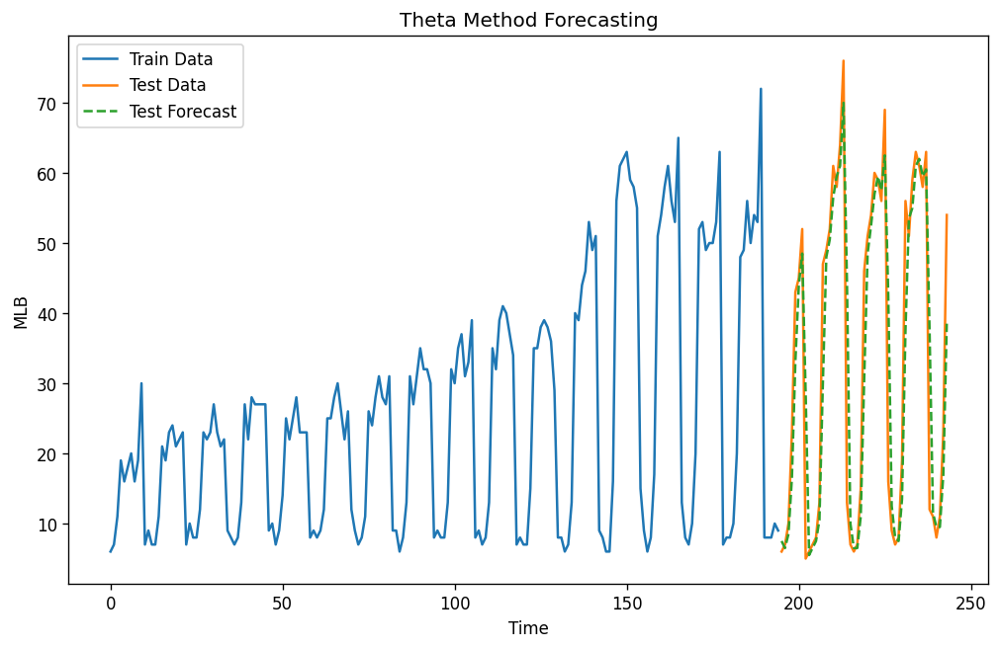

Train MSE: 182.86469072164948
Train MAE: 8.394329896907216
Train RMSE: 13.522747158830171
Train MAPE: 59.64296178118095
Test MSE: 90.91326530612245
Test MAE: 5.642857142857143
Test RMSE: 9.534844797170138
Test MAPE: 34.34990256252367


In [114]:
def theta_method(series, theta):
    n = len(series)
    if n == 0:
        raise ValueError("Empty series provided.")
    elif n == 1:
        return series[0]
    elif n == 2:
        return series[1]
    
    forecasts = []
    for i in range(1, n):
        forecasts.append(theta * series[i-1] + (1 - theta) * series[i])
    
    return forecasts[-1]

train_series = train['MLB'].values
test_series = test['MLB'].values

theta = 0.5  # Example theta parameter

train_forecasts = [theta_method(train_series[:i], theta) for i in range(1, len(train_series))]
test_forecasts = [theta_method(np.append(train_series, test_series[:i]), theta) for i in range(1, len(test_series)+1)]

train_mse = mean_squared_error(train_series[1:], train_forecasts)
train_mae = mean_absolute_error(train_series[1:], train_forecasts)
train_rmse = np.sqrt(train_mse)
train_mape = np.mean(np.abs((train_series[1:] - train_forecasts) / train_series[1:])) * 100

test_mse = mean_squared_error(test_series, test_forecasts)
test_mae = mean_absolute_error(test_series, test_forecasts)
test_rmse = np.sqrt(test_mse)
test_mape = np.mean(np.abs((test_series - test_forecasts) / test_series)) * 100

plt.figure(figsize=(10, 6))
plt.plot(train_series, label='Train Data')
plt.plot(np.arange(len(train_series), len(train_series) + len(test_series)), test_series, label='Test Data')
plt.plot(np.arange(len(train_series), len(train_series) + len(test_series)), test_forecasts, label='Test Forecast', linestyle='--')
plt.xlabel('Time')
plt.ylabel('MLB')
plt.title('Theta Method Forecasting')
plt.legend()
plt.show()

print(f'Train MSE: {train_mse}')
print(f'Train MAE: {train_mae}')
print(f'Train RMSE: {train_rmse}')
print(f'Train MAPE: {train_mape}')

print(f'Test MSE: {test_mse}')
print(f'Test MAE: {test_mae}')
print(f'Test RMSE: {test_rmse}')
print(f'Test MAPE: {test_mape}')


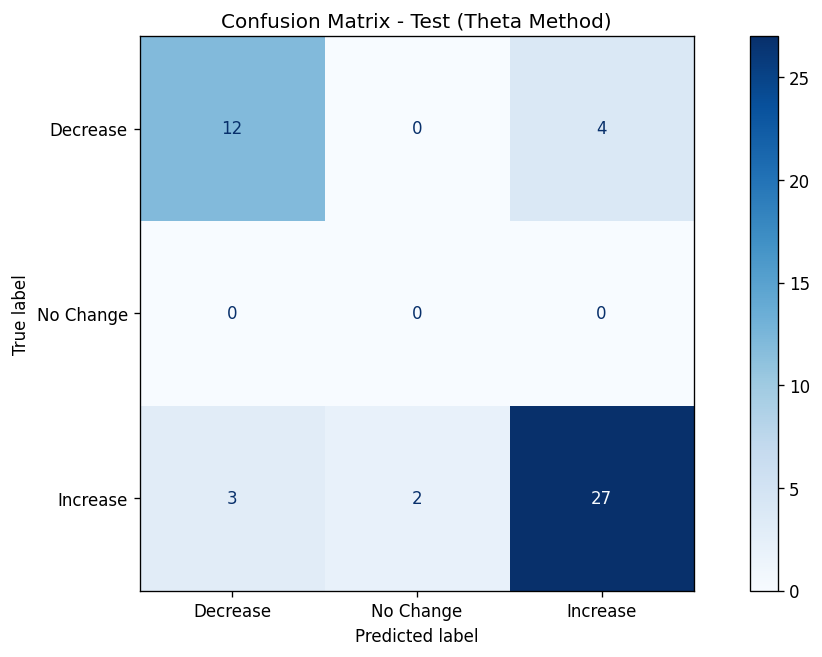

In [115]:
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

actual_test_change = np.diff(test_series)  
actual_test_change_cat = np.sign(actual_test_change) 

forecast_test_change = np.array(test_forecasts[1:]) - np.array(test_forecasts[:-1])  
forecast_test_change_cat = np.sign(forecast_test_change)

cm_test = confusion_matrix(actual_test_change_cat, forecast_test_change_cat, labels=[-1, 0, 1])


disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=['Decrease', 'No Change', 'Increase'])
disp_test.plot(cmap='Blues')
plt.title('Confusion Matrix - Test (Theta Method)')
plt.show()


### Support Vector Machine

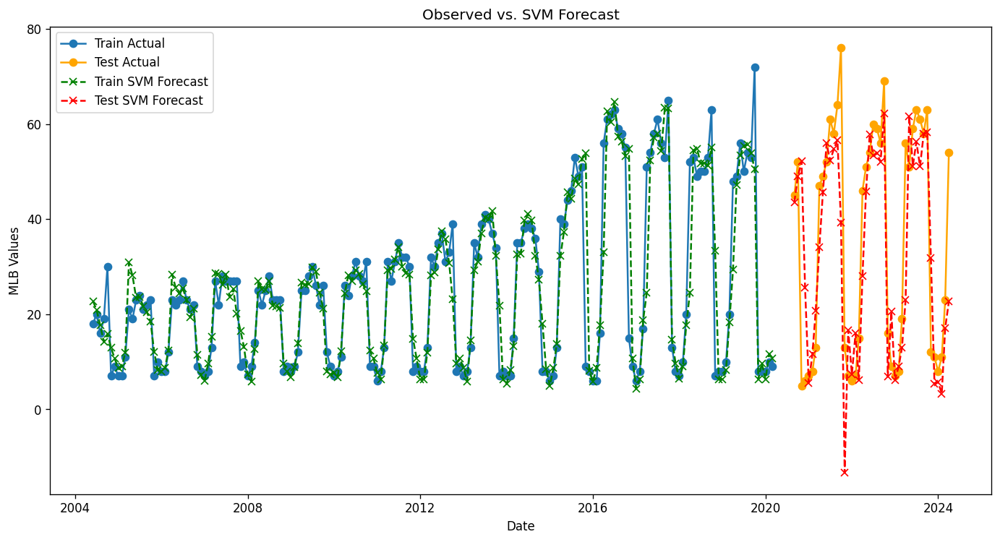

Train RMSE: 7.00570129517466, Test RMSE: 14.30514934311262
Train MSE: 49.07985063721191, Test MSE: 204.6372977287554
Train MAE: 3.5504468752183262, Test MAE: 9.974328942905908
Train MAPE: 114.22%, Test MAPE: 156.85%


In [116]:
import numpy as np
import pandas as pd
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

scaler = StandardScaler()
train_scaled = scaler.fit_transform(train[['MLB']])
test_scaled = scaler.transform(test[['MLB']])

def create_features(data, lag=1):
    X, y = [], []
    for i in range(lag, len(data)):
        X.append(data[i-lag:i].flatten())
        y.append(data[i])
    return np.array(X), np.array(y)

def calculate_mape(actual, forecast):
    actual, forecast = np.array(actual), np.array(forecast)
    actual = np.where(actual == 0, np.finfo(float).eps, actual)
    return np.mean(np.abs((actual - forecast) / actual)) * 100

lag = 5
X_train, y_train = create_features(train_scaled, lag)
X_test, y_test = create_features(test_scaled, lag)

model = SVR(kernel='rbf', C=100, gamma=0.1, epsilon=0.1)
model.fit(X_train, y_train.ravel())

train_pred_scaled = model.predict(X_train)
test_pred_scaled = model.predict(X_test)

train_pred = scaler.inverse_transform(train_pred_scaled.reshape(-1, 1))
test_pred = scaler.inverse_transform(test_pred_scaled.reshape(-1, 1))

train_rmse = np.sqrt(mean_squared_error(train['MLB'][lag:], train_pred))
test_rmse = np.sqrt(mean_squared_error(test['MLB'][lag:], test_pred))
train_mse = mean_squared_error(train['MLB'][lag:], train_pred)
test_mse = mean_squared_error(test['MLB'][lag:], test_pred)
train_mae = mean_absolute_error(train['MLB'][lag:], train_pred)
test_mae = mean_absolute_error(test['MLB'][lag:], test_pred)
train_mape = calculate_mape(train['MLB'][lag:], train_pred)
test_mape = calculate_mape(test['MLB'][lag:], test_pred)

plt.figure(figsize=(14, 7))
plt.plot(train.index[lag:], train['MLB'][lag:], label='Train Actual', marker='o')
plt.plot(test.index[lag:], test['MLB'][lag:], label='Test Actual', marker='o', color='orange')
plt.plot(train.index[lag:], train_pred, label='Train SVM Forecast', linestyle='--', marker='x', color='green')
plt.plot(test.index[lag:], test_pred, label='Test SVM Forecast', linestyle='--', marker='x', color='red')
plt.title('Observed vs. SVM Forecast')
plt.xlabel('Date')
plt.ylabel('MLB Values')
plt.legend()
plt.show()

print(f'Train RMSE: {train_rmse}, Test RMSE: {test_rmse}')
print(f'Train MSE: {train_mse}, Test MSE: {test_mse}')
print(f'Train MAE: {train_mae}, Test MAE: {test_mae}')
print(f'Train MAPE: {train_mape:.2f}%, Test MAPE: {test_mape:.2f}%')


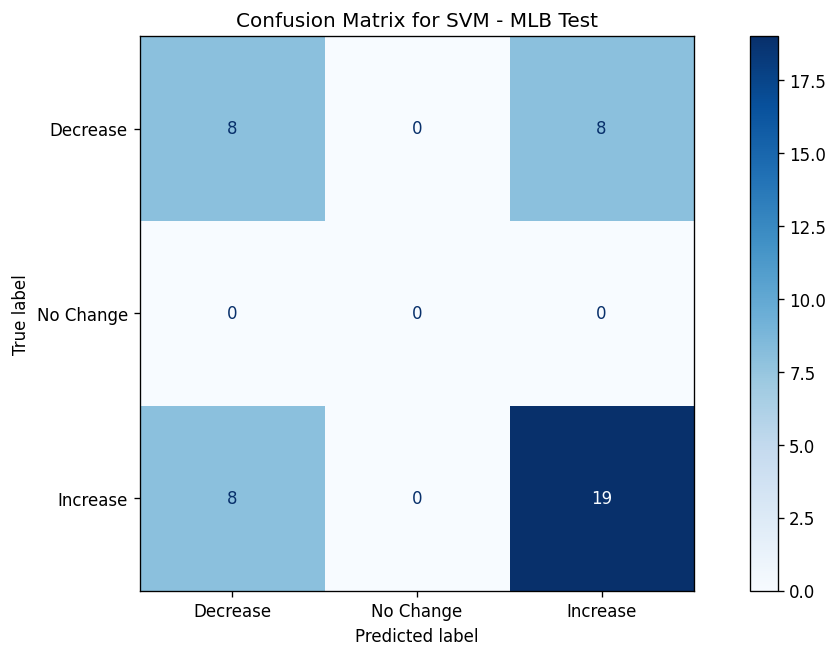

In [117]:
import numpy as np
import pandas as pd
from sklearn.svm import SVR
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

actual_test_changes_mlb = np.sign(np.diff(test['MLB'].iloc[lag:]))
predicted_test_changes_mlb = np.sign(np.diff(test_pred.flatten()))

actual_test_categories_mlb = np.sign(actual_test_changes_mlb)
predicted_test_categories_mlb = np.sign(predicted_test_changes_mlb)

cm_test_mlb = confusion_matrix(actual_test_categories_mlb, predicted_test_categories_mlb, labels=[-1, 0, 1])
disp_test_mlb = ConfusionMatrixDisplay(confusion_matrix=cm_test_mlb, display_labels=['Decrease', 'No Change', 'Increase'])

disp_test_mlb.plot(cmap='Blues')
plt.title('Confusion Matrix for SVM - MLB Test')
plt.show()


# Eredivisie

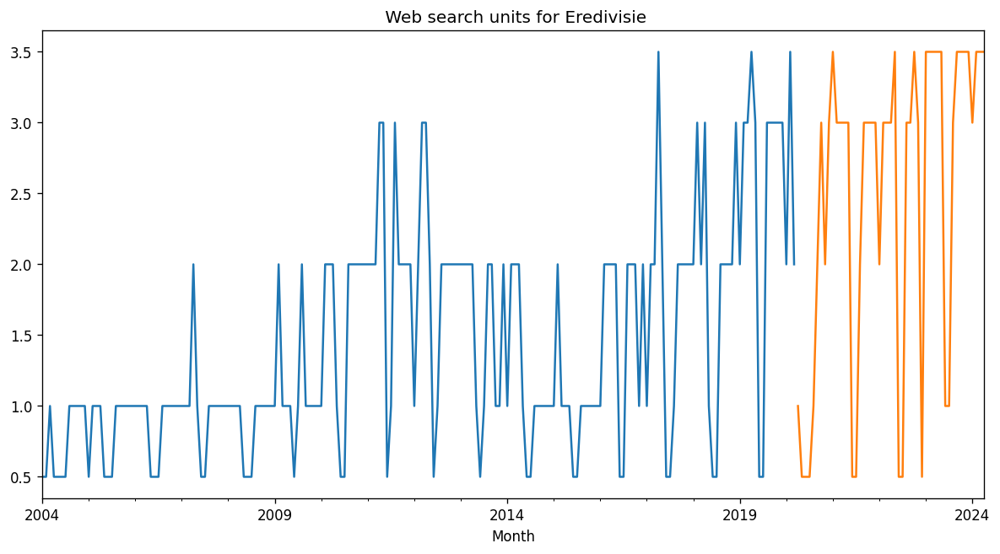

In [118]:
train['eredivisie'].plot(title=" Web Search units for Eredivisie")
test['eredivisie'].plot(title=" Web search units for Eredivisie")
plt.show()

### Simple Average

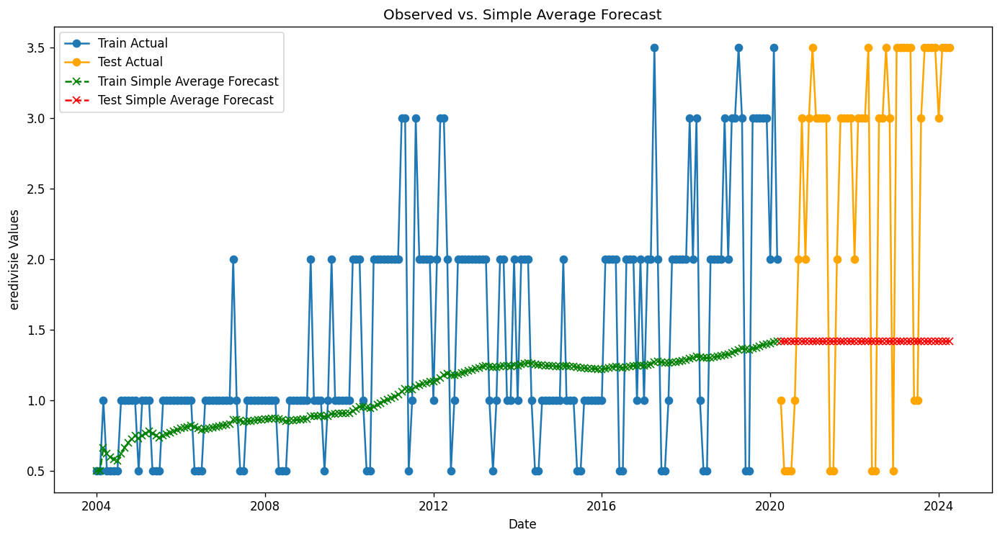

Train MAE with Simple Average Forecast: 0.5945936896380893
Test MAE with Simple Average Forecast: 1.4500261643118784
Train MSE with Simple Average Forecast: 0.6007448594749986
Test MSE with Simple Average Forecast: 2.4259370178051496
Train RMSE with Simple Average Forecast: 0.7750773248360441
Test RMSE with Simple Average Forecast: 1.5575419794680172
Train MAPE with Simple Average Forecast: 43.52087662659997
Test MAPE with Simple Average Forecast: 73.34379905808477


In [119]:
simple_average = train['eredivisie'].mean()

train['simple_avg_forecast'] = [train['eredivisie'][:i].mean() for i in range(1, len(train['eredivisie'])+1)]
test['simple_avg_forecast'] = simple_average

train_mae_simple_avg = mean_absolute_error(train['eredivisie'].iloc[1:], train['simple_avg_forecast'].iloc[1:])
test_mae_simple_avg = mean_absolute_error(test['eredivisie'], test['simple_avg_forecast'])

train_mse_simple_avg = mean_squared_error(train['eredivisie'].iloc[1:], train['simple_avg_forecast'].iloc[1:])
test_mse_simple_avg = mean_squared_error(test['eredivisie'], test['simple_avg_forecast'])

train_rmse_simple_avg = np.sqrt(train_mse_simple_avg)
test_rmse_simple_avg = np.sqrt(test_mse_simple_avg)

train_mape_simple_avg = calculate_mape(train['eredivisie'].iloc[1:], train['simple_avg_forecast'].iloc[1:])
test_mape_simple_avg = calculate_mape(test['eredivisie'], test['simple_avg_forecast'])

plt.figure(figsize=(14, 7))
plt.plot(train.index, train['eredivisie'], label='Train Actual', marker='o')
plt.plot(test.index, test['eredivisie'], label='Test Actual', marker='o', color='orange')
plt.plot(train.index, train['simple_avg_forecast'], label='Train Simple Average Forecast', linestyle='--', marker='x', color='green')
plt.plot(test.index, [simple_average]*len(test), label='Test Simple Average Forecast', linestyle='--', marker='x', color='red')
plt.title('Observed vs. Simple Average Forecast')
plt.xlabel('Date')
plt.ylabel('eredivisie Values')
plt.legend()
plt.show()

print(f'Train MAE with Simple Average Forecast: {train_mae_simple_avg}')
print(f'Test MAE with Simple Average Forecast: {test_mae_simple_avg}')
print(f'Train MSE with Simple Average Forecast: {train_mse_simple_avg}')
print(f'Test MSE with Simple Average Forecast: {test_mse_simple_avg}')
print(f'Train RMSE with Simple Average Forecast: {train_rmse_simple_avg}')
print(f'Test RMSE with Simple Average Forecast: {test_rmse_simple_avg}')
print(f'Train MAPE with Simple Average Forecast: {train_mape_simple_avg}')
print(f'Test MAPE with Simple Average Forecast: {test_mape_simple_avg}')


### Simple Moving Average

Train Metrics:
MAE: 0.5130208333333334
MSE: 0.5357349537037037
RMSE: 0.7319391734998911
MAPE: 52.343750000000014%

Test Metrics:
MAE: 0.9795918367346939
MSE: 1.2551020408163265
RMSE: 1.1203133672398657
MAPE: 94.46064139941693%


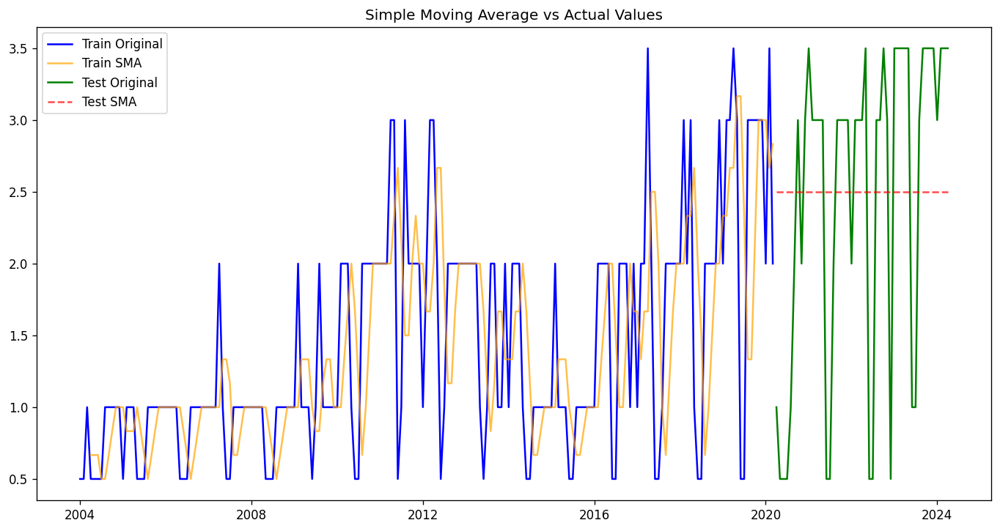

In [120]:
window_size = 3
train['SMA'] = train['eredivisie'].rolling(window=window_size).mean().shift(1)
test['SMA'] = train['eredivisie'].iloc[-window_size:].mean()

train_mae = mean_absolute_error(train['eredivisie'][window_size:], train['SMA'].dropna())
train_mse = mean_squared_error(train['eredivisie'][window_size:], train['SMA'].dropna())
train_rmse = np.sqrt(train_mse)
train_mape = calculate_mape(train['eredivisie'][window_size:], train['SMA'].dropna())

test_mae = mean_absolute_error(test['eredivisie'], test['SMA'])
test_mse = mean_squared_error(test['eredivisie'], test['SMA'])
test_rmse = np.sqrt(test_mse)
test_mape = calculate_mape(test['eredivisie'], test['SMA'])

print('Train Metrics:')
print(f'MAE: {train_mae}')
print(f'MSE: {train_mse}')
print(f'RMSE: {train_rmse}')
print(f'MAPE: {train_mape}%')

print('\nTest Metrics:')
print(f'MAE: {test_mae}')
print(f'MSE: {test_mse}')
print(f'RMSE: {test_rmse}')
print(f'MAPE: {test_mape}%')

plt.figure(figsize=(14, 7))
plt.plot(train['eredivisie'], label='Train Original', color='blue')
plt.plot(train['SMA'], label='Train SMA', color='orange', alpha=0.7)
plt.plot(test['eredivisie'], label='Test Original', color='green')
plt.plot(test['SMA'], label='Test SMA', color='red', linestyle='--', alpha=0.7)
plt.title('Simple Moving Average vs Actual Values')
plt.legend()
plt.show()


### SES

/opt/homebrew/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Train Metrics:
MAE: 0.46893726999770813
MSE: 0.40001935525328847
RMSE: 0.6324708335198458
MAPE: 46.351835798535085%

Test Metrics:
MAE: 0.9677923552758143
MSE: 1.2562587392877416
RMSE: 1.1208294871601754
MAPE: 95.27371491170945%


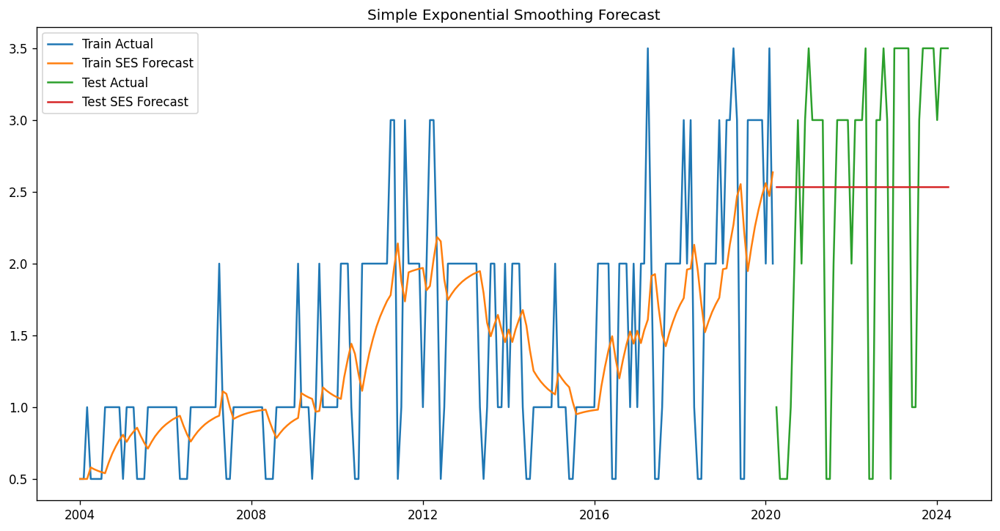

In [121]:
ses_model = SimpleExpSmoothing(train['eredivisie']).fit(optimized=True)

train['SES'] = ses_model.fittedvalues

test['SES'] = ses_model.forecast(steps=len(test))

train_mae = mean_absolute_error(train['eredivisie'], train['SES'])
train_mse = mean_squared_error(train['eredivisie'], train['SES'])
train_rmse = np.sqrt(train_mse)
train_mape = np.mean(np.abs((train['eredivisie'] - train['SES']) / train['eredivisie'])) * 100

test_mae = mean_absolute_error(test['eredivisie'], test['SES'])
test_mse = mean_squared_error(test['eredivisie'], test['SES'])
test_rmse = np.sqrt(test_mse)
test_mape = np.mean(np.abs((test['eredivisie'] - test['SES']) / test['eredivisie'])) * 100

print('Train Metrics:')
print(f'MAE: {train_mae}')
print(f'MSE: {train_mse}')
print(f'RMSE: {train_rmse}')
print(f'MAPE: {train_mape}%')

print('\nTest Metrics:')
print(f'MAE: {test_mae}')
print(f'MSE: {test_mse}')
print(f'RMSE: {test_rmse}')
print(f'MAPE: {test_mape}%')

plt.figure(figsize=(14, 7))
plt.plot(train['eredivisie'], label='Train Actual')
plt.plot(train['SES'], label='Train SES Forecast')
plt.plot(test['eredivisie'], label='Test Actual')
plt.plot(test['SES'], label='Test SES Forecast')
plt.title('Simple Exponential Smoothing Forecast')
plt.legend()
plt.show()


### ETS

/opt/homebrew/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Train Metrics:
MAE: 0.32279013821869224
MSE: 0.18742961893810742
RMSE: 0.43293142521432587
MAPE: 28.507949313166737%

Test Metrics:
MAE: 0.5780221033362725
MSE: 0.6493492607018232
RMSE: 0.8058221023909826
MAPE: 57.720522945364074%


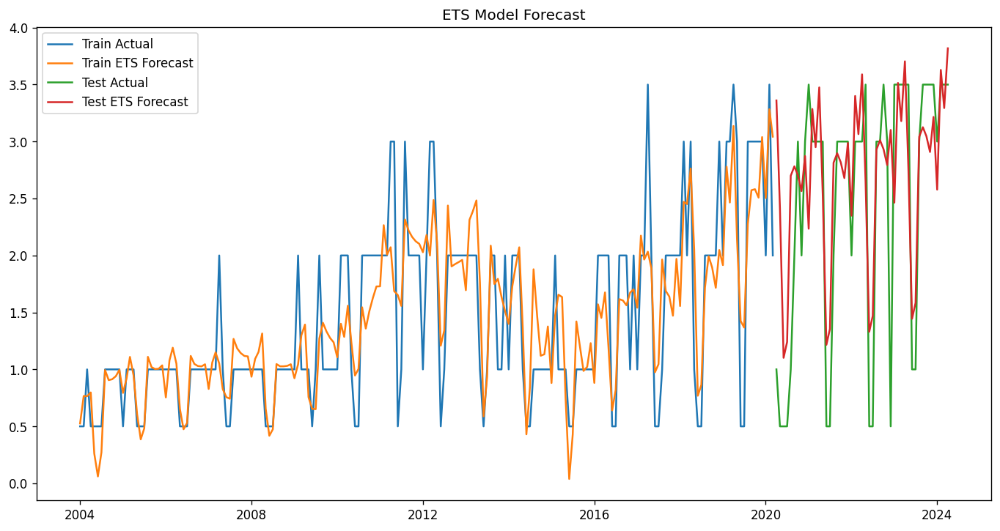

In [122]:
ets_model = ExponentialSmoothing(
    train['eredivisie'], 
    trend="add", 
    seasonal="add", 
    seasonal_periods=12
).fit()

train['ETS'] = ets_model.fittedvalues

test['ETS'] = ets_model.forecast(steps=len(test))

train_mae = mean_absolute_error(train['eredivisie'], train['ETS'])
train_mse = mean_squared_error(train['eredivisie'], train['ETS'])
train_rmse = np.sqrt(train_mse)
train_mape = calculate_mape(train['eredivisie'], train['ETS'])

test_mae = mean_absolute_error(test['eredivisie'], test['ETS'])
test_mse = mean_squared_error(test['eredivisie'], test['ETS'])
test_rmse = np.sqrt(test_mse)
test_mape = calculate_mape(test['eredivisie'], test['ETS'])

print('Train Metrics:')
print(f'MAE: {train_mae}')
print(f'MSE: {train_mse}')
print(f'RMSE: {train_rmse}')
print(f'MAPE: {train_mape}%')

print('\nTest Metrics:')
print(f'MAE: {test_mae}')
print(f'MSE: {test_mse}')
print(f'RMSE: {test_rmse}')
print(f'MAPE: {test_mape}%')

plt.figure(figsize=(14, 7))
plt.plot(train['eredivisie'], label='Train Actual')
plt.plot(train['ETS'], label='Train ETS Forecast')
plt.plot(test['eredivisie'], label='Test Actual')
plt.plot(test['ETS'], label='Test ETS Forecast')
plt.title('ETS Model Forecast')
plt.legend()
plt.show()


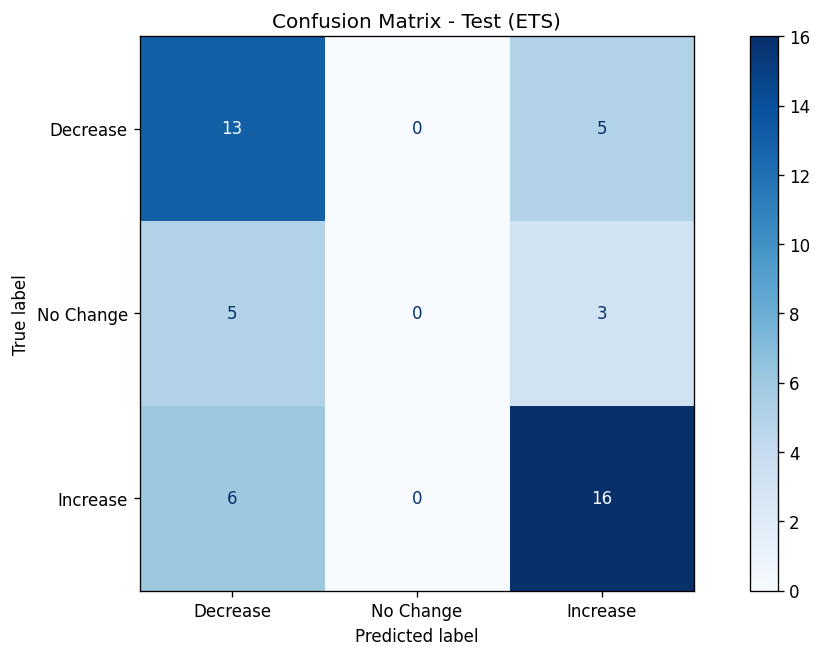

In [123]:

actual_train_change = np.sign(np.diff(train['SerieA'].values))
actual_test_change = np.sign(np.diff(test['SerieA'].values))

predicted_train_change = np.sign(np.diff(train['ETS'].values))
predicted_test_change = np.sign(np.diff(test['ETS'].values))

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm_train = confusion_matrix(actual_train_change, predicted_train_change, labels=[-1, 0, 1])
cm_test = confusion_matrix(actual_test_change, predicted_test_change, labels=[-1, 0, 1])


disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=['Decrease', 'No Change', 'Increase'])
disp_test.plot(cmap='Blues')
plt.title('Confusion Matrix - Test (ETS)')
plt.show()


### Naive Forecast

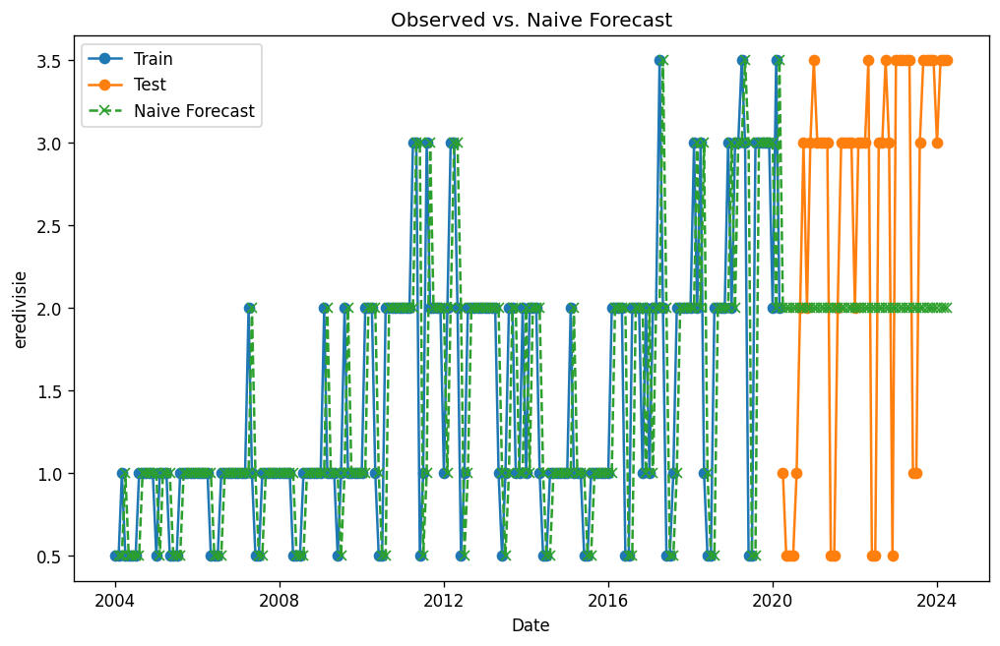

Train MAE: 0.39948453608247425
Train MSE: 0.4806701030927835
Train RMSE: 0.6933037596124685
Train MAPE: 36.03951890034364 %
Test MAE: 1.153061224489796
Test MSE: 1.5051020408163265
Test RMSE: 1.2268260026655478
Test MAPE: 82.50728862973762 %


In [124]:
train['naive_forecast'] = train['eredivisie'].shift(1)

train.loc[:, 'naive_forecast'] = train['eredivisie'].shift(1)
last_observed = train['eredivisie'].iloc[-1]
test.loc[:, 'naive_forecast'] = last_observed

train_mae = mean_absolute_error(train['eredivisie'].iloc[1:], train['naive_forecast'].iloc[1:])
train_mse = mean_squared_error(train['eredivisie'].iloc[1:], train['naive_forecast'].iloc[1:])
train_rmse = sqrt(train_mse)

test_mae = mean_absolute_error(test['eredivisie'], test['naive_forecast'])
test_mse = mean_squared_error(test['eredivisie'], test['naive_forecast'])
test_rmse = sqrt(test_mse)

train_mape = calculate_mape(train['eredivisie'].iloc[1:], train['naive_forecast'].iloc[1:])
test_mape_naive = calculate_mape(test['eredivisie'], test['naive_forecast'])

plt.figure(figsize=(10, 6))
plt.plot(train['eredivisie'], label='Train', marker='o')
plt.plot(test['eredivisie'], label='Test', marker='o')
plt.plot(pd.concat([train['naive_forecast'], test['naive_forecast']]), label='Naive Forecast', linestyle='--', marker='x')
plt.title('Observed vs. Naive Forecast')
plt.xlabel('Date')
plt.ylabel('eredivisie')
plt.legend()
plt.show()

print(f'Train MAE: {train_mae}')
print(f'Train MSE: {train_mse}')
print(f'Train RMSE: {train_rmse}')
print(f'Train MAPE: {train_mape} %')
print(f'Test MAE: {test_mae}')
print(f'Test MSE: {test_mse}')
print(f'Test RMSE: {test_rmse}')
print(f'Test MAPE: {test_mape_naive} %')


### Trends of eredivisie league

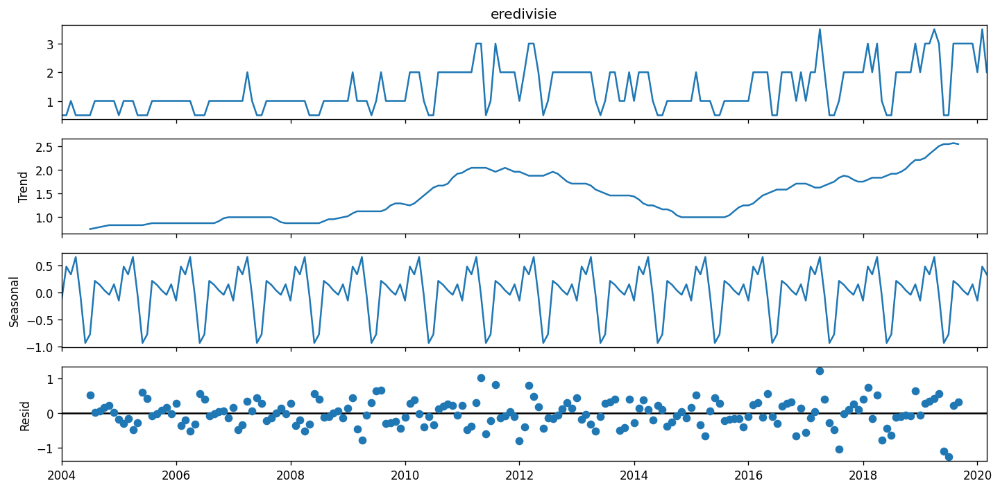

In [125]:
import statsmodels.api as sm
sm.tsa.seasonal_decompose(train['eredivisie']).plot()
result = sm.tsa.stattools.adfuller(train['eredivisie'])
plt.show()

### Holt's Linear Trend Model



/opt/homebrew/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/var/folders/9h/cz_6965d2zb35zxbgyc7pl_h0000gn/T/ipykernel_25199/2996268402.py:1: FutureWarning: the 'smoothing_slope' keyword is deprecated, use 'smoothing_trend' instead.
  model = Holt(train['eredivisie']).fit(smoothing_level=0.8, smoothing_slope=0.2, optimized=False)


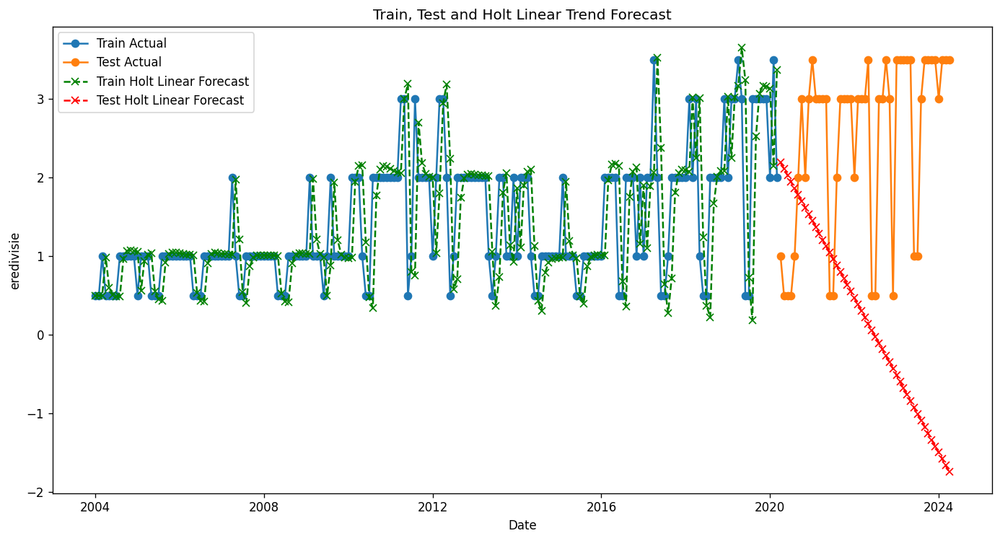

Train MAE: 0.4611150252166063
Train MSE: 0.5444517501171591
Train RMSE: 0.7378697379057899
Train MAPE: 42.392025016925835
Test MAE: 2.5893164079534667
Test MSE: 8.966448918364167
Test RMSE: 2.9944029318654106
Test MAPE: 114.72689576442843


In [126]:
model = Holt(train['eredivisie']).fit(smoothing_level=0.8, smoothing_slope=0.2, optimized=False)

forecast = model.forecast(len(test))

test['Holt_linear_forecast'] = forecast.values

train['Holt_linear_forecast'] = model.fittedvalues

train_mae = mean_absolute_error(train['eredivisie'], train['Holt_linear_forecast'])
train_mse = mean_squared_error(train['eredivisie'], train['Holt_linear_forecast'])
train_rmse = np.sqrt(train_mse)
train_mape = calculate_mape(train['eredivisie'], train['Holt_linear_forecast'])

test_mae = mean_absolute_error(test['eredivisie'], test['Holt_linear_forecast'])
test_mse = mean_squared_error(test['eredivisie'], test['Holt_linear_forecast'])
test_rmse_hlin = np.sqrt(test_mse)
test_mape_hlin = calculate_mape(test['eredivisie'], test['Holt_linear_forecast'])

plt.figure(figsize=(14, 7))
plt.plot(train.index, train['eredivisie'], label='Train Actual', marker='o')
plt.plot(test.index, test['eredivisie'], label='Test Actual', marker='o')
plt.plot(train.index, train['Holt_linear_forecast'], label='Train Holt Linear Forecast', linestyle='--', marker='x', color='green')
plt.plot(test.index, test['Holt_linear_forecast'], label='Test Holt Linear Forecast', linestyle='--', marker='x', color='red')
plt.title('Train, Test and Holt Linear Trend Forecast')
plt.xlabel('Date')
plt.ylabel('eredivisie')
plt.legend()
plt.show()

print(f'Train MAE: {train_mae}')
print(f'Train MSE: {train_mse}')
print(f'Train RMSE: {train_rmse}')
print(f'Train MAPE: {train_mape}')
print(f'Test MAE: {test_mae}')
print(f'Test MSE: {test_mse}')
print(f'Test RMSE: {test_rmse_hlin}')
print(f'Test MAPE: {test_mape_hlin}')


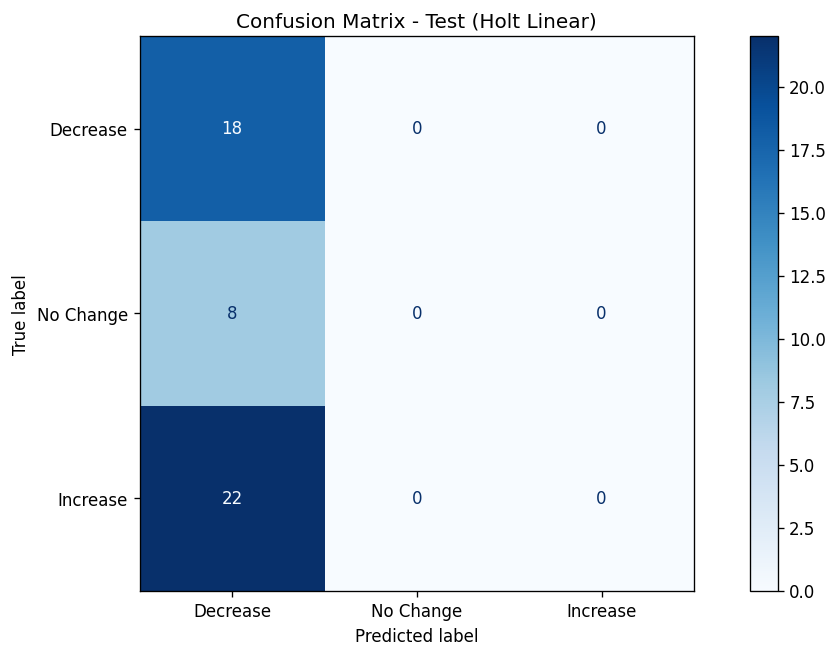

In [127]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import numpy as np


train_actual_changes = np.sign(np.diff(train['SerieA'].values))
train_predicted_changes = np.sign(np.diff(train['Holt_linear_forecast'].values))


test_actual_changes = np.sign(np.diff(test['SerieA'].values))
test_predicted_changes = np.sign(np.diff(test['Holt_linear_forecast'].values))


cm_train = confusion_matrix(train_actual_changes, train_predicted_changes, labels=[-1, 0, 1])
cm_test = confusion_matrix(test_actual_changes, test_predicted_changes, labels=[-1, 0, 1])




disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=['Decrease', 'No Change', 'Increase'])
disp_test.plot(cmap='Blues')
plt.title('Confusion Matrix - Test (Holt Linear)')
plt.show()
    

### Holt-Winters Exponential Model

/opt/homebrew/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


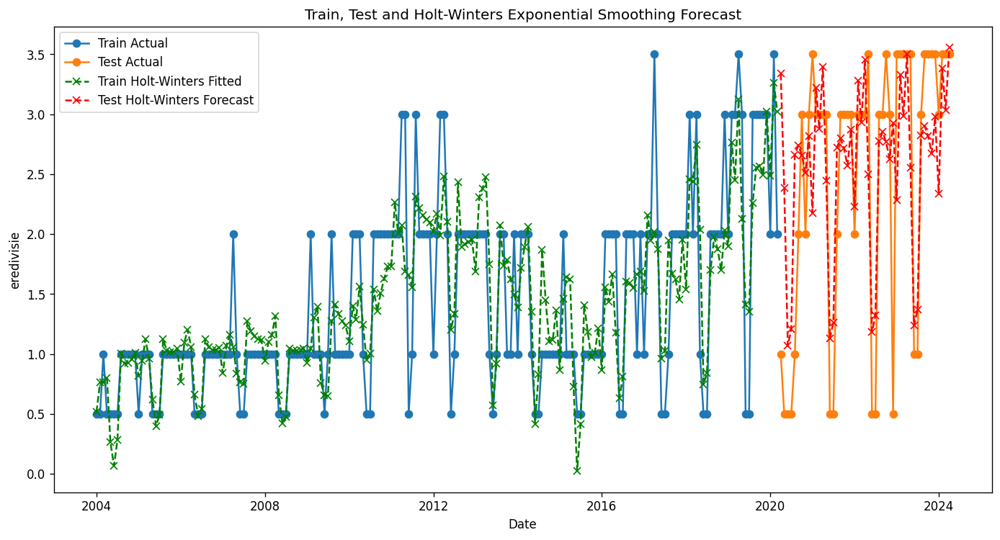

Train MAE: 0.32417931708359626
Train MSE: 0.1876490565377271
Train RMSE: 0.43318478336355154
Train MAPE: 28.46068746736722
Test MAE: 0.6063626912823619
Test MSE: 0.6557877929631853
Test RMSE: 0.8098072566748123
Test MAPE: 55.208342094665575


In [128]:
seasonal_periods = 12
model = ExponentialSmoothing(
    train['eredivisie'],
    seasonal='add',
    trend='add',
    seasonal_periods=seasonal_periods,
    damped_trend=True,
    initialization_method="estimated"
).fit()

train['Holt_Winters_fitted'] = model.fittedvalues

forecast = model.forecast(len(test))

test['Holt_Winters_forecast'] = forecast.values

train_mae = mean_absolute_error(train['eredivisie'], train['Holt_Winters_fitted'])
train_mse = mean_squared_error(train['eredivisie'], train['Holt_Winters_fitted'])
train_rmse = np.sqrt(train_mse)
train_mape = calculate_mape(train['eredivisie'], train['Holt_Winters_fitted'])

test_mae = mean_absolute_error(test['eredivisie'], test['Holt_Winters_forecast'])
test_mse = mean_squared_error(test['eredivisie'], test['Holt_Winters_forecast'])
test_rmse = np.sqrt(test_mse)
test_mape = calculate_mape(test['eredivisie'], test['Holt_Winters_forecast'])

plt.figure(figsize=(14, 7))
plt.plot(train.index, train['eredivisie'], label='Train Actual', marker='o')
plt.plot(test.index, test['eredivisie'], label='Test Actual', marker='o')
plt.plot(train.index, train['Holt_Winters_fitted'], label='Train Holt-Winters Fitted', linestyle='--', marker='x', color='green')
plt.plot(test.index, test['Holt_Winters_forecast'], label='Test Holt-Winters Forecast', linestyle='--', marker='x', color='red')
plt.title('Train, Test and Holt-Winters Exponential Smoothing Forecast')
plt.xlabel('Date')
plt.ylabel('eredivisie')
plt.legend()
plt.show()

print(f'Train MAE: {train_mae}')
print(f'Train MSE: {train_mse}')
print(f'Train RMSE: {train_rmse}')
print(f'Train MAPE: {train_mape}')
print(f'Test MAE: {test_mae}')
print(f'Test MSE: {test_mse}')
print(f'Test RMSE: {test_rmse}')
print(f'Test MAPE: {test_mape}')


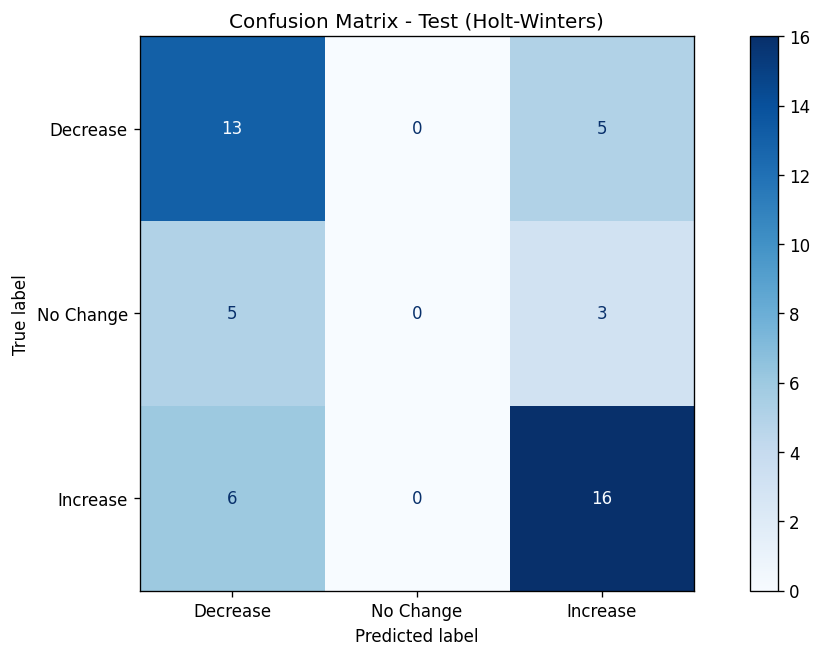

In [129]:

actual_train_change = np.sign(np.diff(train['SerieA'].values))
actual_test_change = np.sign(np.diff(test['SerieA'].values))

predicted_train_change = np.sign(np.diff(train['Holt_Winters_fitted'].values))
predicted_test_change = np.sign(np.diff(test['Holt_Winters_forecast'].values))

cm_train = confusion_matrix(actual_train_change, predicted_train_change, labels=[-1, 0, 1])
cm_test = confusion_matrix(actual_test_change, predicted_test_change, labels=[-1, 0, 1])


disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=['Decrease', 'No Change', 'Increase'])
disp_test.plot(cmap='Blues')
plt.title('Confusion Matrix - Test (Holt-Winters)')
plt.show()


### SARIMA MODEL

/opt/homebrew/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/homebrew/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.25085D-01    |proj g|=  4.28800D-01

At iterate    5    f=  5.87645D-01    |proj g|=  1.37598D-01

At iterate   10    f=  5.69616D-01    |proj g|=  1.09388D-02

At iterate   15    f=  5.69599D-01    |proj g|=  2.13090D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     15     18      1     0     0   2.131D-06   5.696D-01
  F =  0.56959884201496203     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


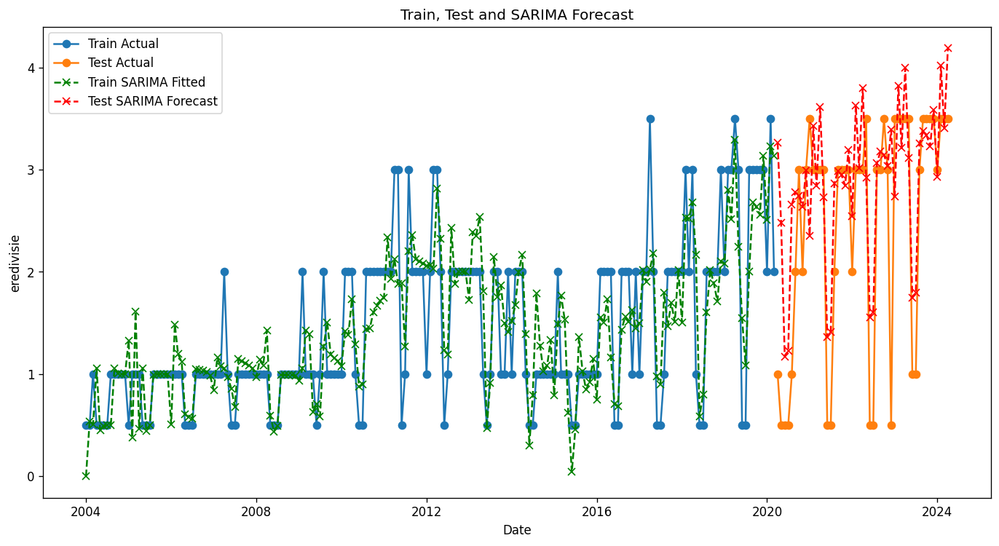

Train MAE: 0.3318364640989751
Train MSE: 0.20117230034482628
Train RMSE: 0.4485223521128309
Train MAPE: 29.44059992054835
Test MAE: 0.591293983486713
Test MSE: 0.6943737784090199
Test RMSE: 0.833290932633387
Test MAPE: 62.19327738244548


In [130]:
model = SARIMAX(train['eredivisie'], order=order, seasonal_order=seasonal_order, enforce_stationarity=False, enforce_invertibility=False).fit()

train['SARIMA_fitted'] = model.fittedvalues

forecast = model.forecast(steps=len(test))

test['SARIMA_forecast'] = forecast.values

train_mae = mean_absolute_error(train['eredivisie'], train['SARIMA_fitted'])
train_mse = mean_squared_error(train['eredivisie'], train['SARIMA_fitted'])
train_rmse = np.sqrt(train_mse)
train_mape = calculate_mape(train['eredivisie'], train['SARIMA_fitted'])

test_mae = mean_absolute_error(test['eredivisie'], test['SARIMA_forecast'])
test_mse = mean_squared_error(test['eredivisie'], test['SARIMA_forecast'])
test_rmse = np.sqrt(test_mse)
test_mape = calculate_mape(test['eredivisie'], test['SARIMA_forecast'])

plt.figure(figsize=(14, 7))
plt.plot(train.index, train['eredivisie'], label='Train Actual', marker='o')
plt.plot(test.index, test['eredivisie'], label='Test Actual', marker='o')
plt.plot(train.index, train['SARIMA_fitted'], label='Train SARIMA Fitted', linestyle='--', marker='x', color='green')
plt.plot(test.index, test['SARIMA_forecast'], label='Test SARIMA Forecast', linestyle='--', marker='x', color='red')
plt.title('Train, Test and SARIMA Forecast')
plt.xlabel('Date')
plt.ylabel('eredivisie')
plt.legend()
plt.show()

print(f'Train MAE: {train_mae}')
print(f'Train MSE: {train_mse}')
print(f'Train RMSE: {train_rmse}')
print(f'Train MAPE: {train_mape}')
print(f'Test MAE: {test_mae}')
print(f'Test MSE: {test_mse}')
print(f'Test RMSE: {test_rmse}')
print(f'Test MAPE: {test_mape}')


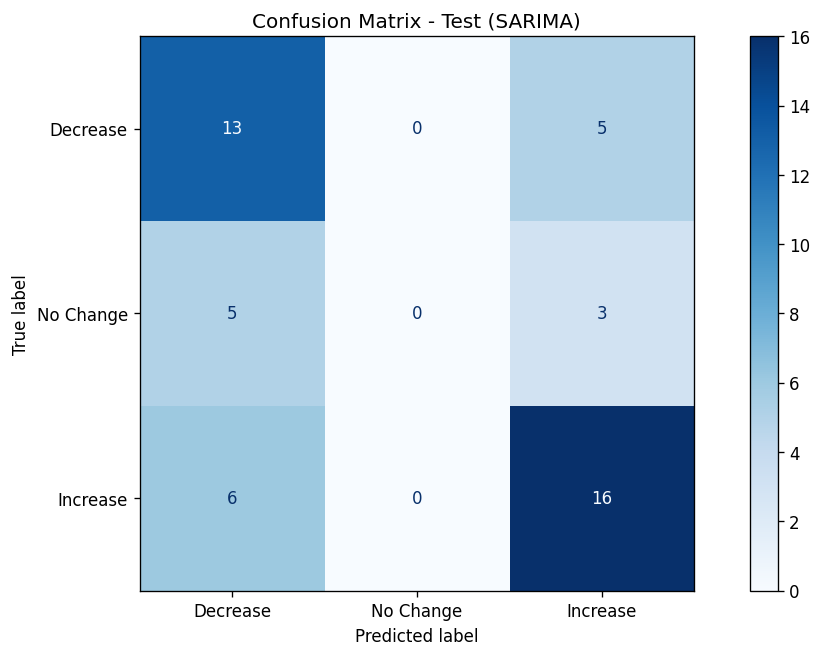

In [131]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt


train_actual_changes = np.sign(np.diff(train['SerieA'].values))
train_predicted_changes = np.sign(np.diff(train['SARIMA_fitted'].values))

test_actual_changes = np.sign(np.diff(test['SerieA'].values))
test_predicted_changes = np.sign(np.diff(test['SARIMA_forecast'].values))

cm_train = confusion_matrix(train_actual_changes, train_predicted_changes, labels=[-1, 0, 1])
cm_test = confusion_matrix(test_actual_changes, test_predicted_changes, labels=[-1, 0, 1])

disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=['Decrease', 'No Change', 'Increase'])
disp_test.plot(cmap='Blues')
plt.title('Confusion Matrix - Test (SARIMA)')
plt.show()


### Random Forest

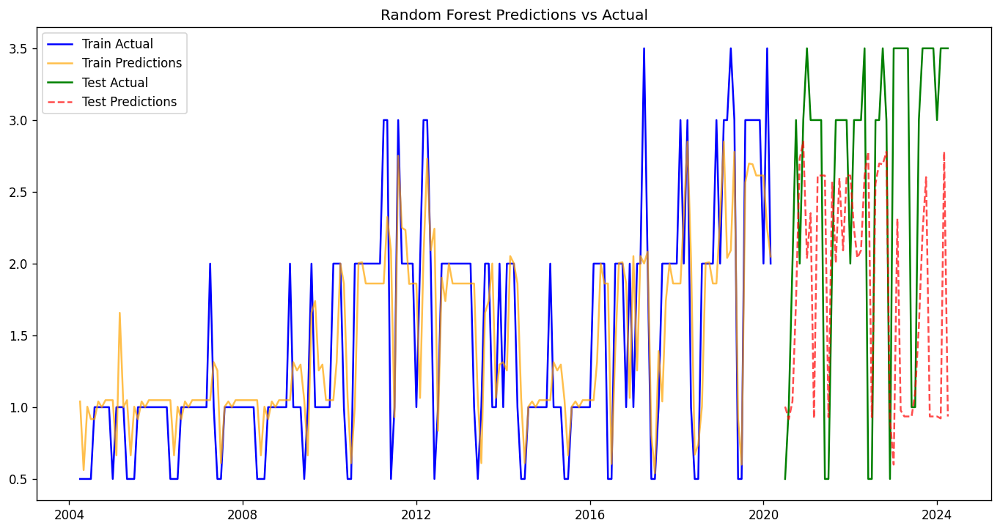

Train MAE: 0.33441924488063096
Train MSE: 0.2534315086385342
Train RMSE: 0.5034198135140632
Train MAPE: 31.914634653663153%
Test MAE: 1.131804292879021
Test MSE: 2.0144142555558067
Test RMSE: 1.419300621981054
Test MAPE: 58.606560812280286%


In [132]:
from sklearn.ensemble import RandomForestRegressor
def create_lagged_features(df, n_lags):
    return pd.concat([df.shift(i) for i in range(1, n_lags + 1)], axis=1)

n_lags = 3
train_lagged = create_lagged_features(train['eredivisie'], n_lags).dropna()
test_lagged = create_lagged_features(test['eredivisie'], n_lags).dropna()

train_X = train_lagged
train_y = train['eredivisie'][n_lags:]
test_X = test_lagged
test_y = test['eredivisie'][n_lags:]

rf = RandomForestRegressor(n_estimators=100, random_state=0)
rf.fit(train_X, train_y)

train_predictions = rf.predict(train_X)
test_predictions = rf.predict(test_X)

train_mae = mean_absolute_error(train_y, train_predictions)
train_mse = mean_squared_error(train_y, train_predictions)
train_rmse = np.sqrt(train_mse)
train_mape = np.mean(np.abs((train_y - train_predictions) / train_y)) * 100

test_mae = mean_absolute_error(test_y, test_predictions)
test_mse = mean_squared_error(test_y, test_predictions)
test_rmse = np.sqrt(test_mse)
test_mape = np.mean(np.abs((test_y - test_predictions) / test_y)) * 100

plt.figure(figsize=(14, 7))
plt.plot(train['eredivisie'].index[n_lags:], train_y, label='Train Actual', color='blue')
plt.plot(train['eredivisie'].index[n_lags:], train_predictions, label='Train Predictions', color='orange', alpha=0.7)
plt.plot(test['eredivisie'].index[n_lags:], test_y, label='Test Actual', color='green')
plt.plot(test['eredivisie'].index[n_lags:], test_predictions, label='Test Predictions', color='red', linestyle='--', alpha=0.7)
plt.title('Random Forest Predictions vs Actual')
plt.legend()
plt.show()

print(f'Train MAE: {train_mae}')
print(f'Train MSE: {train_mse}')
print(f'Train RMSE: {train_rmse}')
print(f'Train MAPE: {train_mape}%')
print(f'Test MAE: {test_mae}')
print(f'Test MSE: {test_mse}')
print(f'Test RMSE: {test_rmse}')
print(f'Test MAPE: {test_mape}%')


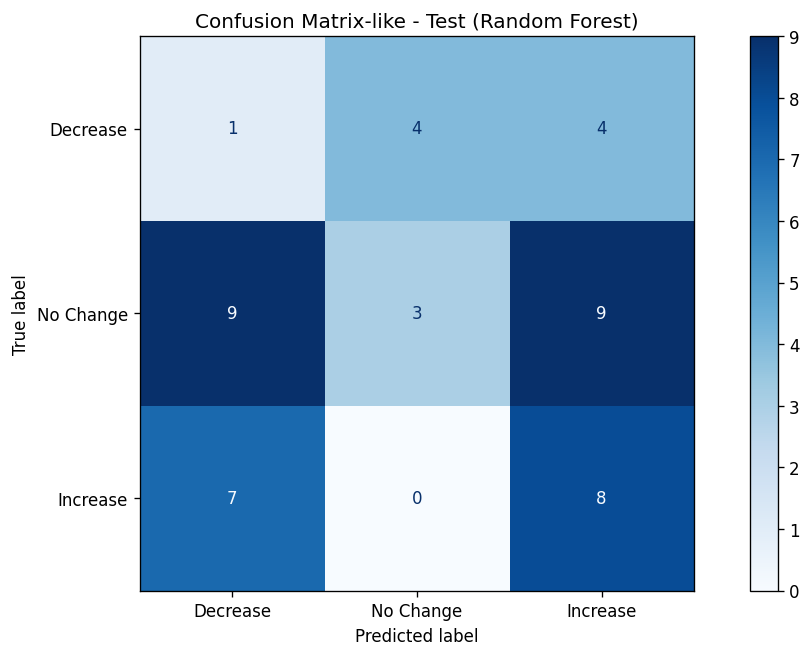

In [133]:

actual_train_change = np.sign(train_y.values[1:] - train_y.values[:-1])
actual_test_change = np.sign(test_y.values[1:] - test_y.values[:-1])

predicted_train_change = np.sign(train_predictions[1:] - train_predictions[:-1])
predicted_test_change = np.sign(test_predictions[1:] - test_predictions[:-1])

cm_train = confusion_matrix(actual_train_change, predicted_train_change, labels=[-1, 0, 1])
cm_test = confusion_matrix(actual_test_change, predicted_test_change, labels=[-1, 0, 1])


disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=['Decrease', 'No Change', 'Increase'])
disp_test.plot(cmap='Blues')
plt.title('Confusion Matrix-like - Test (Random Forest)')
plt.show()


### Theta Method

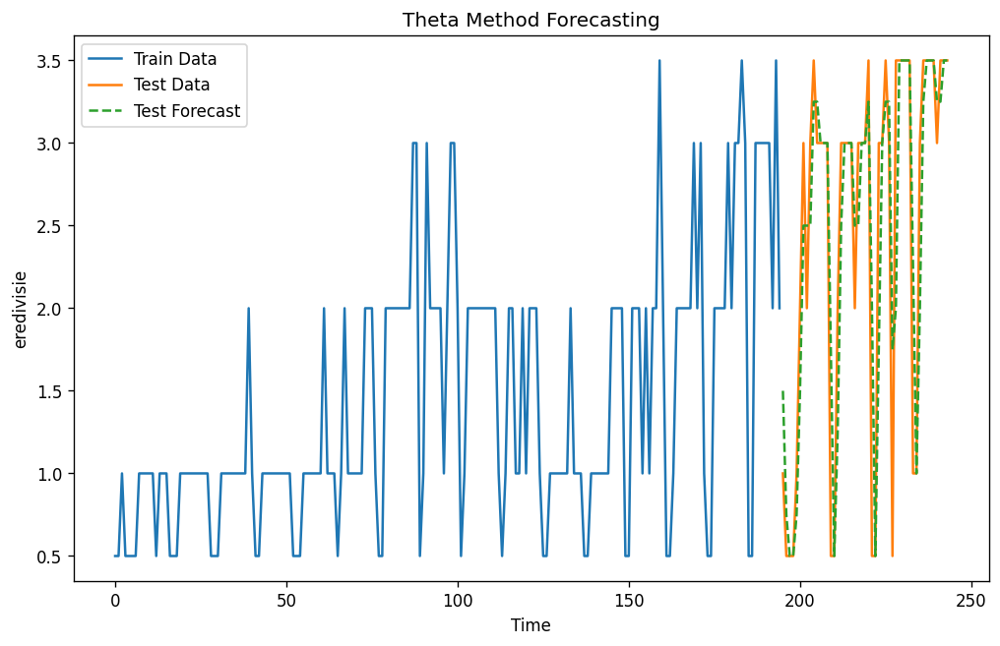

Train MSE: 0.5193298969072165
Train MAE: 0.4639175257731959
Train RMSE: 0.7206454724115157
Train MAPE: 46.2107265586647
Test MSE: 0.3048469387755102
Test MAE: 0.33163265306122447
Test RMSE: 0.5521294583478681
Test MAPE: 28.729348882410104


In [134]:
def theta_method(series, theta):
    n = len(series)
    if n == 0:
        raise ValueError("Empty series provided.")
    elif n == 1:
        return series[0]
    elif n == 2:
        return series[1]
    
    forecasts = []
    for i in range(1, n):
        forecasts.append(theta * series[i-1] + (1 - theta) * series[i])
    
    return forecasts[-1]

train_series = train['eredivisie'].values
test_series = test['eredivisie'].values

theta = 0.5  # Example theta parameter

train_forecasts = [theta_method(train_series[:i], theta) for i in range(1, len(train_series))]
test_forecasts = [theta_method(np.append(train_series, test_series[:i]), theta) for i in range(1, len(test_series)+1)]

train_mse = mean_squared_error(train_series[1:], train_forecasts)
train_mae = mean_absolute_error(train_series[1:], train_forecasts)
train_rmse = np.sqrt(train_mse)
train_mape = np.mean(np.abs((train_series[1:] - train_forecasts) / train_series[1:])) * 100

test_mse = mean_squared_error(test_series, test_forecasts)
test_mae = mean_absolute_error(test_series, test_forecasts)
test_rmse = np.sqrt(test_mse)
test_mape = np.mean(np.abs((test_series - test_forecasts) / test_series)) * 100

plt.figure(figsize=(10, 6))
plt.plot(train_series, label='Train Data')
plt.plot(np.arange(len(train_series), len(train_series) + len(test_series)), test_series, label='Test Data')
plt.plot(np.arange(len(train_series), len(train_series) + len(test_series)), test_forecasts, label='Test Forecast', linestyle='--')
plt.xlabel('Time')
plt.ylabel('eredivisie')
plt.title('Theta Method Forecasting')
plt.legend()
plt.show()

print(f'Train MSE: {train_mse}')
print(f'Train MAE: {train_mae}')
print(f'Train RMSE: {train_rmse}')
print(f'Train MAPE: {train_mape}')

print(f'Test MSE: {test_mse}')
print(f'Test MAE: {test_mae}')
print(f'Test RMSE: {test_rmse}')
print(f'Test MAPE: {test_mape}')


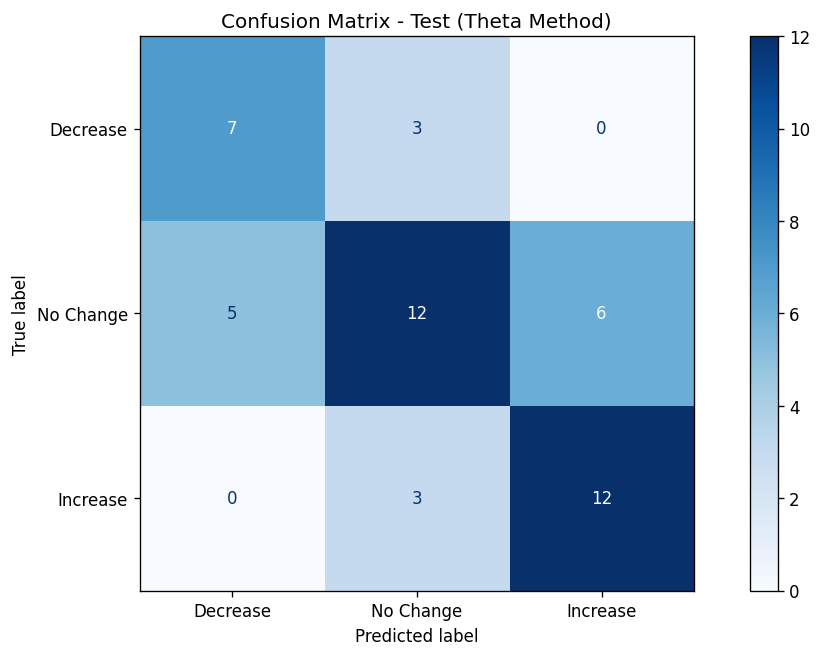

In [135]:
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

actual_test_change = np.diff(test_series)  
actual_test_change_cat = np.sign(actual_test_change) 

forecast_test_change = np.array(test_forecasts[1:]) - np.array(test_forecasts[:-1])  
forecast_test_change_cat = np.sign(forecast_test_change)

cm_test = confusion_matrix(actual_test_change_cat, forecast_test_change_cat, labels=[-1, 0, 1])


disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=['Decrease', 'No Change', 'Increase'])
disp_test.plot(cmap='Blues')
plt.title('Confusion Matrix - Test (Theta Method)')
plt.show()


Compared to the other models, the theta model seems to be more accurate

### Support Vector Machine

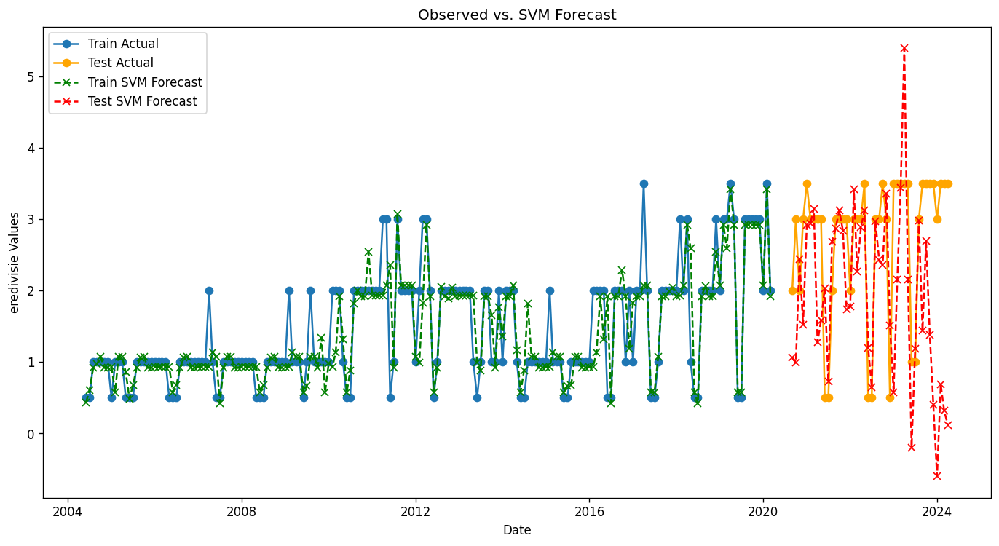

Train RMSE: 0.41350191082311927, Test RMSE: 1.507622356048138
Train MSE: 0.17098383025437086, Test MSE: 2.2729251684561387
Train MAE: 0.23455166792848195, Test MAE: 1.1082278811778694
Train MAPE: 71.67%, Test MAPE: 78.36%


In [136]:
import numpy as np
import pandas as pd
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

scaler = StandardScaler()
train_scaled = scaler.fit_transform(train[['eredivisie']])
test_scaled = scaler.transform(test[['eredivisie']])

def create_features(data, lag=1):
    X, y = [], []
    for i in range(lag, len(data)):
        X.append(data[i-lag:i].flatten())
        y.append(data[i])
    return np.array(X), np.array(y)

def calculate_mape(actual, forecast):
    actual, forecast = np.array(actual), np.array(forecast)
    actual = np.where(actual == 0, np.finfo(float).eps, actual)
    return np.mean(np.abs((actual - forecast) / actual)) * 100

lag = 5
X_train, y_train = create_features(train_scaled, lag)
X_test, y_test = create_features(test_scaled, lag)

model = SVR(kernel='rbf', C=100, gamma=0.1, epsilon=0.1)
model.fit(X_train, y_train.ravel())

train_pred_scaled = model.predict(X_train)
test_pred_scaled = model.predict(X_test)

train_pred = scaler.inverse_transform(train_pred_scaled.reshape(-1, 1))
test_pred = scaler.inverse_transform(test_pred_scaled.reshape(-1, 1))

train_rmse = np.sqrt(mean_squared_error(train['eredivisie'][lag:], train_pred))
test_rmse = np.sqrt(mean_squared_error(test['eredivisie'][lag:], test_pred))
train_mse = mean_squared_error(train['eredivisie'][lag:], train_pred)
test_mse = mean_squared_error(test['eredivisie'][lag:], test_pred)
train_mae = mean_absolute_error(train['eredivisie'][lag:], train_pred)
test_mae = mean_absolute_error(test['eredivisie'][lag:], test_pred)
train_mape = calculate_mape(train['eredivisie'][lag:], train_pred)
test_mape = calculate_mape(test['eredivisie'][lag:], test_pred)

plt.figure(figsize=(14, 7))
plt.plot(train.index[lag:], train['eredivisie'][lag:], label='Train Actual', marker='o')
plt.plot(test.index[lag:], test['eredivisie'][lag:], label='Test Actual', marker='o', color='orange')
plt.plot(train.index[lag:], train_pred, label='Train SVM Forecast', linestyle='--', marker='x', color='green')
plt.plot(test.index[lag:], test_pred, label='Test SVM Forecast', linestyle='--', marker='x', color='red')
plt.title('Observed vs. SVM Forecast')
plt.xlabel('Date')
plt.ylabel('eredivisie Values')
plt.legend()
plt.show()

print(f'Train RMSE: {train_rmse}, Test RMSE: {test_rmse}')
print(f'Train MSE: {train_mse}, Test MSE: {test_mse}')
print(f'Train MAE: {train_mae}, Test MAE: {test_mae}')
print(f'Train MAPE: {train_mape:.2f}%, Test MAPE: {test_mape:.2f}%')


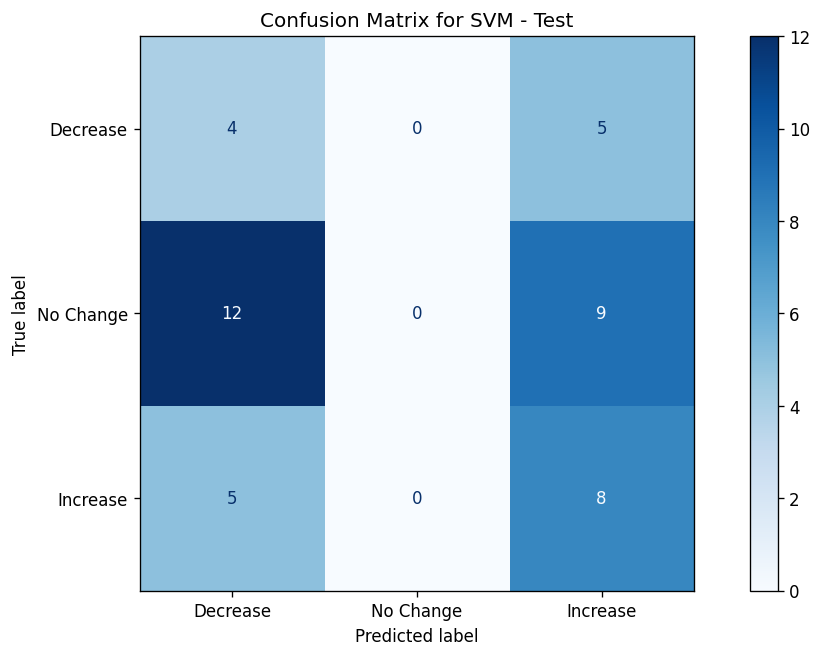

In [137]:
import numpy as np
import pandas as pd
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, mean_absolute_error, confusion_matrix, ConfusionMatrixDisplay
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt



actual_test_changes = np.sign(np.diff(test['eredivisie'].iloc[lag:]))
predicted_test_changes = np.sign(np.diff(test_pred.flatten()))

actual_test_categories = np.sign(actual_test_changes)
predicted_test_categories = np.sign(predicted_test_changes)


cm_test = confusion_matrix(actual_test_categories, predicted_test_categories, labels=[-1, 0, 1])
disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=['Decrease', 'No Change', 'Increase'])

disp_test.plot(cmap='Blues')
plt.title('Confusion Matrix for SVM - Test')
plt.show()


### Daksh Sripada-210911408
### Siddhart Mittal-210911216
### Baibhab Patra-210911386